# Dataset Creation ( 3 elevators ,  6 floors)

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Parameters
num_floors = 6  # Floors 1 (ground floor) to 6
rush_periods = [
    {"start": "08:00:00", "end": "09:00:00", "rush_type": "morning"},  # Morning rush
    {"start": "12:00:00", "end": "13:00:00", "rush_type": "lunchtime"},  # Lunchtime rush
    {"start": "16:00:00", "end": "17:00:00", "rush_type": "evening"}  # Evening rush
]
simulation_duration = 3600 * 12  # Simulate 12 hours (8:00 AM to 8:00 PM)
time_step = 30  # Generate passengers every 30 seconds

# Initialize passenger data
passenger_data = []

# Function to check if the current time is during a rush hour
def is_rush_hour(current_time, rush_periods):
    for period in rush_periods:
        start = datetime.strptime(period["start"], "%H:%M:%S").time()
        end = datetime.strptime(period["end"], "%H:%M:%S").time()
        if start <= current_time.time() < end:
            return period["rush_type"]
    return None

# Simulate passenger arrivals
current_time = datetime.strptime("08:00:00", "%H:%M:%S")
end_time = current_time + timedelta(seconds=simulation_duration)
passenger_id = 1

while current_time < end_time:
    # Check if it's rush hour
    rush_type = is_rush_hour(current_time, rush_periods)

    # Generate passengers based on the time of day
    if rush_type == "morning":
        # Morning rush: High arrival rate at the 1st floor (ground floor)
        num_passengers = np.random.randint(5, 15)  # Random number of passengers
        floor = 1  # All passengers arrive at the 1st floor
        direction = "Up"  # All passengers go up
        destinations = np.random.choice([2, 3, 4, 5, 6], num_passengers, p=[0.2, 0.3, 0.2, 0.2, 0.1])  # Weighted destinations
    elif rush_type in ["lunchtime", "evening"]:
        # Lunchtime/Evening rush: High arrival rate on higher floors (floors 2-6)
        num_passengers = np.random.randint(5, 15)  # Random number of passengers
        floor = np.random.randint(2, num_floors + 1)  # Random higher floor
        direction = "Down"  # All passengers go down
        destinations = [1] * num_passengers  # All passengers go to the 1st floor
    else:
        # Non-rush hour: Low arrival rate across all floors
        num_passengers = np.random.randint(1, 5)  # Random number of passengers
        floor = np.random.randint(1, num_floors + 1)  # Random floor
        direction = np.random.choice(["Up", "Down"])  # Random direction

        # Ensure valid destinations
        if direction == "Up":
            if floor < num_floors:  # Can go up
                destinations = np.random.randint(floor + 1, num_floors + 1, num_passengers)  # Go to higher floors
            else:  # Already on the top floor, cannot go up
                destinations = [floor] * num_passengers  # Stay on the same floor
        else:  # Going down
            if floor > 1:  # Can go down
                destinations = np.random.randint(1, floor, num_passengers)  # Go to lower floors
            else:  # Already on the ground floor, cannot go down
                destinations = [floor] * num_passengers  # Stay on the same floor

    # Add passengers to the data
    for destination in destinations:
        passenger_data.append({
            "Passenger ID": passenger_id,
            "Time (seconds)": (current_time - datetime.strptime("08:00:00", "%H:%M:%S")).total_seconds(),
            "Floor": floor,
            "Direction (Up/Down)": direction,
            "Destination Floor": destination
        })
        passenger_id += 1

    # Move to the next time step
    current_time += timedelta(seconds=time_step)

# Save to CSV
df = pd.DataFrame(passenger_data)
df.to_csv("passengers.csv", index=False)
print("Passenger data saved to passengers.csv")

<Figure size 1200x600 with 0 Axes>

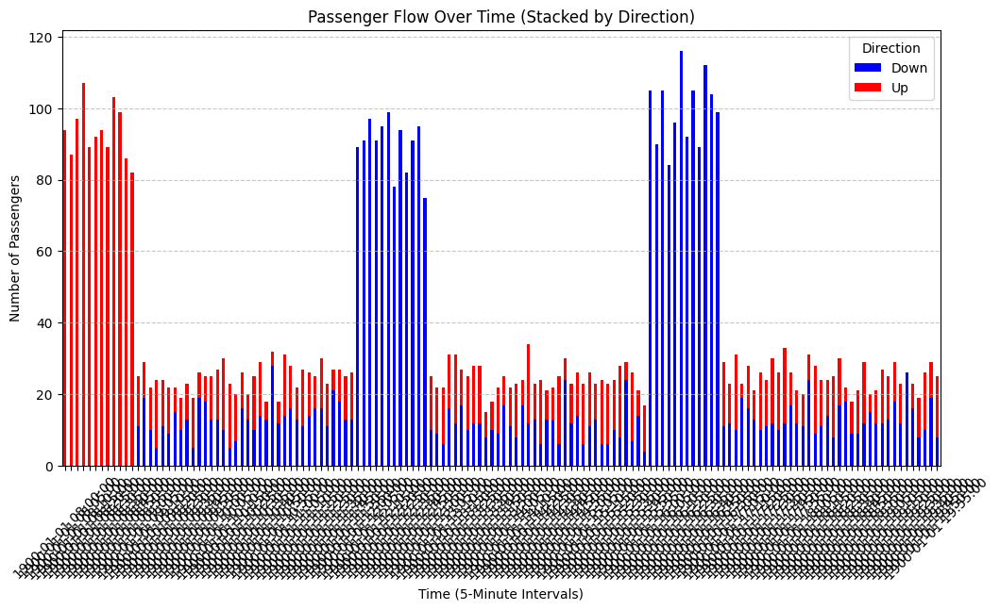

<Figure size 1000x600 with 0 Axes>

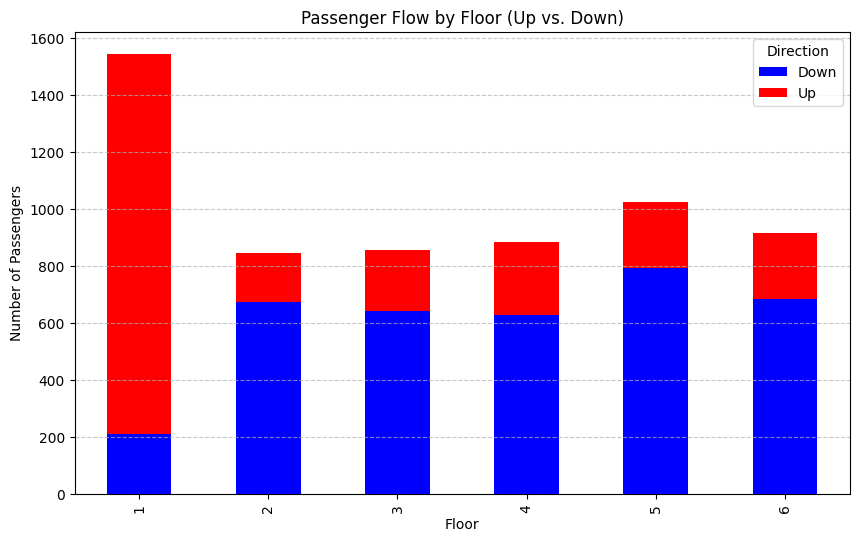

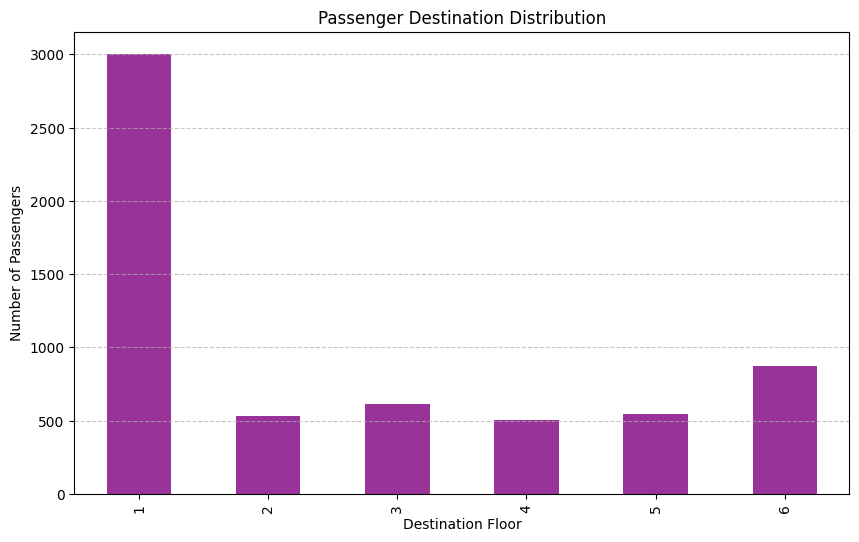

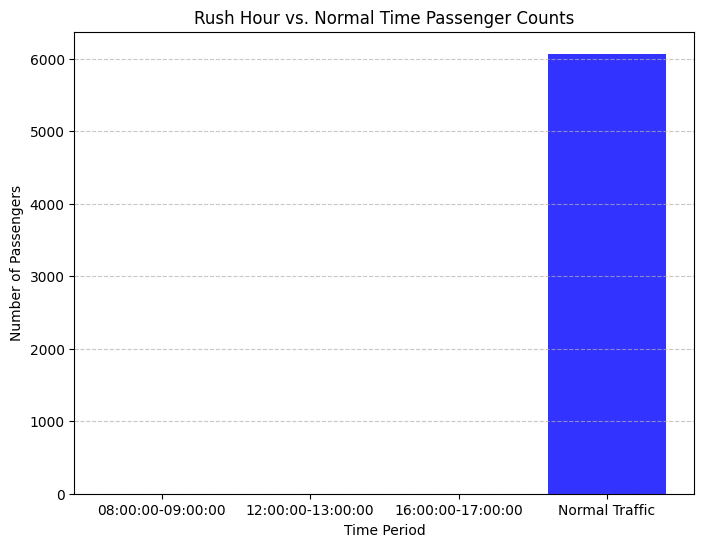

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ✅ Load the dataset
df = pd.read_csv("passengers.csv")

# ✅ Convert "Time (seconds)" to actual time format
df["Time"] = pd.to_datetime("08:00:00", format="%H:%M:%S") + pd.to_timedelta(df["Time (seconds)"], unit="s")

# ✅ Group data in 5-minute intervals for better visualization
df["Time Group"] = df["Time"].dt.floor("5min")

# ✅ Count Passengers by Time & Direction
time_counts = df.groupby(["Time Group", "Direction (Up/Down)"]).size().unstack(fill_value=0)

# 🎯 Visualization 1: Passenger Flow Over Time (Stacked by Direction)
plt.figure(figsize=(12, 6))
time_counts.plot(kind="bar", stacked=True, figsize=(12, 6), color=["blue", "red"])
plt.title("Passenger Flow Over Time (Stacked by Direction)")
plt.xlabel("Time (5-Minute Intervals)")
plt.ylabel("Number of Passengers")
plt.xticks(rotation=45)
plt.legend(title="Direction")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# 🎯 Visualization 2: Passenger Flow by Floor (Up vs. Down)
floor_counts = df.groupby(["Floor", "Direction (Up/Down)"]).size().unstack(fill_value=0)

plt.figure(figsize=(10, 6))
floor_counts.plot(kind="bar", stacked=True, figsize=(10, 6), color=["blue", "red"])
plt.title("Passenger Flow by Floor (Up vs. Down)")
plt.xlabel("Floor")
plt.ylabel("Number of Passengers")
plt.legend(title="Direction")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# 🎯 Visualization 3: Passenger Destination Distribution
destination_counts = df["Destination Floor"].value_counts().sort_index()

plt.figure(figsize=(10, 6))
destination_counts.plot(kind="bar", color="purple", alpha=0.8)
plt.title("Passenger Destination Distribution")
plt.xlabel("Destination Floor")
plt.ylabel("Number of Passengers")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

# 🎯 Visualization 4: Rush Hour vs. Normal Time Passenger Counts
rush_hours = ["08:00:00-09:00:00", "12:00:00-13:00:00", "16:00:00-17:00:00"]
time_ranges = [("08:00:00", "09:00:00"), ("12:00:00", "13:00:00"), ("16:00:00", "17:00:00")]

rush_data = []
for label, (start, end) in zip(rush_hours, time_ranges):
    mask = (df["Time"] >= start) & (df["Time"] <= end)
    rush_data.append(df.loc[mask].shape[0])

normal_traffic = df.shape[0] - sum(rush_data)

rush_labels = rush_hours + ["Normal Traffic"]
rush_counts = rush_data + [normal_traffic]

plt.figure(figsize=(8, 6))
plt.bar(rush_labels, rush_counts, color=["orange", "green", "red", "blue"], alpha=0.8)
plt.title("Rush Hour vs. Normal Time Passenger Counts")
plt.xlabel("Time Period")
plt.ylabel("Number of Passengers")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


# 02

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

# Parameters
num_floors = 6  # Floors 1 (ground floor) to 6
rush_periods = [
    {"start": "08:00:00", "end": "09:00:00", "rush_type": "morning"},  # Morning rush
    {"start": "12:00:00", "end": "13:00:00", "rush_type": "lunchtime"},  # Lunchtime rush
    {"start": "16:00:00", "end": "17:00:00", "rush_type": "evening"}  # Evening rush
]
simulation_duration = 3600 * 12  # Simulate 12 hours (8:00 AM to 8:00 PM)
time_step = 30  # Generate passengers every 30 seconds

# Initialize passenger data
passenger_data = []

# Function to check if the current time is during a rush hour
def is_rush_hour(current_time, rush_periods):
    for period in rush_periods:
        start = datetime.strptime(period["start"], "%H:%M:%S").time()
        end = datetime.strptime(period["end"], "%H:%M:%S").time()
        if start <= current_time.time() < end:
            return period["rush_type"]
    return None

# Simulate passenger arrivals
current_time = datetime.strptime("08:00:00", "%H:%M:%S")
end_time = current_time + timedelta(seconds=simulation_duration)
passenger_id = 1

while current_time < end_time:
    # Check if it's rush hour
    rush_type = is_rush_hour(current_time, rush_periods)

    # Generate passengers based on the time of day
    if rush_type == "morning":
        # Morning rush: High arrival rate at the 1st floor (ground floor)
        num_passengers = np.random.randint(5, 15)  # Random number of passengers
        floor = 1  # All passengers arrive at the 1st floor
        direction = "Up"  # All passengers go up
        destinations = np.random.choice([2, 3, 4, 5, 6], num_passengers, p=[0.2, 0.3, 0.2, 0.2, 0.1])  # Weighted destinations
    elif rush_type in ["lunchtime", "evening"]:
        # Lunchtime/Evening rush: High arrival rate on higher floors (floors 2-6)
        num_passengers = np.random.randint(5, 15)  # Random number of passengers
        floor = np.random.randint(2, num_floors + 1)  # Random higher floor
        direction = "Down"  # All passengers go down
        destinations = [1] * num_passengers  # All passengers go to the 1st floor
    else:
        # Non-rush hour: Low arrival rate across all floors
        num_passengers = np.random.randint(1, 5)  # Random number of passengers
        floor = np.random.randint(1, num_floors + 1)  # Random floor
        direction = np.random.choice(["Up", "Down"])  # Random direction

        # Ensure valid destinations
        if direction == "Up":
            if floor < num_floors:  # Can go up
                destinations = np.random.randint(floor + 1, num_floors + 1, num_passengers)  # Go to higher floors
            else:  # Already on the top floor, cannot go up
                destinations = [floor] * num_passengers  # Stay on the same floor
        else:  # Going down
            if floor > 1:  # Can go down
                destinations = np.random.randint(1, floor, num_passengers)  # Go to lower floors
            else:  # Already on the ground floor, cannot go down
                destinations = [floor] * num_passengers  # Stay on the same floor

    # Add passengers to the data
    for destination in destinations:
        passenger_data.append({
            "Passenger ID": passenger_id,
            "Time": current_time.strftime("%I:%M:%S %p"),  # Format time as "8:00:00 AM"
            "Floor": floor,
            "Direction (Up/Down)": direction,
            "Destination Floor": destination
        })
        passenger_id += 1

    # Move to the next time step
    current_time += timedelta(seconds=time_step)

# Save to CSV
df = pd.DataFrame(passenger_data)
df.to_csv("passengers_01.csv", index=False)
print("Passenger data saved to passengers.csv")

# Elevator Environment 


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta

# Define the Elevator class
class Elevator:
    def __init__(self, id):
        self.id = id
        self.current_floor = 1  # Start at the ground floor
        self.direction = "Idle"  # Can be "Up", "Down", or "Idle"
        self.passengers = []  # List of passengers inside the elevator
        self.requests = []  # List of pending requests

    def move(self):
        # Move the elevator based on its direction
        if self.direction == "Up":
            self.current_floor += 1
        elif self.direction == "Down":
            self.current_floor -= 1

    def pick_up(self, floor_queues):
        # Pick up passengers from the current floor if the elevator is idle or moving in the right direction
        if self.current_floor in floor_queues:
            passengers_to_pick = []
            for passenger in floor_queues[self.current_floor]:
                if (self.direction == "Up" and passenger["Destination Floor"] > self.current_floor) or \
                   (self.direction == "Down" and passenger["Destination Floor"] < self.current_floor) or \
                   (self.direction == "Idle"):
                    passengers_to_pick.append(passenger)
            for passenger in passengers_to_pick:
                self.passengers.append(passenger)
                self.requests.append(passenger["Destination Floor"])
                floor_queues[self.current_floor].remove(passenger)
            if passengers_to_pick:
                self.direction = "Up" if self.requests[0] > self.current_floor else "Down"

    def drop_off(self):
        # Drop off passengers at their destination floor
        passengers_to_drop = [p for p in self.passengers if p["Destination Floor"] == self.current_floor]
        for passenger in passengers_to_drop:
            # Convert passenger to a dictionary if it's a Pandas Series
            if isinstance(passenger, pd.Series):
                passenger = passenger.to_dict()
            # Remove the passenger from the list
            self.passengers = [p for p in self.passengers if p != passenger]
            self.requests.remove(passenger["Destination Floor"])
        if not self.requests:
            self.direction = "Idle"

# Define the Building class
class Building:
    def __init__(self, num_floors, num_elevators):
        self.num_floors = num_floors
        self.elevators = [Elevator(i) for i in range(num_elevators)]
        self.floor_queues = {floor: [] for floor in range(1, num_floors + 1)}  # Passenger queues on each floor
        self.metrics = {
            "wait_times": [],
            "energy_consumption": 0,
            "elevator_utilization": [0] * num_elevators
        }

    def simulate(self, passenger_data):
        current_time = datetime.strptime("08:00:00", "%H:%M:%S")
        end_time = current_time + timedelta(seconds=12 * 3600)  # Simulate 12 hours

        for _, row in passenger_data.iterrows():
            passenger_time = datetime.strptime(row["Time"], "%I:%M:%S %p")
            while current_time < passenger_time:
                # Simulate elevator movements and updates
                for elevator in self.elevators:
                    elevator.move()
                    elevator.pick_up(self.floor_queues)
                    elevator.drop_off()
                    # Track energy consumption (1 unit per floor moved)
                    if elevator.direction != "Idle":
                        self.metrics["energy_consumption"] += 1
                current_time += timedelta(seconds=1)

            # Add the passenger to the appropriate floor queue
            self.floor_queues[row["Floor"]].append(row.to_dict())  # Convert row to dictionary

        # Calculate wait times
        for floor, queue in self.floor_queues.items():
            for passenger in queue:
                wait_time = (datetime.strptime(passenger["Time"], "%I:%M:%S %p") - datetime.strptime("08:00:00", "%H:%M:%S")).total_seconds()
                self.metrics["wait_times"].append(wait_time)

        # Calculate elevator utilization
        for i, elevator in enumerate(self.elevators):
            self.metrics["elevator_utilization"][i] = len(elevator.passengers)

    def visualize(self):
        # Visualize the building, elevators, and passenger queues
        fig, ax = plt.subplots()
        ax.set_xlim(0, self.num_floors + 1)
        ax.set_ylim(0, len(self.elevators) + 1)
        ax.set_xlabel("Floors")
        ax.set_ylabel("Elevators")
        ax.set_title("Elevator Simulation")

        # Plot elevators
        for i, elevator in enumerate(self.elevators):
            ax.plot(elevator.current_floor, i + 1, "ro", markersize=10, label=f"Elevator {elevator.id}")

        # Plot passenger queues
        for floor, queue in self.floor_queues.items():
            if queue:
                ax.text(floor, 0, f"{len(queue)}", fontsize=12, ha="center", va="bottom")

        plt.legend()
        plt.show()

# Load the passenger dataset
passenger_data = pd.read_csv("passengers_01.csv")

# Initialize the building and elevators
building = Building(num_floors=6, num_elevators=3)

# Run the simulation
building.simulate(passenger_data)

# Visualize the simulation
building.visualize()

# Print metrics
print("Metrics:")
print(f"Average Wait Time: {sum(building.metrics['wait_times']) / len(building.metrics['wait_times']):.2f} seconds")
print(f"Total Energy Consumption: {building.metrics['energy_consumption']} units")
print(f"Elevator Utilization: {building.metrics['elevator_utilization']}")

In [ ]:
import pygame
from pygame.locals import *
from OpenGL.GL import *
from OpenGL.GLU import *
import glm
import pandas as pd
from datetime import datetime, timedelta

# Define the Elevator class
class Elevator:
    def __init__(self, id):
        self.id = id
        self.current_floor = 1  # Start at the ground floor
        self.direction = "Idle"  # Can be "Up", "Down", or "Idle"
        self.passengers = []  # List of passengers inside the elevator
        self.requests = []  # List of pending requests

    def move(self):
        # Move the elevator based on its direction
        if self.direction == "Up":
            self.current_floor += 1
        elif self.direction == "Down":
            self.current_floor -= 1

    def pick_up(self, floor_queues):
        # Pick up passengers from the current floor if the elevator is idle or moving in the right direction
        if self.current_floor in floor_queues:
            passengers_to_pick = []
            for passenger in floor_queues[self.current_floor]:
                if (self.direction == "Up" and passenger["Destination Floor"] > self.current_floor) or \
                   (self.direction == "Down" and passenger["Destination Floor"] < self.current_floor) or \
                   (self.direction == "Idle"):
                    passengers_to_pick.append(passenger)
            for passenger in passengers_to_pick:
                self.passengers.append(passenger)
                self.requests.append(passenger["Destination Floor"])
                floor_queues[self.current_floor].remove(passenger)
            if passengers_to_pick:
                self.direction = "Up" if self.requests[0] > self.current_floor else "Down"

    def drop_off(self):
        # Drop off passengers at their destination floor
        passengers_to_drop = [p for p in self.passengers if p["Destination Floor"] == self.current_floor]
        for passenger in passengers_to_drop:
            # Convert passenger to a dictionary if it's a Pandas Series
            if isinstance(passenger, pd.Series):
                passenger = passenger.to_dict()
            # Remove the passenger from the list
            self.passengers = [p for p in self.passengers if p != passenger]
            self.requests.remove(passenger["Destination Floor"])
        if not self.requests:
            self.direction = "Idle"

# Define the Building class
class Building:
    def __init__(self, num_floors, num_elevators):
        self.num_floors = num_floors
        self.elevators = [Elevator(i) for i in range(num_elevators)]
        self.floor_queues = {floor: [] for floor in range(1, num_floors + 1)}  # Passenger queues on each floor
        self.metrics = {
            "wait_times": [],
            "energy_consumption": 0,
            "elevator_utilization": [0] * num_elevators
        }

    def simulate(self, passenger_data):
        current_time = datetime.strptime("08:00:00", "%H:%M:%S")
        end_time = current_time + timedelta(seconds=12 * 3600)  # Simulate 12 hours

        for _, row in passenger_data.iterrows():
            passenger_time = datetime.strptime(row["Time"], "%I:%M:%S %p")
            while current_time < passenger_time:
                # Simulate elevator movements and updates
                for elevator in self.elevators:
                    elevator.move()
                    elevator.pick_up(self.floor_queues)
                    elevator.drop_off()
                    # Track energy consumption (1 unit per floor moved)
                    if elevator.direction != "Idle":
                        self.metrics["energy_consumption"] += 1
                current_time += timedelta(seconds=1)

            # Add the passenger to the appropriate floor queue
            self.floor_queues[row["Floor"]].append(row.to_dict())  # Convert row to dictionary

        # Calculate wait times
        for floor, queue in self.floor_queues.items():
            for passenger in queue:
                wait_time = (datetime.strptime(passenger["Time"], "%I:%M:%S %p") - datetime.strptime("08:00:00", "%H:%M:%S")).total_seconds()
                self.metrics["wait_times"].append(wait_time)

        # Calculate elevator utilization
        for i, elevator in enumerate(self.elevators):
            self.metrics["elevator_utilization"][i] = len(elevator.passengers)

# OpenGL Visualization
def draw_cube(x, y, z, size=1):
    vertices = [
        [x - size, y - size, z - size],
        [x + size, y - size, z - size],
        [x + size, y + size, z - size],
        [x - size, y + size, z - size],
        [x - size, y - size, z + size],
        [x + size, y - size, z + size],
        [x + size, y + size, z + size],
        [x - size, y + size, z + size]
    ]
    edges = [
        (0, 1), (1, 2), (2, 3), (3, 0),
        (4, 5), (5, 6), (6, 7), (7, 4),
        (0, 4), (1, 5), (2, 6), (3, 7)
    ]
    glBegin(GL_LINES)
    for edge in edges:
        for vertex in edge:
            glVertex3fv(vertices[vertex])
    glEnd()

def render_building(building):
    # Draw the building
    glColor3f(0.5, 0.5, 0.5)  # Gray color
    for floor in range(1, building.num_floors + 1):
        draw_cube(0, 0, floor * 2, size=5)  # Each floor is 2 units high

    # Draw elevators
    glColor3f(1, 0, 0)  # Red color
    for elevator in building.elevators:
        draw_cube(elevator.id * 3 - 4.5, 0, elevator.current_floor * 2, size=0.5)

    # Draw passengers
    glColor3f(0, 1, 0)  # Green color
    for floor, queue in building.floor_queues.items():
        for i, passenger in enumerate(queue):
            draw_cube(-4 + i * 0.5, 0, floor * 2, size=0.2)

def main():
    # Load the passenger dataset
    passenger_data = pd.read_csv("passengers_01.csv")

    # Initialize the building and elevators
    building = Building(num_floors=6, num_elevators=3)

    # Run the simulation
    building.simulate(passenger_data)

    # Initialize Pygame and OpenGL
    pygame.init()
    display = (800, 600)
    pygame.display.set_mode(display, DOUBLEBUF | OPENGL)
    gluPerspective(45, (display[0] / display[1]), 0.1, 50.0)
    glTranslatef(0.0, -10.0, -20.0)  # Adjust the camera position

    # Main loop
    while True:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                quit()

        glRotatef(1, 3, 1, 1)  # Rotate the scene
        glClear(GL_COLOR_BUFFER_BIT | GL_DEPTH_BUFFER_BIT)
        render_building(building)
        pygame.display.flip()
        pygame.time.wait(10)

if __name__ == "__main__":
    main()

In [ ]:
import pygame
import pandas as pd
from datetime import datetime, timedelta

# Define the Elevator class
class Elevator:
    def __init__(self, id):
        self.id = id
        self.current_floor = 1  # Start at the ground floor
        self.direction = "Idle"  # Can be "Up", "Down", or "Idle"
        self.passengers = []  # List of passengers inside the elevator
        self.requests = []  # List of pending requests

    def move(self):
        # Move the elevator based on its direction
        if self.direction == "Up":
            self.current_floor += 1
        elif self.direction == "Down":
            self.current_floor -= 1

    def pick_up(self, floor_queues):
        # Pick up passengers from the current floor if the elevator is idle or moving in the right direction
        if self.current_floor in floor_queues:
            passengers_to_pick = []
            for passenger in floor_queues[self.current_floor]:
                if (self.direction == "Up" and passenger["Destination Floor"] > self.current_floor) or \
                   (self.direction == "Down" and passenger["Destination Floor"] < self.current_floor) or \
                   (self.direction == "Idle"):
                    passengers_to_pick.append(passenger)
            for passenger in passengers_to_pick:
                self.passengers.append(passenger)
                self.requests.append(passenger["Destination Floor"])
                floor_queues[self.current_floor].remove(passenger)
            if passengers_to_pick:
                self.direction = "Up" if self.requests[0] > self.current_floor else "Down"

    def drop_off(self):
        # Drop off passengers at their destination floor
        passengers_to_drop = [p for p in self.passengers if p["Destination Floor"] == self.current_floor]
        for passenger in passengers_to_drop:
            # Convert passenger to a dictionary if it's a Pandas Series
            if isinstance(passenger, pd.Series):
                passenger = passenger.to_dict()
            # Remove the passenger from the list
            self.passengers = [p for p in self.passengers if p != passenger]
            self.requests.remove(passenger["Destination Floor"])
        if not self.requests:
            self.direction = "Idle"

# Define the Building class
class Building:
    def __init__(self, num_floors, num_elevators):
        self.num_floors = num_floors
        self.elevators = [Elevator(i) for i in range(num_elevators)]
        self.floor_queues = {floor: [] for floor in range(1, num_floors + 1)}  # Passenger queues on each floor
        self.metrics = {
            "wait_times": [],
            "energy_consumption": 0,
            "elevator_utilization": [0] * num_elevators
        }

    def simulate(self, passenger_data):
        current_time = datetime.strptime("08:00:00", "%H:%M:%S")
        end_time = current_time + timedelta(seconds=12 * 3600)  # Simulate 12 hours

        for _, row in passenger_data.iterrows():
            passenger_time = datetime.strptime(row["Time"], "%I:%M:%S %p")
            while current_time < passenger_time:
                # Simulate elevator movements and updates
                for elevator in self.elevators:
                    elevator.move()
                    elevator.pick_up(self.floor_queues)
                    elevator.drop_off()
                    # Track energy consumption (1 unit per floor moved)
                    if elevator.direction != "Idle":
                        self.metrics["energy_consumption"] += 1
                current_time += timedelta(seconds=1)

            # Add the passenger to the appropriate floor queue
            self.floor_queues[row["Floor"]].append(row.to_dict())  # Convert row to dictionary

        # Calculate wait times
        for floor, queue in self.floor_queues.items():
            for passenger in queue:
                wait_time = (datetime.strptime(passenger["Time"], "%I:%M:%S %p") - datetime.strptime("08:00:00", "%H:%M:%S")).total_seconds()
                self.metrics["wait_times"].append(wait_time)

        # Calculate elevator utilization
        for i, elevator in enumerate(self.elevators):
            self.metrics["elevator_utilization"][i] = len(elevator.passengers)

# Pygame Visualization
def draw_building(screen, building):
    # Draw floors
    floor_height = 50
    for floor in range(1, building.num_floors + 1):
        pygame.draw.rect(screen, (200, 200, 200), (50, 600 - floor * floor_height, 700, 2))  # Floor line
        font = pygame.font.SysFont("Arial", 18)
        text = font.render(f"Floor {floor}", True, (0, 0, 0))
        screen.blit(text, (10, 600 - floor * floor_height - 20))

    # Draw elevators
    elevator_width = 40
    for i, elevator in enumerate(building.elevators):
        x = 100 + i * (elevator_width + 20)
        y = 600 - elevator.current_floor * floor_height - 30
        pygame.draw.rect(screen, (255, 0, 0), (x, y, elevator_width, 30))  # Elevator
        font = pygame.font.SysFont("Arial", 14)
        text = font.render(f"E{elevator.id + 1}", True, (255, 255, 255))
        screen.blit(text, (x + 10, y + 10))

    # Draw passengers
    for floor, queue in building.floor_queues.items():
        x = 400
        y = 600 - floor * floor_height - 20
        for i, passenger in enumerate(queue):
            pygame.draw.circle(screen, (0, 255, 0), (x + i * 20, y), 5)  # Passenger

def main():
    # Load the passenger dataset
    passenger_data = pd.read_csv("passengers.csv")

    # Initialize the building and elevators
    building = Building(num_floors=6, num_elevators=3)

    # Run the simulation
    building.simulate(passenger_data)

    # Initialize Pygame
    pygame.init()
    screen = pygame.display.set_mode((800, 600))
    pygame.display.set_caption("Elevator Simulation 2D")
    clock = pygame.time.Clock()

    # Main loop
    running = True
    while running:
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                running = False

        # Clear the screen
        screen.fill((255, 255, 255))

        # Draw the building
        draw_building(screen, building)

        # Update the display
        pygame.display.flip()
        clock.tick(30)

    pygame.quit()

if __name__ == "__main__":
    main()

In [ ]:
import pygame
import pandas as pd
from datetime import datetime, timedelta

# Define the Elevator class
class Elevator:
    def __init__(self, id):
        self.id = id
        self.current_floor = 1  # Start at the ground floor
        self.direction = "Idle"  # Can be "Up", "Down", or "Idle"
        self.passengers = []  # List of passengers inside the elevator
        self.requests = []  # List of pending requests

    def move(self):
        # Move the elevator based on its direction
        if self.direction == "Up":
            self.current_floor += 1
        elif self.direction == "Down":
            self.current_floor -= 1
        print(f"Elevator {self.id} moved to floor {self.current_floor}")  # Debug: Print elevator movement

    def pick_up(self, floor_queues):
        # Pick up passengers from the current floor if the elevator is idle or moving in the right direction
        if self.current_floor in floor_queues:
            passengers_to_pick = []
            for passenger in floor_queues[self.current_floor]:
                if (self.direction == "Up" and passenger["Destination Floor"] > self.current_floor) or \
                   (self.direction == "Down" and passenger["Destination Floor"] < self.current_floor) or \
                   (self.direction == "Idle"):
                    passengers_to_pick.append(passenger)
            for passenger in passengers_to_pick:
                self.passengers.append(passenger)
                self.requests.append(passenger["Destination Floor"])
                floor_queues[self.current_floor].remove(passenger)
                print(f"Elevator {self.id} picked up passenger at floor {self.current_floor}")  # Debug: Print passenger pickup
            if passengers_to_pick:
                self.direction = "Up" if self.requests[0] > self.current_floor else "Down"

    def drop_off(self):
        # Drop off passengers at their destination floor
        passengers_to_drop = [p for p in self.passengers if p["Destination Floor"] == self.current_floor]
        for passenger in passengers_to_drop:
            # Convert passenger to a dictionary if it's a Pandas Series
            if isinstance(passenger, pd.Series):
                passenger = passenger.to_dict()
            # Remove the passenger from the list
            self.passengers = [p for p in self.passengers if p != passenger]
            self.requests.remove(passenger["Destination Floor"])
            print(f"Elevator {self.id} dropped off passenger at floor {self.current_floor}")  # Debug: Print passenger drop-off
        if not self.requests:
            self.direction = "Idle"

# Define the Building class
class Building:
    def __init__(self, num_floors, num_elevators):
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.elevators = [Elevator(i) for i in range(num_elevators)]
        self.floor_queues = {floor: [] for floor in range(1, num_floors + 1)}  # Passenger queues on each floor
        self.metrics = {
            "wait_times": [],
            "energy_consumption": 0,
            "elevator_utilization": [0] * num_elevators
        }

    def update(self):
        # Update elevator states
        for elevator in self.elevators:
            elevator.move()
            elevator.pick_up(self.floor_queues)
            elevator.drop_off()
            # Track energy consumption (1 unit per floor moved)
            if elevator.direction != "Idle":
                self.metrics["energy_consumption"] += 1

        # Calculate elevator utilization
        for i, elevator in enumerate(self.elevators):
            self.metrics["elevator_utilization"][i] = len(elevator.passengers)

# Pygame Visualization
class Visualizer:
    def __init__(self, building):
        self.building = building
        self.screen_width = 1000  # Increased width for better spacing
        self.screen_height = 800  # Increased height for better visibility
        self.floor_height = self.screen_height // self.building.num_floors
        self.elevator_width = self.screen_width // (self.building.num_elevators * 2)
        self.elevator_gap = self.elevator_width
        self.elevator_color = (0, 0, 0)  # Black for elevators
        self.floor_color = (200, 200, 200)  # Gray for floor background
        self.text_color = (0, 0, 0)  # Black for text
        self.rush_floor_color = (255, 0, 0)  # Red for rush floors
        self.up_passenger_color = (0, 255, 0)  # Green for up passengers
        self.down_passenger_color = (255, 0, 0)  # Red for down passengers
        self.passenger_inside_color = (255, 255, 0)  # Yellow for passengers inside elevators
        self.human_width, self.human_height = 10, 20  # Size for passenger visualization

        # Initialize Pygame
        pygame.init()
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Multi-Elevator Simulation")
        self.clock = pygame.time.Clock()

    def render(self, current_time=None, current_reward=None, total_reward=None):
        self.screen.fill((255, 255, 255))  # Fill background with white

        # Handle events to prevent crashes
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                return

        # Draw floors
        for floor in range(1, self.building.num_floors + 1):
            y = self.screen_height - floor * self.floor_height
            pygame.draw.rect(self.screen, self.floor_color, (0, y, self.screen_width, self.floor_height))  # Floor background
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y))  # Floor line

            # Highlight rush floors
            total_waiting = len(self.building.floor_queues[floor])
            if total_waiting > 5:  # Threshold for rush floor
                font = pygame.font.SysFont(None, 24)
                rush_text = font.render("RUSH FLOOR", True, self.rush_floor_color)
                self.screen.blit(rush_text, (10, y + self.floor_height // 3))

            # Display floor number
            font = pygame.font.SysFont(None, 24)
            text = font.render(f"Floor {floor}", True, self.text_color)
            self.screen.blit(text, (10, y + 5))

            # Draw up queue passengers
            for p, passenger in enumerate(self.building.floor_queues[floor]):
                px = 100 + p * (self.human_width + 5)
                if px > self.screen_width // 2 - 50:  # Wrap passengers if too many
                    break
                pygame.draw.circle(self.screen, self.up_passenger_color, (px, y + self.floor_height // 3), self.human_width // 2)
                pygame.draw.rect(self.screen, self.up_passenger_color, (px - self.human_width // 2, y + self.floor_height // 3, self.human_width, self.human_height))

        # Draw elevators
        for i, elevator in enumerate(self.building.elevators):
            x = i * (self.elevator_width + self.elevator_gap) + self.elevator_gap
            current_floor = elevator.current_floor
            y = self.screen_height - (current_floor + 1) * self.floor_height
            elevator_rect = pygame.Rect(x, y, self.elevator_width, self.floor_height)
            pygame.draw.rect(self.screen, self.elevator_color, elevator_rect)  # Elevator rectangle

            # Display elevator label
            font = pygame.font.SysFont(None, 24)
            label = font.render(f"Elevator {i + 1}", True, (255, 255, 255))  # White text for labels
            self.screen.blit(label, (x + 5, y + 5))

            # Display elevator load
            load_text = font.render(f"Load: {len(elevator.passengers)}", True, (255, 255, 255))
            self.screen.blit(load_text, (x + 5, y + 30))

            # Visualize passengers inside the elevator with their destination floors
            for p, passenger in enumerate(elevator.passengers):
                px = x + 10 + p * (self.human_width + 5)
                py = y + self.floor_height // 2
                pygame.draw.circle(self.screen, self.passenger_inside_color, (px, py), self.human_width // 2)

                # Display destination floor next to the passenger
                destination_text = font.render(f"D{passenger['Destination Floor']}", True, (0, 0, 0))  # Black text for destinations
                self.screen.blit(destination_text, (px - 5, py + 15))  # Below the passenger

        # Display current time and reward
        if current_time is not None:
            time_font = pygame.font.SysFont(None, 36)
            time_text = time_font.render(f"Time: {current_time}", True, self.text_color)
            self.screen.blit(time_text, (self.screen_width - 250, 10))  # Top-right corner

        if current_reward is not None:
            reward_text = time_font.render(f"Reward: {current_reward}", True, self.text_color)
            self.screen.blit(reward_text, (self.screen_width - 250, 50))  # Below the time

        # Display total reward
        if total_reward is not None:
            total_reward_text = time_font.render(f"Total Reward: {total_reward}", True, self.text_color)
            self.screen.blit(total_reward_text, (self.screen_width - 250, 90))  # Below the current reward

        # Update display
        pygame.display.flip()

def main():
    # Load the passenger dataset
    try:
        passenger_data = pd.read_csv("passengers_01.csv")
        print("CSV file loaded successfully.")
        print(passenger_data.head())  # Debug: Print first few rows
    except Exception as e:
        print(f"Error loading CSV file: {e}")
        return

    # Initialize the building and elevators
    building = Building(num_floors=6, num_elevators=3)

    # Initialize the visualizer
    visualizer = Visualizer(building)

    # Simulate passenger arrivals
    current_time = datetime.strptime("08:00:00", "%H:%M:%S")
    end_time = current_time + timedelta(seconds=12 * 3600)  # Simulate 12 hours
    passenger_index = 0

    # Main loop
    running = True
    while running:
        # Simulate passenger arrivals
        if passenger_index < len(passenger_data):
            passenger_time = datetime.strptime(passenger_data.iloc[passenger_index]["Time"], "%I:%M:%S %p")
            if current_time >= passenger_time:
                floor = passenger_data.iloc[passenger_index]["Floor"]
                building.floor_queues[floor].append(passenger_data.iloc[passenger_index].to_dict())
                print(f"Passenger arrived at Floor {floor} at {current_time}")  # Debug: Print passenger arrival
                passenger_index += 1

        # Update the building state
        building.update()

        # Render the visualization
        visualizer.render(current_time=str(current_time.time()), current_reward=0, total_reward=0)

        # Increment time
        current_time += timedelta(seconds=1)

        # Cap the frame rate
        visualizer.clock.tick(30)  # 30 FPS

    pygame.quit()

if __name__ == "__main__":
    main()

In [ ]:
import pygame
import pandas as pd
from datetime import datetime, timedelta
from IPython.display import display, clear_output
import time

# Define the Elevator class
class Elevator:
    def __init__(self, id):
        self.id = id
        self.current_floor = 1  # Start at the ground floor
        self.direction = "Idle"  # Can be "Up", "Down", or "Idle"
        self.passengers = []  # List of passengers inside the elevator
        self.requests = []  # List of pending requests

    def move(self):
        # Move the elevator based on its direction
        if self.direction == "Up":
            self.current_floor += 1
        elif self.direction == "Down":
            self.current_floor -= 1
        print(f"Elevator {self.id} moved to floor {self.current_floor}")  # Debug: Print elevator movement

    def pick_up(self, floor_queues):
        # Pick up passengers from the current floor if the elevator is idle or moving in the right direction
        if self.current_floor in floor_queues:
            passengers_to_pick = []
            for passenger in floor_queues[self.current_floor]:
                if (self.direction == "Up" and passenger["Destination Floor"] > self.current_floor) or \
                   (self.direction == "Down" and passenger["Destination Floor"] < self.current_floor) or \
                   (self.direction == "Idle"):
                    passengers_to_pick.append(passenger)
            for passenger in passengers_to_pick:
                self.passengers.append(passenger)
                self.requests.append(passenger["Destination Floor"])
                floor_queues[self.current_floor].remove(passenger)
                print(f"Elevator {self.id} picked up passenger at floor {self.current_floor}")  # Debug: Print passenger pickup
            if passengers_to_pick:
                self.direction = "Up" if self.requests[0] > self.current_floor else "Down"

    def drop_off(self):
        # Drop off passengers at their destination floor
        passengers_to_drop = [p for p in self.passengers if p["Destination Floor"] == self.current_floor]
        for passenger in passengers_to_drop:
            # Convert passenger to a dictionary if it's a Pandas Series
            if isinstance(passenger, pd.Series):
                passenger = passenger.to_dict()
            # Remove the passenger from the list
            self.passengers = [p for p in self.passengers if p != passenger]
            self.requests.remove(passenger["Destination Floor"])
            print(f"Elevator {self.id} dropped off passenger at floor {self.current_floor}")  # Debug: Print passenger drop-off
        if not self.requests:
            self.direction = "Idle"

# Define the Building class
class Building:
    def __init__(self, num_floors, num_elevators):
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.elevators = [Elevator(i) for i in range(num_elevators)]
        self.floor_queues = {floor: [] for floor in range(1, num_floors + 1)}  # Passenger queues on each floor
        self.metrics = {
            "wait_times": [],
            "energy_consumption": 0,
            "elevator_utilization": [0] * num_elevators
        }

    def update(self):
        # Update elevator states
        for elevator in self.elevators:
            elevator.move()
            elevator.pick_up(self.floor_queues)
            elevator.drop_off()
            # Track energy consumption (1 unit per floor moved)
            if elevator.direction != "Idle":
                self.metrics["energy_consumption"] += 1

        # Calculate elevator utilization
        for i, elevator in enumerate(self.elevators):
            self.metrics["elevator_utilization"][i] = len(elevator.passengers)

# Pygame Visualization
class Visualizer:
    def __init__(self, building):
        self.building = building
        self.screen_width = 1000  # Increased width for better spacing
        self.screen_height = 800  # Increased height for better visibility
        self.floor_height = self.screen_height // self.building.num_floors
        self.elevator_width = self.screen_width // (self.building.num_elevators * 2)
        self.elevator_gap = self.elevator_width
        self.elevator_color = (0, 0, 0)  # Black for elevators
        self.floor_color = (200, 200, 200)  # Gray for floor background
        self.text_color = (0, 0, 0)  # Black for text
        self.rush_floor_color = (255, 0, 0)  # Red for rush floors
        self.up_passenger_color = (0, 255, 0)  # Green for up passengers
        self.down_passenger_color = (255, 0, 0)  # Red for down passengers
        self.passenger_inside_color = (255, 255, 0)  # Yellow for passengers inside elevators
        self.human_width, self.human_height = 10, 20  # Size for passenger visualization

        # Initialize Pygame
        pygame.init()
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Multi-Elevator Simulation")
        self.clock = pygame.time.Clock()

    def render(self, current_time=None, current_reward=None, total_reward=None):
        self.screen.fill((255, 255, 255))  # Fill background with white

        # Handle events to prevent crashes
        for event in pygame.event.get():
            if event.type == pygame.QUIT:
                pygame.quit()
                return

        # Draw floors
        for floor in range(1, self.building.num_floors + 1):
            y = self.screen_height - floor * self.floor_height
            pygame.draw.rect(self.screen, self.floor_color, (0, y, self.screen_width, self.floor_height))  # Floor background
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y))  # Floor line

            # Highlight rush floors
            total_waiting = len(self.building.floor_queues[floor])
            if total_waiting > 5:  # Threshold for rush floor
                font = pygame.font.SysFont(None, 24)
                rush_text = font.render("RUSH FLOOR", True, self.rush_floor_color)
                self.screen.blit(rush_text, (10, y + self.floor_height // 3))

            # Display floor number
            font = pygame.font.SysFont(None, 24)
            text = font.render(f"Floor {floor}", True, self.text_color)
            self.screen.blit(text, (10, y + 5))

            # Draw up queue passengers
            for p, passenger in enumerate(self.building.floor_queues[floor]):
                px = 100 + p * (self.human_width + 5)
                if px > self.screen_width // 2 - 50:  # Wrap passengers if too many
                    break
                pygame.draw.circle(self.screen, self.up_passenger_color, (px, y + self.floor_height // 3), self.human_width // 2)
                pygame.draw.rect(self.screen, self.up_passenger_color, (px - self.human_width // 2, y + self.floor_height // 3, self.human_width, self.human_height))

        # Draw elevators
        for i, elevator in enumerate(self.building.elevators):
            x = i * (self.elevator_width + self.elevator_gap) + self.elevator_gap
            current_floor = elevator.current_floor
            y = self.screen_height - (current_floor + 1) * self.floor_height
            elevator_rect = pygame.Rect(x, y, self.elevator_width, self.floor_height)
            pygame.draw.rect(self.screen, self.elevator_color, elevator_rect)  # Elevator rectangle

            # Display elevator label
            font = pygame.font.SysFont(None, 24)
            label = font.render(f"Elevator {i + 1}", True, (255, 255, 255))  # White text for labels
            self.screen.blit(label, (x + 5, y + 5))

            # Display elevator load
            load_text = font.render(f"Load: {len(elevator.passengers)}", True, (255, 255, 255))
            self.screen.blit(load_text, (x + 5, y + 30))

            # Visualize passengers inside the elevator with their destination floors
            for p, passenger in enumerate(elevator.passengers):
                px = x + 10 + p * (self.human_width + 5)
                py = y + self.floor_height // 2
                pygame.draw.circle(self.screen, self.passenger_inside_color, (px, py), self.human_width // 2)

                # Display destination floor next to the passenger
                destination_text = font.render(f"D{passenger['Destination Floor']}", True, (0, 0, 0))  # Black text for destinations
                self.screen.blit(destination_text, (px - 5, py + 15))  # Below the passenger

        # Display current time and reward
        if current_time is not None:
            time_font = pygame.font.SysFont(None, 36)
            time_text = time_font.render(f"Time: {current_time}", True, self.text_color)
            self.screen.blit(time_text, (self.screen_width - 250, 10))  # Top-right corner

        if current_reward is not None:
            reward_text = time_font.render(f"Reward: {current_reward}", True, self.text_color)
            self.screen.blit(reward_text, (self.screen_width - 250, 50))  # Below the time

        # Display total reward
        if total_reward is not None:
            total_reward_text = time_font.render(f"Total Reward: {total_reward}", True, self.text_color)
            self.screen.blit(total_reward_text, (self.screen_width - 250, 90))  # Below the current reward

        # Update display
        pygame.display.flip()

def main():
    # Load the passenger dataset
    try:
        passenger_data = pd.read_csv("passengers_01.csv")
        # Ensure the "Time" column is treated as strings
        passenger_data["Time"] = passenger_data["Time"].astype(str)
        print("CSV file loaded successfully.")
        print(passenger_data.head())  # Debug: Print first few rows
    except Exception as e:
        print(f"Error loading CSV file: {e}")
        return

    # Initialize the building and elevators
    building = Building(num_floors=6, num_elevators=3)

    # Initialize the visualizer
    visualizer = Visualizer(building)

    # Simulate passenger arrivals
    current_time = datetime.strptime("08:00:00", "%H:%M:%S")
    end_time = current_time + timedelta(seconds=12 * 3600)  # Simulate 12 hours
    passenger_index = 0

    # Main loop
    running = True
    while running:
        # Simulate passenger arrivals
        if passenger_index < len(passenger_data):
            passenger_time = datetime.strptime(passenger_data.iloc[passenger_index]["Time"], "%I:%M:%S %p")
            if current_time >= passenger_time:
                floor = passenger_data.iloc[passenger_index]["Floor"]
                building.floor_queues[floor].append(passenger_data.iloc[passenger_index].to_dict())
                print(f"Passenger arrived at Floor {floor} at {current_time}")  # Debug: Print passenger arrival
                passenger_index += 1

        # Update the building state
        building.update()

        # Render the visualization
        visualizer.render(current_time=str(current_time.time()), current_reward=0, total_reward=0)

        # Increment time
        current_time += timedelta(seconds=1)

        # Cap the frame rate
        visualizer.clock.tick(30)  # 30 FPS

        # Clear the output in Jupyter Notebook
        clear_output(wait=True)
        display(pygame.surfarray.array3d(visualizer.screen))  # Display the Pygame screen in Jupyter

        # Add a small delay to allow the visualization to update
        time.sleep(0.1)

    pygame.quit()

if __name__ == "__main__":
    main()

# Chagpt Code

In [ ]:
import gym
import numpy as np
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds to move between floors
        
        # State: Elevator positions
        self.state = {
            'elevator_positions': np.zeros(num_elevators, dtype=int),  # Start at ground floor
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = 0  # Simulated time
        self.energy_usage = []  # Track energy consumption
        self.service_efficiency = []  # Track efficiency (requests served)
    
    def step(self, action):
        """Update elevator positions based on actions."""
        energy_consumed = 0
        
        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move
            
            if 0 <= new_position < self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1
                self.current_time += self.time_per_floor  # Add travel time per floor
        
        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {'energy': energy_consumed}
        
        self.energy_usage.append(energy_consumed)
        
        print(f"Action Taken: {action}")
        print(f"Updated Elevator Positions: {self.state['elevator_positions']}")
        
        return obs, 0, done, info  # Reward set to 0 (to be implemented in logic layer)
    
    def _get_observation(self):
        """Return current state as observation."""
        return {'elevator_positions': self.state['elevator_positions'].copy()}
    
    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.zeros(self.num_elevators, dtype=int)
        self.current_time = 0
        self.energy_usage = []
        self.service_efficiency = []
        return self._get_observation()
    
    def render(self):
        """Visual representation of elevator states."""
        print("Current Elevator Positions:", self.state['elevator_positions'])
    
    def plot_performance(self):
        """Placeholder function for performance metrics."""
        pass  # Performance tracking to be handled in logic components

# Example usage
env = ElevatorEnv()
obs = env.reset()
for _ in range(5):
    action = np.random.randint(0, 3, size=(3,))  # Random movements
    obs, _, _, _ = env.step(action)
    env.render()


In [ ]:
import gym
import numpy as np
import pygame
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds to move between floors
        
        # State: Elevator positions
        self.state = {
            'elevator_positions': np.zeros(num_elevators, dtype=int),  # Start at ground floor
            'passengers': {floor: {'up': np.random.randint(0, 5), 'down': np.random.randint(0, 5)} for floor in range(num_floors)}
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = 0  # Simulated time
        self.energy_usage = []  # Track energy consumption
        self.service_efficiency = []  # Track efficiency (requests served)

        # Pygame Setup
        pygame.init()
        self.screen_width = 400
        self.screen_height = max(600, num_floors * 100)  # Ensure visibility of all floors
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        
    def step(self, action):
        """Update elevator positions based on actions."""
        energy_consumed = 0
        
        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move
            
            if 0 <= new_position < self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1
                self.current_time += self.time_per_floor  # Add travel time per floor
        
        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {'energy': energy_consumed}
        
        self.energy_usage.append(energy_consumed)
        self.render_2d()
        
        return obs, 0, done, info  # Reward set to 0 (to be implemented in logic layer)
    
    def _get_observation(self):
        """Return current state as observation."""
        return {'elevator_positions': self.state['elevator_positions'].copy()}
    
    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.zeros(self.num_elevators, dtype=int)
        self.current_time = 0
        self.energy_usage = []
        self.service_efficiency = []
        self.state['passengers'] = {floor: {'up': np.random.randint(0, 5), 'down': np.random.randint(0, 5)} for floor in range(self.num_floors)}
        return self._get_observation()
    
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  # White background
        floor_height = self.screen_height // self.num_floors
        
        # Draw floors
        for floor in range(self.num_floors):
            y = self.screen_height - (floor + 1) * floor_height
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor + 1}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))  # Adjusted label position
            
            # Draw passengers
            for _ in range(self.state['passengers'][floor]['up']):
                pygame.draw.circle(self.screen, (255, 0, 0), (50, y + 20), 5)  # Red for Up passengers
            for _ in range(self.state['passengers'][floor]['down']):
                pygame.draw.circle(self.screen, (0, 255, 0), (80, y + 20), 5)  # Green for Down passengers
        
        # Draw elevators
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - (pos + 1) * floor_height + 5  # Adjusted for better alignment
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))
        
        pygame.display.flip()
        self.clock.tick(10)
    
    def close(self):
        pygame.quit()

# Example usage
env = ElevatorEnv()
obs = env.reset()
for _ in range(50):
    action = np.random.randint(0, 3, size=(3,))  # Random movements
    obs, _, _, _ = env.step(action)
    
env.close()


In [ ]:
import numpy as np
import time
import pygame

# ✅ Initialize the Environment
env = ElevatorEnv()  # Create environment
obs = env.reset()  # Reset and get initial state
print("✅ Environment Initialized!")

# ✅ Set the Simulation Time (e.g., Run for 60 seconds)
simulation_time = 60  # Total simulation time in seconds
start_time = time.time()

running = True
while running and (time.time() - start_time) < simulation_time:
    
    # ✅ Handle Pygame Events (Ensures Window Doesn't Freeze)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Take Random Actions for Elevators (0 = down, 1 = stay, 2 = up)
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Print Step Info
    print(f"Time: {round(time.time() - start_time, 2)} sec | Action: {action}")
    print("New Observation:", obs)
    print("Energy Used:", info['energy'])
    
    # ✅ Control Simulation Speed (Adjust Time Delay for Smoother Visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


In [ ]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

def generate_passenger_data(csv_file="passengers_01.csv", num_entries=100):
    """Generate a CSV file with simulated passenger requests."""
    import random
    
    data = {
        'Time': sorted(random.randint(0, 300) for _ in range(num_entries)),  # Simulated time (0-300 sec)
        'Floor': [random.randint(1, 6) for _ in range(num_entries)],  # Floors 1-6
        'Direction': [random.choice(['up', 'down']) for _ in range(num_entries)]  # Passenger direction
    }
    
    df = pd.DataFrame(data)
    df.to_csv(csv_file, index=False)
    print(f"Generated passenger data in {csv_file}")

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor
        
        # Initialize state
        self.state = {
            'elevator_positions': np.zeros(num_elevators, dtype=int),  # All start at ground floor
            'passengers': {floor: {'up': 0, 'down': 0} for floor in range(1, num_floors+1)}
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0)
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = 0
        self.energy_usage = []
        self.service_efficiency = []
        
        # Pygame setup
        pygame.init()
        self.screen_width = 400
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()

        # Load passenger data
        self.passenger_data = None
        self.current_index = 0
        self.csv_file = csv_file

    def load_passenger_data(self):
        """Load passenger data from a CSV file."""
        self.passenger_data = pd.read_csv(self.csv_file)
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0

    def step(self, action):
        """Update the environment state based on elevator actions."""
        energy_consumed = 0
        
        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move
            
            if 1 <= new_position <= self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1
                self.current_time += self.time_per_floor  # Increase time
            
        self.update_passengers()
        obs = self._get_observation()
        done = False
        info = {'energy': energy_consumed}
        
        self.energy_usage.append(energy_consumed)
        self.render_2d()
        
        return obs, 0, done, info

    def update_passengers(self):
        """Update passenger requests based on the loaded CSV file."""
        if self.passenger_data is None:
            raise ValueError("Passenger data not loaded. Call load_passenger_data() before running the environment.")

        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            floor = int(row['Floor'])
            direction = 'up' if row['Direction'] == 'up' else 'down'
            self.state['passengers'][floor][direction] += 1
            self.current_index += 1

    def _get_observation(self):
        """Return the current state as an observation."""
        return {'elevator_positions': self.state['elevator_positions'].copy()}

    def reset(self):
        """Reset the environment."""
        self.state['elevator_positions'] = np.zeros(self.num_elevators, dtype=int)
        self.current_time = 0
        self.energy_usage = []
        self.service_efficiency = []
        self.state['passengers'] = {floor: {'up': 0, 'down': 0} for floor in range(1, self.num_floors+1)}
        self.current_index = 0
        return self._get_observation()

    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors
        
        # Draw floors
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))
            
            # Draw passengers
            for _ in range(self.state['passengers'][floor]['up']):
                pygame.draw.circle(self.screen, (255, 0, 0), (50, y + 20), 5)  
            for _ in range(self.state['passengers'][floor]['down']):
                pygame.draw.circle(self.screen, (0, 255, 0), (80, y + 20), 5)  
        
        # Draw elevators
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))
        
        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


In [ ]:
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")
env.load_passenger_data()  # Load passenger data
obs = env.reset()  # Reset the environment
print("Initial Observation:", obs)


In [ ]:
action = [1, 1, 1]  # Example action: All elevators move up
obs, reward, done, info = env.step(action)
print("Next Observation:", obs)
print("Step Info:", info)


In [ ]:
env.render_2d()


# good environment 01

In [ ]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        
        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions & waiting passengers
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators  # 1 = idle initially
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []

        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        
    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        energy_consumed = 0
        
        # Update elevator actions
        self.state['elevator_actions'] = action
        
        # Process elevator movements
        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move
            
            if 1 <= new_position <= self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1
        
        # Move time forward in 5-second increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)
                
        # Update passengers based on simulation time
        self.update_passengers()
        
        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {'energy': energy_consumed}
        
        self.energy_usage.append(energy_consumed)
        self.render_2d()
        
        return obs, 0, done, info
    
    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])
            
            self.state['passengers_waiting'][floor][direction].append(destination)
            self.current_index += 1
    
    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy()
        }
    
    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.zeros(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors+1)}
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]
        self.state['elevator_actions'] = [1] * self.num_elevators  # Reset actions to idle
        self.current_index = 0
        return self._get_observation()
    
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors
        
        # Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (150, 10))
        
        # Draw floors
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor} - Up: {len(self.state['passengers_waiting'][floor]['up'])} | Down: {len(self.state['passengers_waiting'][floor]['down'])}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))
        
        # Draw elevators
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))
        
        pygame.display.flip()
        self.clock.tick(10)
    
    def close(self):
        pygame.quit()


In [ ]:
import numpy as np
import time
import pygame
import pandas as pd

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at 10:00 AM
start_time = pd.to_datetime("11:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("11:05:00 AM", format="%I:%M:%S %p")

# ✅ Update environment to start at 10:00 AM
env.current_time = start_time
env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

print(f"✅ Running simulation from {start_time.time()} to {end_time.time()}")

# ✅ Start the Simulation
running = True
while running and (env.current_time < end_time):
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Take Random Actions for Elevators (0 = down, 1 = stay, 2 = up)
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Elevator & Passenger State
    print(f"Time: {env.current_time.time()} | Action: {action}")
    print("Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Print Waiting Passengers
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Control Simulation Speed (Adjust Time Delay for Smoother Visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")



# 02 

In [ ]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator
        
        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions, waiting passengers, and elevator loads
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  # 1 = idle initially
            'elevator_load': [0] * num_elevators  # Track number of passengers inside each elevator
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []

        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        
    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        energy_consumed = 0
        
        # Update elevator actions
        self.state['elevator_actions'] = action
        
        # Process elevator movements
        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move
            
            if 1 <= new_position <= self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1
                
            # Unload passengers at their destination
            self.state['elevator_passengers'][i] = [p for p in self.state['elevator_passengers'][i] if p != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])
                
            # Load new passengers if there's space
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'
                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    self.state['elevator_passengers'][i].append(self.state['passengers_waiting'][floor][direction].pop(0))
                    self.state['elevator_load'][i] += 1
        
        # Move time forward in 5-second increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)
                
        # Update passengers based on simulation time
        self.update_passengers()
        
        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {'energy': energy_consumed}
        
        self.energy_usage.append(energy_consumed)
        self.render_2d()
        
        return obs, 0, done, info
    
    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])
            
            self.state['passengers_waiting'][floor][direction].append(destination)
            self.current_index += 1
    
    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy()
        }
    
    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors+1)}
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]
        self.state['elevator_actions'] = [1] * self.num_elevators  # Reset actions to idle
        self.state['elevator_load'] = [0] * self.num_elevators  # Reset passenger count
        self.current_index = 0
        return self._get_observation()
    
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # Draw floors and show waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    
    def close(self):
        pygame.quit()


In [ ]:
import numpy as np
import time
import pygame
import pandas as pd

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 8:00 AM)
start_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:05:00 AM", format="%I:%M:%S %p")

# ✅ Update environment to start at 8:00 AM
env.current_time = start_time
env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

print(f"✅ Running simulation from {start_time.time()} to {end_time.time()}")

# ✅ Start the Simulation
running = True
while running and (env.current_time < end_time):
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Take Random Actions for Elevators (0 = down, 1 = stay, 2 = up)
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Elevator & Passenger State
    print(f"Time: {env.current_time.time()} | Action: {action}")
    print("Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Print Waiting Passengers
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Print Elevator Load
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")

    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


# 03 wait time getting after passenger get into


In [ ]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  # Stores time taken to serve passengers
        self.passenger_board_times = {}  # Tracks when each passenger enters the elevator
        self.passenger_wait_times = {}  # Tracks when passengers request an elevator
        self.wait_times = []  # Stores wait times for tracking

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions, waiting passengers, and elevator loads
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  # 1 = idle initially
            'elevator_load': [0] * num_elevators  # Track number of passengers inside each elevator
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        
        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        

    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        energy_consumed = 0  # Track energy usage per step

        # Update elevator actions
        self.state['elevator_actions'] = action

        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move

            if 1 <= new_position <= self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1  # Each movement costs 1 energy unit

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]
            
            for passenger_id, _ in exited_passengers:
                self.track_service_time(passenger_id, self.current_time)  # ✅ Track service time

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'
                
                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                    # ✅ Store the time passenger entered the elevator
                    self.passenger_board_times[passenger_id] = self.current_time  

                    # ✅ Track Wait Time
                    self.track_wait_time(passenger_id, self.current_time)

                    # ✅ Add passenger to the elevator with destination
                    self.state['elevator_passengers'][i].append((passenger_id, destination))
                    self.state['elevator_load'][i] += 1

        # Move time forward in 5-second increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # Update passengers based on simulation time
        self.update_passengers()

        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {
            'energy': energy_consumed,
            'average_wait_time': np.mean(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0
        }

        # Store energy consumption
        self.energy_usage.append(energy_consumed)

        return obs, 0, done, info


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1

    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': np.mean(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0
        }


    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}
        return self._get_observation()
    
    # def calculate_wait_time(self, passenger_id):
    #     """Calculate and store wait time for a passenger when they board an elevator."""
    #     if passenger_id in self.passenger_wait_times:
    #         request_time = self.passenger_wait_times.pop(passenger_id)
    #         wait_time = (self.current_time - request_time).total_seconds()
    #         self.wait_times.append(wait_time)  # ✅ Store wait time
            
    # def calculate_service_time(self, passenger_id):
    #     """Calculate and store service time for a passenger when they reach their destination."""
    #     if passenger_id in self.passenger_board_times:
    #         boarding_time = self.passenger_board_times.pop(passenger_id)
    #         service_time = (self.current_time - boarding_time).total_seconds()
    #         self.service_times.append(service_time)  # ✅ Store service time
            
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    

    def close(self):
        pygame.quit()


In [ ]:
import numpy as np
import time
import pygame
import pandas as pd

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 8:00 AM)
start_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:05:00 AM", format="%I:%M:%S %p")

# ✅ Update environment to start at 8:00 AM
env.current_time = start_time
env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

print(f"✅ Running simulation from {start_time.time()} to {end_time.time()}")

# ✅ Start the Simulation
running = True
while running and (env.current_time < end_time):
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Take Random Actions for Elevators (0 = down, 1 = stay, 2 = up)
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Simulation Statistics
    print(f"Time: {env.current_time.time()} | Action: {action}")
    print("Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Print Waiting Passengers at Each Floor
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Print Elevator Load
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")
    
    # ✅ Print Performance Metrics
    avg_wait_time = info.get('average_wait_time', 0)
    avg_service_time = info.get('average_service_time', 0)
    total_energy = sum(env.energy_usage)

    print(f"🚶 Avg Wait Time: {avg_wait_time:.2f} sec | ⏳ Avg Service Time: {avg_service_time:.2f} sec | ⚡ Energy Used: {total_energy} units")
    
    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


# 04 

In [ ]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  # Stores time taken to serve passengers
        self.passenger_board_times = {}  # Tracks when each passenger enters the elevator
        self.passenger_wait_times = {}  # Tracks when passengers request an elevator
        self.wait_times = []  # Stores wait times for tracking

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions, waiting passengers, and elevator loads
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  # 1 = idle initially
            'elevator_load': [0] * num_elevators  # Track number of passengers inside each elevator
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        
        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        

    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        energy_consumed = 0  # Track energy usage per step

        # Update elevator actions
        self.state['elevator_actions'] = action

        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            new_position = self.state['elevator_positions'][i] + move

            if 1 <= new_position <= self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += 1  # Each movement costs 1 energy unit

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]
            
            for passenger_id, _ in exited_passengers:
                self.track_service_time(passenger_id, self.current_time)  # ✅ Track service time

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'
                
                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                    # ✅ Store the time passenger entered the elevator
                    self.passenger_board_times[passenger_id] = self.current_time  

                    # ✅ Track Wait Time
                    self.track_wait_time(passenger_id, self.current_time)

                    # ✅ Add passenger to the elevator with destination
                    self.state['elevator_passengers'][i].append((passenger_id, destination))
                    self.state['elevator_load'][i] += 1

        # Move time forward in 5-second increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # Update passengers based on simulation time
        self.update_passengers()

        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {
            'energy': energy_consumed,
            'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0
        }

        # Store energy consumption
        self.energy_usage.append(energy_consumed)

        return obs, 0, done, info


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1

    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0
        }


    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}
        return self._get_observation()
    
            
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


In [ ]:
import numpy as np
import time
import pygame
import pandas as pd

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 8:00 AM)
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("08:05:00 AM", format="%I:%M:%S %p")

# ✅ Update environment to start at 8:00 AM
env.current_time = start_time
env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

print(f"✅ Running simulation from {start_time.time()} to {end_time.time()}")

# ✅ Start the Simulation
running = True
while running and (env.current_time < end_time):
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Take Random Actions for Elevators (0 = down, 1 = stay, 2 = up)
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Simulation Statistics
    print(f"🪩 Time: {env.current_time.time()} | Action: {action}")
    print("Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Print Waiting Passengers at Each Floor
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Print Elevator Load
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")
    
    # ✅ Print Performance Metrics
    total_wait_time = info.get('total_wait_time', 0)
    total_service_time = info.get('total_service_time', 0)
    total_energy = sum(env.energy_usage)

    print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | ⏳ Total Service Time: {total_service_time:.2f} sec | ⚡ Energy Used: {total_energy} units")
    
    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


# 05

In [157]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  # Stores time taken to serve passengers
        self.passenger_board_times = {}  # Tracks when each passenger enters the elevator
        self.passenger_wait_times = {}  # Tracks when passengers request an elevator
        self.wait_times = []  # Stores wait times for tracking

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions, waiting passengers, and elevator loads
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  # 1 = idle initially
            'elevator_load': [0] * num_elevators  # Track number of passengers inside each elevator
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([num_floors] * num_elevators),
        })
        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        
        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        

    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        energy_consumed = 0  # Track energy usage per step

        # Update elevator actions
        self.state['elevator_actions'] = action

        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            old_position = self.state['elevator_positions'][i]  # Store old position
            new_position = old_position + move  # Compute new position

            if 1 <= new_position <= self.num_floors:
                self.state['elevator_positions'][i] = new_position
                energy_consumed += abs(new_position - old_position)  # ✅ Corrected energy calculation

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]
            
            for passenger_id, _ in exited_passengers:
                self.track_service_time(passenger_id, self.current_time)  # ✅ Track service time

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'
                
                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                    # ✅ Store the time passenger entered the elevator
                    self.passenger_board_times[passenger_id] = self.current_time  

                    # ✅ Track Wait Time
                    self.track_wait_time(passenger_id, self.current_time)

                    # ✅ Add passenger to the elevator with destination
                    self.state['elevator_passengers'][i].append((passenger_id, destination))
                    self.state['elevator_load'][i] += 1

        # Move time forward in 5-second increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # Update passengers based on simulation time
        self.update_passengers()

        obs = self._get_observation()
        done = False  # No terminal condition in base environment
        info = {
            'energy': energy_consumed,
            'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0
        }

        # Store energy consumption
        self.energy_usage.append(energy_consumed)

        return obs, 0, done, info



    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1

    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0
        }


    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}
        return self._get_observation()
    
            
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()



In [159]:
import numpy as np
import time
import pygame
import pandas as pd

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 8:00 AM)
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("08:05:00 AM", format="%I:%M:%S %p")

# ✅ Update environment to start at 8:00 AM
env.current_time = start_time
env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

print(f"✅ Running simulation from {start_time.time()} to {end_time.time()}")

# ✅ Start the Simulation
running = True
while running and (env.current_time < end_time):
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Take Random Actions for Elevators (0 = down, 1 = stay, 2 = up)
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Simulation Statistics
    print(f"🪩 Time: {env.current_time.time()} | Action: {action}")
    print("Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Print Waiting Passengers at Each Floor
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Print Elevator Load
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")
    
    # ✅ Print Performance Metrics
    total_wait_time = info.get('total_wait_time', 0)
    total_service_time = info.get('total_service_time', 0)
    total_energy = sum(env.energy_usage)

    print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | ⏳ Total Service Time: {total_service_time:.2f} sec | ⚡ Energy Used: {total_energy} units")
    
    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")



✅ Running simulation from 08:00:00 to 08:05:00
🟢 Passenger 1 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 13 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 12 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 10 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 9 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 8 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 11 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 6 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 5 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 4 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 3 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 2 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 7 requested elevator at 1900-01-01 08:00:05
🪩 Time: 08:00:05 | Action: [1 1 0]
Elevator Positions: [1 1 1]
  🚶 Floor 1 - Waiting (Up: 13, Down: 0)
  🏢 Elevator 1: 0/10 passengers
  🏢 Elevator 2: 0/10 passengers
  🏢 Elevator 3: 0/10 passengers
🚶 Total Wait Time: 0.0

# 06 MARL environment

In [30]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  # Stores time taken to serve passengers
        self.passenger_board_times = {}  # Tracks when each passenger enters the elevator
        self.passenger_wait_times = {}  # Tracks when passengers request an elevator
        self.wait_times = []  # Stores wait times for tracking

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions, waiting passengers, and elevator loads
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  # 1 = idle initially
            'elevator_load': [0] * num_elevators  # Track number of passengers inside each elevator
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([self.num_floors] * self.num_elevators),
            'elevator_actions': spaces.MultiDiscrete([3] * self.num_elevators),
            'elevator_load': spaces.MultiDiscrete([self.max_capacity + 1] * self.num_elevators),
            'current_mode': spaces.Discrete(2)  # 0 = Energy-Efficient, 1 = Time-Efficient
        })

        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        
        # Add mode tracking variable
        self.mode = "non_rush_hour"  # Default mode

        
        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        

    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        
        energy_consumed = 0  # Track energy usage per step

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Update Elevator Actions
        self.state['elevator_actions'] = action  

        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            old_position = self.state['elevator_positions'][i]  # Store old position
            new_position = old_position + move  # Compute new position

            # ✅ Prevent Elevator from Moving Beyond Boundaries
            if (move == 1 and old_position == self.num_floors) or (move == -1 and old_position == 1):
                print(f"🚫 Elevator {i+1} tried to move out of bounds! Action ignored.")
                move = 0  # Force the elevator to stay in place

            # ✅ Update Elevator Position if Move is Valid
            new_position = old_position + move
            self.state['elevator_positions'][i] = new_position
            energy_consumed += abs(move)  # ✅ Corrected energy calculation

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]

            for passenger_id, _ in exited_passengers:
                self.track_service_time(passenger_id, self.current_time)  # ✅ Track service time

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'

                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                    # ✅ Store the time passenger entered the elevator
                    self.passenger_board_times[passenger_id] = self.current_time  

                    # ✅ Track Wait Time
                    self.track_wait_time(passenger_id, self.current_time)

                    # ✅ Add passenger to the elevator with destination
                    self.state['elevator_passengers'][i].append((passenger_id, destination))
                    self.state['elevator_load'][i] += 1

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()

        # ✅ Compute Reward for All Elevators
        total_reward = sum(self.compute_reward(i) for i in range(self.num_elevators))

        obs = self._get_observation()
        done = False  # No terminal condition in base environment

        info = {
            'energy': energy_consumed,
            'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0
        }

        # ✅ Store Energy Consumption
        self.energy_usage.append(energy_consumed)

        return obs, total_reward, done, info  # ✅ Return total system reward
    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1
            
    def determine_mode(self):
        """Determine whether the system should operate in Rush Hour or Non-Rush Hour mode."""
        total_waiting = self.total_waiting_passengers()
        avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0

        # Define thresholds for mode switching
        RUSH_HOUR_WAITING_THRESHOLD = 15  # If >15 passengers are waiting, it's rush hour
        RUSH_HOUR_WAIT_TIME_THRESHOLD = 30  # If avg wait time >30s, it's rush hour

        if total_waiting > RUSH_HOUR_WAITING_THRESHOLD or avg_wait_time > RUSH_HOUR_WAIT_TIME_THRESHOLD:
            self.mode = "rush_hour"  # Switch to time-efficient mode
        else:
            self.mode = "non_rush_hour"  # Switch to energy-efficient mode

        print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait: {avg_wait_time:.2f}s")


            
    def compute_reward(self, elevator_id):
        """Compute reward based on the current mode (Rush Hour or Non-Rush Hour)."""

        reward = 0
        wait_time_penalty = np.mean(self.wait_times) if self.wait_times else 0
        energy_penalty = sum(self.energy_usage)

        num_passengers = len(self.state['elevator_passengers'][elevator_id])  # Passengers inside
        is_idle = self.state['elevator_actions'][elevator_id] == 1  # If elevator is idle
        moved = self.state['elevator_actions'][elevator_id] != 1  # If elevator moved

        if self.mode == "rush_hour":
            # ✅ Reward Faster Passenger Service
            reward += num_passengers * 5  # More reward for more passengers served
            reward -= wait_time_penalty  # Penalty for long wait times

            # ❌ Penalty for Staying Idle When Requests Exist
            if is_idle and self.total_waiting_passengers() > 0:
                reward -= 10  

        elif self.mode == "non_rush_hour":
            # ✅ Reward Energy Savings
            reward -= energy_penalty  # Penalize excessive energy use
            if num_passengers > 0:
                reward += 5  # Small reward for serving requests

            # ✅ Reward for Efficiently Using Fewer Elevators
            if is_idle and self.total_waiting_passengers() == 0:
                reward += 10  # More reward for staying idle when not needed
            elif moved and self.total_waiting_passengers() == 0:
                reward -= 5  # Penalty for unnecessary movements

        print(f"🏆 Elevator {elevator_id+1} Reward: {reward} (Mode: {self.mode}) | 🚦 Action: {self.state['elevator_actions'][elevator_id]}")
        return reward

    def total_waiting_passengers(self):
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))


    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0  # Include Mode
        }

    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}
        return self._get_observation()
    
            
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()



In [31]:
import numpy as np
import time
import pygame
import pandas as pd # Import your environment

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 8:00 AM)
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("08:05:00 AM", format="%I:%M:%S %p")

# ✅ Update environment to start at 8:00 AM
env.current_time = start_time
env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

print(f"✅ Running simulation from {start_time.time()} to {end_time.time()}")

# ✅ Start the Simulation
running = True
while running and (env.current_time < end_time):
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Generate Random Actions
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Simulation Statistics
    print(f"🕒 Time: {env.current_time.time()} | Action: {action} | Mode: {env.mode}")
    print("🏢 Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Debug Waiting Passengers at Each Floor
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Debug Elevator Load
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")

    # ✅ Print Mode & Performance Metrics
    total_energy = sum(env.energy_usage)
    print(f"🚦 Mode: {env.mode} | 🚶 Wait Time: {info['total_wait_time']:.2f}s | ⏳ Service Time: {info['total_service_time']:.2f}s | ⚡ Energy Used: {total_energy} units")
    
    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


✅ Running simulation from 08:00:00 to 08:05:00
🚦 Mode Updated: non_rush_hour | Total Waiting: 0 | Avg Wait: 0.00s
🚫 Elevator 1 tried to move out of bounds! Action ignored.
🟢 Passenger 1 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 13 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 12 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 10 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 9 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 8 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 11 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 6 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 5 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 4 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 3 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 2 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 7 requested elevator at 1900-01-01 08:00:05
🏆 Elevator 1 Reward: 0 (Mode: non_rush_hour) | 🚦 Action: 0
🏆 Elevator 2 Reward: 0 (Mode: non_rus

## testing script

In [32]:

import numpy as np
import time
import pygame
import pandas as pd  # Import your environment

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 10:00 AM)
start_time = pd.to_datetime("8:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("8:05:00 AM", format="%I:%M:%S %p")

# ✅ Filter Passengers Only Between 10:00 AM - 10:05 AM
env.passenger_data = env.passenger_data[
    (env.passenger_data["Time"] >= start_time) & (env.passenger_data["Time"] <= end_time)
].copy()

# ✅ Update environment to start at 10:00 AM
env.current_time = start_time
env.current_index = 0  # Reset passenger tracking since we filtered data

print(f"✅ Running simulation from {start_time.time()} until all passengers reach their destination")

# ✅ Start the Simulation
running = True
while running:
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Generate Random Actions
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Simulation Statistics
    print(f"🕒 Time: {env.current_time.time()} | Action: {action} | Mode: {env.mode}")
    print("🏢 Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Debug Waiting Passengers at Each Floor
    total_waiting = sum(
        len(passengers['up']) + len(passengers['down']) 
        for passengers in env.state['passengers_waiting'].values()
    )
    
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Debug Elevator Load
    total_in_elevators = sum(obs["elevator_load"])
    
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")

    # ✅ Print Mode & Performance Metrics
    total_energy = sum(env.energy_usage)
    print(f"🚦 Mode: {env.mode} | 🚶 Wait Time: {info['total_wait_time']:.2f}s | ⏳ Service Time: {info['total_service_time']:.2f}s | ⚡ Energy Used: {total_energy} units")

    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Check Stopping Condition
    if total_waiting == 0 and total_in_elevators == 0:
        print("✅ All passengers have reached their destinations. Ending simulation.")
        break  # Stop the simulation when no passengers are left
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")



✅ Running simulation from 08:00:00 until all passengers reach their destination
🚦 Mode Updated: non_rush_hour | Total Waiting: 0 | Avg Wait: 0.00s
🟢 Passenger 1 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 13 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 12 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 10 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 9 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 8 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 11 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 6 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 5 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 4 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 3 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 2 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 7 requested elevator at 1900-01-01 08:00:05
🏆 Elevator 1 Reward: 0 (Mode: non_rush_hour) | 🚦 Action: 2
🏆 Elevator 2 Reward: 0 (Mode: non_rush_hour) | 🚦 Action: 1
🏆 E

# 07

In [55]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=3, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  # Stores time taken to serve passengers
        self.passenger_board_times = {}  # Tracks when each passenger enters the elevator
        self.passenger_wait_times = {}  # Tracks when passengers request an elevator
        self.wait_times = []  # Stores wait times for tracking

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # State: Elevator positions, waiting passengers, and elevator loads
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  # 1 = idle initially
            'elevator_load': [0] * num_elevators  # Track number of passengers inside each elevator
        }
        
        # Actions: Move up (+1), Move down (-1), Stay (0) for each elevator
        self.action_space = spaces.MultiDiscrete([3] * num_elevators)
        
        # Observation space: Elevator positions
        self.observation_space = spaces.Dict({
            'elevator_positions': spaces.MultiDiscrete([self.num_floors] * self.num_elevators),
            'elevator_actions': spaces.MultiDiscrete([3] * self.num_elevators),
            'elevator_load': spaces.MultiDiscrete([self.max_capacity + 1] * self.num_elevators),
            'current_mode': spaces.Discrete(2)  # 0 = Energy-Efficient, 1 = Time-Efficient
        })

        
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        
        # Add mode tracking variable
        self.mode = "non_rush_hour"  # Default mode

        
        # Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
        

    def step(self, action):
        """Update the environment state based on elevator actions every 5 seconds."""
        
        energy_consumed = 0  # Track energy usage per step

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Update Elevator Actions
        self.state['elevator_actions'] = action  

        for i in range(self.num_elevators):
            move = action[i] - 1  # Convert (0,1,2) -> (-1,0,+1)
            old_position = self.state['elevator_positions'][i]  # Store old position
            new_position = old_position + move  # Compute new position

            # ✅ Prevent Elevator from Moving Beyond Boundaries
            if (move == 1 and old_position == self.num_floors) or (move == -1 and old_position == 1):
                print(f"🚫 Elevator {i+1} tried to move out of bounds! Action ignored.")
                move = 0  # Force the elevator to stay in place

            # ✅ Update Elevator Position if Move is Valid
            new_position = old_position + move
            self.state['elevator_positions'][i] = new_position
            energy_consumed += abs(move)  # ✅ Corrected energy calculation

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]

            for passenger_id, _ in exited_passengers:
                self.track_service_time(passenger_id, self.current_time)  # ✅ Track service time

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                # ✅ Fix: Ensure both 'up' and 'down' passengers are checked
                for direction in ['up', 'down']:
                    while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                        passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                        # ✅ Store the time passenger entered the elevator
                        self.passenger_board_times[passenger_id] = self.current_time  

                        # ✅ Track Wait Time
                        self.track_wait_time(passenger_id, self.current_time)

                        # ✅ Add passenger to the elevator with destination
                        self.state['elevator_passengers'][i].append((passenger_id, destination))
                        self.state['elevator_load'][i] += 1

                        print(f"🚪 Elevator {i+1} picked up Passenger {passenger_id} at Floor {floor} going to Floor {destination}")

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()

        # ✅ Compute Reward for All Elevators
        total_reward = sum(self.compute_reward(i) for i in range(self.num_elevators))

        obs = self._get_observation()
        done = False  # No terminal condition in base environment

        info = {
            'energy': energy_consumed,
            'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0
        }

        # ✅ Store Energy Consumption
        self.energy_usage.append(energy_consumed)

        return obs, total_reward, done, info  # ✅ Return total system reward

    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1
            
    def determine_mode(self):
        """Determine whether the system should operate in Rush Hour or Non-Rush Hour mode."""
        total_waiting = self.total_waiting_passengers()
        avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0

        # Define thresholds for mode switching
        RUSH_HOUR_WAITING_THRESHOLD = 15  # If >15 passengers are waiting, it's rush hour
        RUSH_HOUR_WAIT_TIME_THRESHOLD = 30  # If avg wait time >30s, it's rush hour

        if total_waiting > RUSH_HOUR_WAITING_THRESHOLD or avg_wait_time > RUSH_HOUR_WAIT_TIME_THRESHOLD:
            self.mode = "rush_hour"  # Switch to time-efficient mode
        else:
            self.mode = "non_rush_hour"  # Switch to energy-efficient mode

        print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait: {avg_wait_time:.2f}s")


            
    def compute_reward(self, elevator_id):
        """Compute reward based on the current mode (Rush Hour or Non-Rush Hour)."""

        reward = 0
        wait_time_penalty = np.mean(self.wait_times) if self.wait_times else 0
        energy_penalty = sum(self.energy_usage)

        num_passengers = len(self.state['elevator_passengers'][elevator_id])  # Passengers inside
        is_idle = self.state['elevator_actions'][elevator_id] == 1  # If elevator is idle
        moved = self.state['elevator_actions'][elevator_id] != 1  # If elevator moved

        if self.mode == "rush_hour":
            # ✅ Reward Faster Passenger Service
            reward += num_passengers * 5  # More reward for more passengers served
            reward -= wait_time_penalty  # Penalty for long wait times

            # ❌ Penalty for Staying Idle When Requests Exist
            if is_idle and self.total_waiting_passengers() > 0:
                reward -= 10  

        elif self.mode == "non_rush_hour":
            # ✅ Reward Energy Savings
            reward -= energy_penalty  # Penalize excessive energy use
            if num_passengers > 0:
                reward += 5  # Small reward for serving requests

            # ✅ Reward for Efficiently Using Fewer Elevators
            if is_idle and self.total_waiting_passengers() == 0:
                reward += 10  # More reward for staying idle when not needed
            elif moved and self.total_waiting_passengers() == 0:
                reward -= 5  # Penalty for unnecessary movements

        print(f"🏆 Elevator {elevator_id+1} Reward: {reward} (Mode: {self.mode}) | 🚦 Action: {self.state['elevator_actions'][elevator_id]}")
        return reward

    def total_waiting_passengers(self):
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))


    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0  # Include Mode
        }

    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}
        return self._get_observation()
    
            
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()



In [58]:


import numpy as np
import time
import pygame
import pandas as pd  # Import your environment

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 10:00 AM)
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("08:05:00 AM", format="%I:%M:%S %p")

# ✅ Filter Passengers Only Between 10:00 AM - 10:05 AM
env.passenger_data = env.passenger_data[
    (env.passenger_data["Time"] >= start_time) & (env.passenger_data["Time"] <= end_time)
].copy()

# ✅ Update environment to start at 10:00 AM
env.current_time = start_time
env.current_index = 0  # Reset passenger tracking since we filtered data

print(f"✅ Running simulation from {start_time.time()} until all passengers reach their destination")

# ✅ Start the Simulation
running = True
while running:
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Generate Random Actions
    action = np.random.randint(0, 3, size=env.num_elevators)
    
    # ✅ Step the Environment
    obs, reward, done, info = env.step(action)
    
    # ✅ Print Simulation Statistics
    print(f"🕒 Time: {env.current_time.time()} | Action: {action} | Mode: {env.mode}")
    print("🏢 Elevator Positions:", obs["elevator_positions"])
    
    # ✅ Debug Waiting Passengers at Each Floor
    total_waiting = sum(
        len(passengers['up']) + len(passengers['down']) 
        for passengers in env.state['passengers_waiting'].values()
    )
    
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Debug Elevator Load
    total_in_elevators = sum(obs["elevator_load"])
    
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")

    # ✅ Print Mode & Performance Metrics
    total_energy = sum(env.energy_usage)
    print(f"🚦 Mode: {env.mode} | 🚶 Wait Time: {info['total_wait_time']:.2f}s | ⏳ Service Time: {info['total_service_time']:.2f}s | ⚡ Energy Used: {total_energy} units")

    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Check Stopping Condition
    if total_waiting == 0 and total_in_elevators == 0:
        print("✅ All passengers have reached their destinations. Ending simulation.")
        break  # Stop the simulation when no passengers are left
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")




✅ Running simulation from 08:00:00 until all passengers reach their destination
🚦 Mode Updated: non_rush_hour | Total Waiting: 0 | Avg Wait: 0.00s
🚫 Elevator 3 tried to move out of bounds! Action ignored.
🟢 Passenger 1 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 13 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 12 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 10 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 9 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 8 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 11 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 6 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 5 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 4 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 3 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 2 requested elevator at 1900-01-01 08:00:05
🟢 Passenger 7 requested elevator at 1900-01-01 08:00:05
🏆 Elevator 1 Reward: 0 (Mode: non_rush_hour) | 🚦 Action: 1
🏆 El

In [ ]:

import numpy as np
import time
import pygame
import pandas as pd
import pickle

# ✅ Load the Trained Q-Table
with open("q_table_5.pkl", "rb") as f:
    q_table = pickle.load(f)

print("✅ Q-Table Loaded Successfully!")

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 08:00 AM - 08:05 AM)
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("08:05:00 AM", format="%I:%M:%S %p")

# ✅ Filter Passengers Only Between 08:00 AM - 08:05 AM
env.passenger_data = env.passenger_data[
    (env.passenger_data["Time"] >= start_time) & (env.passenger_data["Time"] <= end_time)
].copy()

# ✅ Reset environment to start at 08:00 AM
env.current_time = start_time
env.current_index = 0

print(f"✅ Running trained model simulation from {start_time.time()} until all passengers reach their destinations")

# ✅ Start the Simulation
running = True
while running:
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Get Current State
    state = tuple(env.get_state()) 

    # ✅ Use Trained Q-Table to Choose Actions (Greedy Policy)
    actions = [np.argmax(q_table.get((state, i), np.zeros(3))) for i in range(3)]

    # ✅ Step the Environment
    obs, reward, done, info = env.step(actions)

    # ✅ Print Simulation Statistics
    print(f"🕒 Time: {env.current_time.time()} | Action: {actions} | Mode: {env.mode}")
    print("🏢 Elevator Positions:", obs["elevator_positions"])

    # ✅ Debug Waiting Passengers at Each Floor
    total_waiting = sum(
        len(passengers['up']) + len(passengers['down']) 
        for passengers in env.state['passengers_waiting'].values()
    )
    
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Debug Elevator Load
    total_in_elevators = sum(obs["elevator_load"])
    
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")

    # ✅ Print Mode & Performance Metrics
    total_energy = sum(env.energy_usage)
    print(f"🚦 Mode: {env.mode} | 🚶 Wait Time: {info['total_wait_time']:.2f}s | ⏳ Service Time: {info['total_service_time']:.2f}s | ⚡ Energy Used: {total_energy} units")

    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Check Stopping Condition
    if total_waiting == 0 and total_in_elevators == 0:
        print("✅ All passengers have reached their destinations. Ending simulation.")
        break  # Stop the simulation when no passengers are left
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


✅ Q-Table Loaded Successfully!
✅ Running trained model simulation from 08:00:00 until all passengers reach their destinations


AttributeError: 'ElevatorEnv' object has no attribute 'get_state'

: 

# 08 Q learning for 1 elevator


In [ ]:
import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.wait_times = []  

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }
        
        # ✅ Define Q-Learning Variables
        self.q_table = {}  # Q-table stored as a dictionary
        self.alpha = 0.1  # Learning rate
        self.gamma = 0.9  # Discount factor
        self.epsilon = 0.2  # Initial exploration probability
        self.epsilon_decay = 0.995  
        self.min_epsilon = 0.01  

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  

        # ✅ Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()

        
    def get_state(self, elevator_id):
        """Convert elevator state into a Q-table index."""
        floor = self.state['elevator_positions'][elevator_id] - 1  # Convert 1-based to 0-based
        load = self.state['elevator_load'][elevator_id]  # Number of passengers inside
        return (floor, load)
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Select an Action using ε-Greedy Policy
        if np.random.rand() < self.epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit: Best Q-value

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, _ in exited_passengers:
            self.track_service_time(passenger_id, self.current_time)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.track_wait_time(passenger_id, self.current_time)
                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1

        # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
        if state not in self.q_table:
            self.q_table[state] = np.zeros(3)

        old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
        max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
        new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

        # ✅ Update Q-Table
        self.q_table[state][action] = new_q_value

        # ✅ Epsilon Decay (Reduce exploration over time)
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()

        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info  


    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1
            
    def determine_mode(self):
        """Determine whether the system should operate in Rush Hour or Non-Rush Hour mode."""
        total_waiting = self.total_waiting_passengers()
        avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0

        # Define thresholds for mode switching
        RUSH_HOUR_WAITING_THRESHOLD = 15  # If >15 passengers are waiting, it's rush hour
        RUSH_HOUR_WAIT_TIME_THRESHOLD = 30  # If avg wait time >30s, it's rush hour

        if total_waiting > RUSH_HOUR_WAITING_THRESHOLD or avg_wait_time > RUSH_HOUR_WAIT_TIME_THRESHOLD:
            self.mode = "rush_hour"  # Switch to time-efficient mode
        else:
            self.mode = "non_rush_hour"  # Switch to energy-efficient mode

        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait: {avg_wait_time:.2f}s")
        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1


            
    def compute_reward(self, elevator_id):
        """Compute reward based on the current state and mode (Rush Hour or Non-Rush Hour)."""

        reward = 0

        # ✅ Get Learning Parameters from `get_state()`
        state = self.get_state()
        current_floor = self.state['elevator_positions'][elevator_id]
        num_passengers = self.state['elevator_load'][elevator_id]
        total_waiting = state[2]  # Total passengers waiting
        avg_destination = state[3]
        is_rush_hour = state[4]
        total_energy = state[5]
        idle_time = state[6]

        wait_time_penalty = np.mean(self.wait_times) if self.wait_times else 0

        # ✅ Rush Hour Mode (Time Efficiency Priority)
        if is_rush_hour:
            reward += num_passengers * 5  # Reward for serving passengers
            reward -= wait_time_penalty  # Penalty for long wait times
            if idle_time > 5 and total_waiting > 0:  # If idle too long while people are waiting
                reward -= 10  

        # ✅ Non-Rush Hour Mode (Energy Efficiency Priority)
        else:
            reward -= total_energy * 0.1  # Small penalty for energy usage
            if num_passengers > 0:
                reward += 5  # Reward for serving requests
            if idle_time > 5 and total_waiting == 0:
                reward += 10  # Reward for staying idle when no one is waiting
            elif idle_time == 0 and total_waiting == 0:
                reward -= 5  # Penalty for unnecessary movements

        # print(f"🏆 Elevator {elevator_id+1} Reward: {reward} | 🚦 Mode: {self.mode} | 🚕 Passengers: {num_passengers} | ⚡ Energy: {total_energy}")
        return reward

    


    def total_waiting_passengers(self):
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
        
    def get_state(self):
        """Return the current state representation for Q-learning."""
        
        state = []
        
        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information
            total_waiting = sum(len(self.state['passengers_waiting'][floor]['up']) + 
                                len(self.state['passengers_waiting'][floor]['down']) 
                                for floor in range(1, self.num_floors + 1))
            state.append(total_waiting)  # Total waiting passengers in the system

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            if passenger_destinations:
                avg_destination = np.mean(passenger_destinations)  # Average destination floor
            else:
                avg_destination = 0  # No passengers inside
            
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ Idle Time (Track how long the elevator is idle)
            idle_time = 0
            if self.state['elevator_load'][i] == 0:
                idle_time += 1  # Increase idle time counter
            state.append(idle_time)

        return tuple(state)  # Convert state to tuple for Q-table lookup



    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0  # Include Mode
        }

    def reset(self):
        """Reset environment to initial state."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)
        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}
        return self._get_observation()
    
            
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            # print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            # print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()



## training process ( no parameters in training)

In [ ]:
import numpy as np
import pandas as pd

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  # Number of episodes for training
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("07:59:59 PM", format="%I:%M:%S %p")

for episode in range(num_episodes):
    # ✅ Reset Environment at 8:00 AM
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]
    done = False
    total_reward = 0
    
    # ✅ Run Simulation Until End of Day or All Passengers Served
    while not done:
        action = np.random.randint(0, 3)  # Choose random action (to be replaced with Q-learning policy)
        obs, reward, done, _ = env.step(action)
        total_reward += reward
        
        # ✅ Stop the episode if the current time reaches the end of dataset (7:59 PM)
        if env.current_time >= end_time:
            done = True

    print(f"📊 Episode {episode+1}: Total Reward = {total_reward}")

env.close()
print("✅ Training Complete.")


## training proces ( No wait times)

In [ ]:
import numpy as np
import pandas as pd
import pickle

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("07:59:59 PM", format="%I:%M:%S %p")

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Decay per episode
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table
q_table = {}

for episode in range(num_episodes):
    # ✅ Reset Environment at 8:00 AM
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]
    done = False
    total_reward = 0

    while not done:
        # ✅ Get Current State
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            q_values = q_table.get(state, np.zeros(3))  
            action = np.argmax(q_values)  # Exploit: Best known action
        
        # ✅ Take Step in Environment
        obs, reward, done, _ = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table.get(state, np.zeros(3))[action]
        max_future_q = np.max(q_table.get(next_state, np.zeros(3)))
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)

        # ✅ Store Updated Q-Value
        q_table.setdefault(state, np.zeros(3))[action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 7:59 PM
        if env.current_time >= end_time:
            done = True

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    print(f"📊 Episode {episode+1}: Total Reward = {total_reward} | ε = {epsilon:.3f}")

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)
print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


## training process ( issue with no energy usage)

In [ ]:
import numpy as np
import pandas as pd
import pickle

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("07:59:59 PM", format="%I:%M:%S %p")

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Decay per episode
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table
q_table = {}

for episode in range(num_episodes):
    # ✅ Reset Environment at 8:00 AM
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]
    done = False
    total_reward = 0
    env.energy_usage = []  # Reset energy tracking for each episode

    while not done:
        # ✅ Get Current State
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            q_values = q_table.get(state, np.zeros(3))  
            action = np.argmax(q_values)  # Exploit: Best known action
        
        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table.get(state, np.zeros(3))[action]
        max_future_q = np.max(q_table.get(next_state, np.zeros(3)))
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)

        # ✅ Store Updated Q-Value
        q_table.setdefault(state, np.zeros(3))[action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 7:59 PM
        if env.current_time >= end_time:
            done = True

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    # ✅ Collect Metrics After Each Episode
    total_wait_time = info['total_wait_time']
    total_service_time = info['total_service_time']
    total_energy_usage = sum(env.energy_usage)

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


## training with energy usage

In [ ]:
import numpy as np
import pandas as pd
import pickle

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 500  
start_time = pd.to_datetime("08:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("07:59:59 PM", format="%I:%M:%S %p")

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Decay per episode
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table
q_table = {}

for episode in range(num_episodes):
    # ✅ Reset Environment at 8:00 AM
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]
    done = False
    total_reward = 0
    env.energy_usage = []  # Reset energy tracking for each episode

    while not done:
        # ✅ Get Current State
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            q_values = q_table.get(state, np.zeros(3))  
            action = np.argmax(q_values)  # Exploit: Best known action
        
        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Fix: Track Energy Usage Accurately
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Normalize Rewards
        max_wait_time = 300  # Assume worst case: 5 minutes max wait
        max_service_time = 600  # Assume worst case: 10 minutes max service time
        max_energy_usage = 500  # Assume worst case: 500 energy units in one episode

        norm_wait_time = max(0, min(1, info['total_wait_time'] / max_wait_time))  # Normalize between 0 and 1
        norm_service_time = max(0, min(1, info['total_service_time'] / max_service_time))
        norm_energy_usage = max(0, min(1, sum(env.energy_usage) / max_energy_usage))

        # ✅ Fine-Tuned Reward Function
        reward = (
            -norm_wait_time * 3  # Higher penalty for long wait times (important for passenger experience)
            -norm_service_time * 2  # Slightly lower penalty for long service times
            -norm_energy_usage * 1.5  # Balance energy savings
            + (1 - norm_wait_time) * 3  # Reward for reducing wait times
            + (1 - norm_service_time) * 2  # Reward for faster service
            + (1 - norm_energy_usage) * 1.5  # Reward for efficient energy use
        )

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table.get(state, np.zeros(3))[action]
        max_future_q = np.max(q_table.get(next_state, np.zeros(3)))
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)

        # ✅ Store Updated Q-Value
        q_table.setdefault(state, np.zeros(3))[action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 7:59 PM
        if env.current_time >= end_time:
            done = True

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    # ✅ Collect Metrics After Each Episode
    total_wait_time = info['total_wait_time']
    total_service_time = info['total_service_time']
    total_energy_usage = sum(env.energy_usage)  # FIXED: Now accumulates correctly

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units (✅ Fixed)")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


# 09 mode swithcing 

In [ ]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.wait_times = []  

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }
        
        # ✅ Define Q-Learning Variables
        self.q_table = {}  # Q-table stored as a dictionary
        self.alpha = 0.1  # Learning rate
        self.gamma = 0.9  # Discount factor
        self.epsilon = 0.2  # Initial exploration probability
        self.epsilon_decay = 0.995  
        self.min_epsilon = 0.01  

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  

        # ✅ Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()

        
    def get_state(self, elevator_id):
        """Convert elevator state into a Q-table index."""
        floor = self.state['elevator_positions'][elevator_id] - 1  # Convert 1-based to 0-based
        load = self.state['elevator_load'][elevator_id]  # Number of passengers inside
        return (floor, load)
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Select an Action using ε-Greedy Policy
        if np.random.rand() < self.epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit: Best Q-value

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, _ in exited_passengers:
            self.track_service_time(passenger_id, self.current_time)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.track_wait_time(passenger_id, self.current_time)
                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1

        # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
        if state not in self.q_table:
            self.q_table[state] = np.zeros(3)

        old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
        max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
        new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

        # ✅ Update Q-Table
        self.q_table[state][action] = new_q_value

        # ✅ Epsilon Decay (Reduce exploration over time)
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()

        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info  

    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1


            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis
        
        # ✅ Use a moving average to dynamically adjust thresholds
        avg_waiting_trend = np.mean(self.wait_times[-recent_window:]) if len(self.wait_times) >= recent_window else np.mean(self.wait_times) if self.wait_times else 0
        avg_wait_time_trend = np.mean(self.wait_times[-recent_window:]) if len(self.wait_times) >= recent_window else 0

        # ✅ Dynamic Thresholds Instead of Fixed Values
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # Switch to time-efficient mode
        else:
            self.mode = "non_rush_hour"  # Switch to energy-efficient mode

        print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")


        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    

            
    def compute_reward(self, elevator_id):
        
        """Compute the adaptive reward for an elevator based on the mode (Rush Hour vs. Non-Rush Hour)."""
        
        reward = 0
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers in elevator
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check

        # ✅ Debugging: Print Time and Mode
        print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")

        # ✅ RUSH HOUR: Prioritize Serving Passengers Quickly
        if self.mode == "rush_hour":
            reward += num_passengers * 10  # 🚀 Reward for moving passengers  
            reward -= avg_wait_time * 2  # ❌ Heavy penalty for long wait times  
            
            if idle_time and total_waiting > 0:
                reward -= 15  # ❌ Heavy penalty for being idle when passengers are waiting  
            if num_active_elevators > 0 and avg_wait_time < 10:
                reward += 5  # ✅ Small bonus for keeping wait times low  

        # ✅ NON-RUSH HOUR: Focus on Energy Savings, Minimize Elevator Usage
        else:
            reward -= total_energy * 0.1  # ❌ Small penalty for energy usage  
            
            if num_passengers > 0:
                reward += 8  # ✅ Reward for serving requests efficiently  
            
            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 5  # ❌ Penalize unnecessary elevators  
            
            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting  
            elif idle_time and total_waiting > 0:
                reward -= 5  # ❌ Small penalty for not responding when needed  

        # ✅ Debugging: Print Final Reward for this Step
        print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")
        
        return reward


    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
        
    def get_state(self):
        """Return the current state representation for Q-learning."""
        
        state = []
        
        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information
            total_waiting = sum(len(self.state['passengers_waiting'][floor]['up']) + 
                                len(self.state['passengers_waiting'][floor]['down']) 
                                for floor in range(1, self.num_floors + 1))
            state.append(total_waiting)  # Total waiting passengers in the system

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            if passenger_destinations:
                avg_destination = np.mean(passenger_destinations)  # Average destination floor
            else:
                avg_destination = 0  # No passengers inside
            
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ Idle Time (Track how long the elevator is idle)
            idle_time = 0
            if self.state['elevator_load'][i] == 0:
                idle_time += 1  # Increase idle time counter
            state.append(idle_time)

        return tuple(state)  # Convert state to tuple for Q-table lookup



    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0  # Include Mode
        }


    def reset(self):
        """Reset environment to initial state for a new episode."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  # Elevators start at floor 1
        self.current_time = self.passenger_data['Time'].min()  # Reset time to 8:00 AM
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Reset All Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear passenger wait times

        # ✅ Reset Waiting Passengers - **Fully Clear Previous Passengers**
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  # No passengers in any elevator
        self.state['elevator_load'] = [0] * self.num_elevators  # No passengers in any elevator

        # ✅ Debugging: Print Reset Confirmation
        print("🔄 Reset Environment: Elevators cleared, passengers cleared, waiting queues cleared!")

        return self._get_observation()

                
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            # print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            # print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


In [ ]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("11:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 2 hours

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table using defaultdict for safer access
q_table = defaultdict(lambda: np.zeros(3))  

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    # obs = env.reset()
    
    done = False
    total_reward = 0
    env.energy_usage = []  # Reset energy tracking for each episode

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action
        
        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Normalize Rewards for Stability
        max_wait_time = 300  # Worst case: 5 minutes max wait
        max_service_time = 600  # Worst case: 10 minutes max service time
        max_energy_usage = 500  # Worst case: 500 energy units in one episode

        norm_wait_time = max(0, min(1, info['total_wait_time'] / max_wait_time))
        norm_service_time = max(0, min(1, info['total_service_time'] / max_service_time))
        norm_energy_usage = max(0, min(1, sum(env.energy_usage) / max_energy_usage))

        # ✅ Fine-Tuned Reward Function
        reward = (
            -norm_wait_time * 3  # Higher penalty for long wait times
            -norm_service_time * 2  # Lower penalty for service time
            -norm_energy_usage * 1.5  # Balance energy savings
            + (1 - norm_wait_time) * 3  # Reward for reducing wait times
            + (1 - norm_service_time) * 2  # Reward for faster service
            + (1 - norm_energy_usage) * 1.5  # Reward for efficient energy use
        )

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 11:00 AM
        if env.current_time >= end_time:
            done = True

    

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    # ✅ Collect Metrics After Each Episode
    total_wait_time = info['total_wait_time']
    total_service_time = info['total_service_time']
    total_energy_usage = sum(env.energy_usage)  

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Force Reset After Each Episode
    env.reset()

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


# 10 . (09 version control)

In [ ]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.wait_times = []  

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }
        
        # ✅ Define Q-Learning Variables
        self.q_table = {}  # Q-table stored as a dictionary
        self.alpha = 0.1  # Learning rate
        self.gamma = 0.9  # Discount factor
        self.epsilon = 0.2  # Initial exploration probability
        self.epsilon_decay = 0.995  
        self.min_epsilon = 0.01  

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  

        # ✅ Pygame Setup
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()

        
    def get_state(self, elevator_id):
        """Convert elevator state into a Q-table index."""
        floor = self.state['elevator_positions'][elevator_id] - 1  # Convert 1-based to 0-based
        load = self.state['elevator_load'][elevator_id]  # Number of passengers inside
        return (floor, load)
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Select an Action using ε-Greedy Policy
        if np.random.rand() < self.epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit: Best Q-value

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, _ in exited_passengers:
            self.track_service_time(passenger_id, self.current_time)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.track_wait_time(passenger_id, self.current_time)
                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1

        # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
        if state not in self.q_table:
            self.q_table[state] = np.zeros(3)

        old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
        max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
        new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

        # ✅ Update Q-Table
        self.q_table[state][action] = new_q_value

        # ✅ Epsilon Decay (Reduce exploration over time)
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()

        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info  

    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1

            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis
        
        # ✅ Use a moving average to dynamically adjust thresholds
        avg_waiting_trend = np.mean(self.wait_times[-recent_window:]) if len(self.wait_times) >= recent_window else np.mean(self.wait_times) if self.wait_times else 0
        avg_wait_time_trend = np.mean(self.wait_times[-recent_window:]) if len(self.wait_times) >= recent_window else 0

        # ✅ Dynamic Thresholds Instead of Fixed Values
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # Switch to time-efficient mode
        else:
            self.mode = "non_rush_hour"  # Switch to energy-efficient mode

        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")


        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    

            
    def compute_reward(self, elevator_id):
        
        """Compute the adaptive reward for an elevator based on the mode (Rush Hour vs. Non-Rush Hour)."""
        
        reward = 0
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers in elevator
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check

        # ✅ Debugging: Print Time and Mode
        print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")

        # ✅ RUSH HOUR: Prioritize Serving Passengers Quickly
        if self.mode == "rush_hour":
            reward += num_passengers * 10  # 🚀 Reward for moving passengers  
            reward -= avg_wait_time * 2  # ❌ Heavy penalty for long wait times  
            
            if idle_time and total_waiting > 0:
                reward -= 15  # ❌ Heavy penalty for being idle when passengers are waiting  
            if num_active_elevators > 0 and avg_wait_time < 10:
                reward += 5  # ✅ Small bonus for keeping wait times low  

        # ✅ NON-RUSH HOUR: Focus on Energy Savings, Minimize Elevator Usage
        else:
            reward -= total_energy * 0.1  # ❌ Small penalty for energy usage  
            
            if num_passengers > 0:
                reward += 8  # ✅ Reward for serving requests efficiently  
            
            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 5  # ❌ Penalize unnecessary elevators  
            
            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting  
            elif idle_time and total_waiting > 0:
                reward -= 5  # ❌ Small penalty for not responding when needed  

        # ✅ Debugging: Print Final Reward for this Step
        print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")
        
        return reward


    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
        
    def get_state(self):
        """Return the current state representation for Q-learning."""
        
        state = []
        
        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information
            total_waiting = sum(len(self.state['passengers_waiting'][floor]['up']) + 
                                len(self.state['passengers_waiting'][floor]['down']) 
                                for floor in range(1, self.num_floors + 1))
            state.append(total_waiting)  # Total waiting passengers in the system

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            if passenger_destinations:
                avg_destination = np.mean(passenger_destinations)  # Average destination floor
            else:
                avg_destination = 0  # No passengers inside
            
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ Idle Time (Track how long the elevator is idle)
            idle_time = 0
            if self.state['elevator_load'][i] == 0:
                idle_time += 1  # Increase idle time counter
            state.append(idle_time)

        return tuple(state)  # Convert state to tuple for Q-table lookup



    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0  # Include Mode
        }


    def reset(self):
        """Reset environment to initial state for a new episode."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  # Elevators start at floor 1
        self.current_time = self.passenger_data['Time'].min()  # Reset time to 8:00 AM
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Reset All Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear passenger wait times

        # ✅ Reset Waiting Passengers - **Fully Clear Previous Passengers**
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  # No passengers in any elevator
        self.state['elevator_load'] = [0] * self.num_elevators  # No passengers in any elevator

        # ✅ Debugging: Print Reset Confirmation
        print("🔄 Reset Environment: Elevators cleared, passengers cleared, waiting queues cleared!")

        return self._get_observation()

                
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            # print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            # print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()




## Single elevator environment without debug code(print code)

In [ ]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.wait_times = []  

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }
        
        # ✅ Define Q-Learning Variables
        self.q_table = {}  # Q-table stored as a dictionary
        self.alpha = 0.1  # Learning rate
        self.gamma = 0.9  # Discount factor
        self.epsilon = 0.2  # Initial exploration probability
        self.epsilon_decay = 0.995  
        self.min_epsilon = 0.01  

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  

        # ✅ Pygame Setup
        # pygame.init()
        # self.screen_width = 800
        # self.screen_height = max(600, num_floors * 100)
        # self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        # pygame.display.set_caption("Elevator Simulation")
        # self.clock = pygame.time.Clock()

        
    def get_state(self, elevator_id):
        """Convert elevator state into a Q-table index."""
        floor = self.state['elevator_positions'][elevator_id] - 1  # Convert 1-based to 0-based
        load = self.state['elevator_load'][elevator_id]  # Number of passengers inside
        return (floor, load)
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Select an Action using ε-Greedy Policy
        if np.random.rand() < self.epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit: Best Q-value

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, _ in exited_passengers:
            self.track_service_time(passenger_id, self.current_time)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.track_wait_time(passenger_id, self.current_time)
                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1

        # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
        if state not in self.q_table:
            self.q_table[state] = np.zeros(3)

        old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
        max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
        new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

        # ✅ Update Q-Table
        self.q_table[state][action] = new_q_value

        # ✅ Epsilon Decay (Reduce exploration over time)
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()

        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info  

    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store when the passenger requests the elevator
            self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} requested elevator at {self.current_time}")

            self.current_index += 1

            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis
        
        # ✅ Use a moving average to dynamically adjust thresholds
        avg_waiting_trend = np.mean(self.wait_times[-recent_window:]) if len(self.wait_times) >= recent_window else np.mean(self.wait_times) if self.wait_times else 0
        avg_wait_time_trend = np.mean(self.wait_times[-recent_window:]) if len(self.wait_times) >= recent_window else 0

        # ✅ Dynamic Thresholds Instead of Fixed Values
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # Switch to time-efficient mode
        else:
            self.mode = "non_rush_hour"  # Switch to energy-efficient mode

        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")


        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    

            
    # def compute_reward(self, elevator_id):
        
    #     """Compute the adaptive reward for an elevator based on the mode (Rush Hour vs. Non-Rush Hour)."""
        
    #     reward = 0
    #     num_passengers = self.state['elevator_load'][elevator_id]  # Passengers in elevator
    #     total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
    #     avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0
    #     total_energy = sum(self.energy_usage)  # Total energy usage
    #     num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
    #     idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check

    #     # ✅ Debugging: Print Time and Mode
    #     # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")

    #     # ✅ RUSH HOUR: Prioritize Serving Passengers Quickly
    #     if self.mode == "rush_hour":
    #         reward += num_passengers * 10  # 🚀 Reward for moving passengers  
    #         reward -= avg_wait_time * 2  # ❌ Heavy penalty for long wait times  
            
    #         if idle_time and total_waiting > 0:
    #             reward -= 15  # ❌ Heavy penalty for being idle when passengers are waiting  
    #         if num_active_elevators > 0 and avg_wait_time < 10:
    #             reward += 5  # ✅ Small bonus for keeping wait times low  

    #     # ✅ NON-RUSH HOUR: Focus on Energy Savings, Minimize Elevator Usage
    #     else:
    #         reward -= total_energy * 0.1  # ❌ Small penalty for energy usage  
            
    #         if num_passengers > 0:
    #             reward += 8  # ✅ Reward for serving requests efficiently  
            
    #         if num_active_elevators > 1:
    #             reward -= (num_active_elevators - 1) * 5  # ❌ Penalize unnecessary elevators  
            
    #         if idle_time and total_waiting == 0:
    #             reward += 10  # ✅ Reward for staying idle when no one is waiting  
    #         elif idle_time and total_waiting > 0:
    #             reward -= 5  # ❌ Small penalty for not responding when needed  

    #     # ✅ Debugging: Print Final Reward for this Step
    #     # print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")
        
    #     return reward
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        avg_wait_time = np.mean(self.wait_times) if self.wait_times else 0
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check

        # ✅ Track Boarding and Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        dropped_off = sum(1 for _, dest in self.state['elevator_passengers'][elevator_id] if dest == self.state['elevator_positions'][elevator_id])  # Passengers who left

        # ✅ FIX: Compute Total Wait Time Correctly (Avoid TypeError)
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Debugging: Print Time and Mode
        # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        print(f"🚶 Total Wait Time (Debug) = {total_wait_time:.2f} sec | Waiting Passengers: {total_waiting}")

        # ✅ 🚀 Rush Hour Mode: Prioritize Passenger Flow
        if self.mode == "rush_hour":
            reward += newly_boarded * 5  # ✅ Reward for boarding passengers
            reward += dropped_off * 10  # ✅ Reward for dropping off passengers
            reward -= total_wait_time * 0.5  # ❌ Penalty for longer wait times
            reward -= avg_wait_time * 2  # ❌ Additional penalty for avg wait time

            if idle_time and total_waiting > 0:
                reward -= 15  # ❌ Heavy penalty for being idle while passengers are waiting
            if num_active_elevators > 0 and avg_wait_time < 10:
                reward += 5  # ✅ Small bonus for keeping wait times low

        # ✅ 🌱 Non-Rush Hour Mode: Balance Passenger Flow & Energy Efficiency
        else:
            reward += newly_boarded * 5  # ✅ Reward for boarding passengers
            reward += dropped_off * 10  # ✅ Reward for dropping off passengers
            reward -= total_wait_time * 0.5  # ❌ Penalty for long wait time
            reward -= avg_wait_time * 1.5  # ❌ Penalty for long service time
            reward -= total_energy * 0.1  # ❌ Small penalty for energy usage

            if num_passengers > 0:
                reward += 8  # ✅ Reward for serving passengers efficiently

            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 5  # ❌ Penalize unnecessary elevators

            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting
            elif idle_time and total_waiting > 0:
                reward -= 5  # ❌ Small penalty for not responding when needed

        # ✅ Debugging: Print Final Reward for this Step
        # print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")

        return reward

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
        
    def get_state(self):
        """Return the current state representation for Q-learning."""
        
        state = []
        
        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information
            total_waiting = sum(len(self.state['passengers_waiting'][floor]['up']) + 
                                len(self.state['passengers_waiting'][floor]['down']) 
                                for floor in range(1, self.num_floors + 1))
            state.append(total_waiting)  # Total waiting passengers in the system

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            if passenger_destinations:
                avg_destination = np.mean(passenger_destinations)  # Average destination floor
            else:
                avg_destination = 0  # No passengers inside
            
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ Idle Time (Track how long the elevator is idle)
            idle_time = 0
            if self.state['elevator_load'][i] == 0:
                idle_time += 1  # Increase idle time counter
            state.append(idle_time)

        return tuple(state)  # Convert state to tuple for Q-table lookup



    def _get_observation(self):
        """Return current state as observation."""
        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': sum(self.wait_times) if self.wait_times else 0,
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0  # Include Mode
        }


    def reset(self):
        """Reset environment to initial state for a new episode."""
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  # Elevators start at floor 1
        self.current_time = self.passenger_data['Time'].min()  # Reset time to 8:00 AM
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Reset All Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear passenger wait times

        # ✅ Reset Waiting Passengers - **Fully Clear Previous Passengers**
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  # No passengers in any elevator
        self.state['elevator_load'] = [0] * self.num_elevators  # No passengers in any elevator

        # ✅ Debugging: Print Reset Confirmation
        print("🔄 Reset Environment: Elevators cleared, passengers cleared, waiting queues cleared!")

        return self._get_observation()

                
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    def track_service_time(self, passenger_id, exit_time):
        """Calculate and store service time when a passenger reaches their destination."""
        if passenger_id in self.passenger_board_times:
            boarding_time = self.passenger_board_times.pop(passenger_id)
            service_time = (exit_time - boarding_time).total_seconds()
            self.service_times.append(service_time)  # ✅ Store service time

            # 🔍 Debugging Output
            # print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
            # print(f"⌛ Service Time Recorded: {service_time} seconds")

            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


## environment changing ( correct track wait time)

In [51]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.wait_times = []  

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }
        
        # ✅ Define Q-Learning Variables
        # self.q_table = defaultdict(lambda: np.zeros(3)) # Q-table stored as a dictionary
        # self.alpha = 0.1  # Learning rate
        # self.gamma = 0.9  # Discount factor
        # self.epsilon = 0.2  # Initial exploration probability
        # self.epsilon_decay = 0.995  
        # self.min_epsilon = 0.01  
        
        self.q_table = {}  # Q-table stored as a dictionary
        self.alpha = 0.1  # Learning rate
        self.gamma = 0.9  # Discount factor
        self.epsilon = 0.2  # Initial exploration probability
        self.epsilon_decay = 0.995  
        self.min_epsilon = 0.01  

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  

        # ✅ Pygame Setup
        # pygame.init()
        # self.screen_width = 800
        # self.screen_height = max(600, num_floors * 100)
        # self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        # pygame.display.set_caption("Elevator Simulation")
        # self.clock = pygame.time.Clock()

        
    # def get_state(self, elevator_id):
    #     """Convert elevator state into a Q-table index."""
    #     floor = self.state['elevator_positions'][elevator_id] - 1  # Convert 1-based to 0-based
    #     load = self.state['elevator_load'][elevator_id]  # Number of passengers inside
    #     return (floor, load)
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step
        
        # ✅ Continuously update passenger wait times at each time step
        # self.update_wait_times()

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Select an Action using ε-Greedy Policy
        if np.random.rand() < self.epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit: Best Q-value

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, _ in exited_passengers:
            self.track_service_time(passenger_id, self.current_time)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.track_wait_time(passenger_id, self.current_time)
                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1

        # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
        if state not in self.q_table:
            self.q_table[state] = np.zeros(3)

        old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
        max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
        new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

        # ✅ Update Q-Table
        self.q_table[state][action] = new_q_value

        # ✅ Epsilon Decay (Reduce exploration over time)
        self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)
        
        # # ✅ Calculate Total Wait Time at This Step
        # total_wait_time = sum(self.passenger_wait_times.values()) if self.passenger_wait_times else 0

        # # ✅ Debug: Print Wait Time Information
        # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        # print(f"🚶 Total Wait Time (Debug) = {total_wait_time:.2f} sec | Waiting Passengers: {self.total_waiting_passengers()}")


        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()
        
        # ✅ Update service times for passengers inside the elevator
        self.update_service_times()


        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info  

    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store passenger's arrival time (for continuous wait time tracking)
            if passenger_id not in self.passenger_wait_times:
                self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} arrived at Floor {floor} at {self.current_time.strftime('%I:%M:%S %p')}")

            self.current_index += 1
            
            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis

        # ✅ **FIX: Compute Correct Total Wait Time**
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
            
            # ✅ **Fix: Compute Recent Wait Time Trends** (Convert timestamps to seconds)
            wait_times_list = [(self.current_time - arrival_time).total_seconds() for arrival_time in self.passenger_wait_times.values()]
            avg_waiting_trend = np.mean(wait_times_list[-recent_window:]) if len(wait_times_list) >= recent_window else np.mean(wait_times_list) if wait_times_list else 0
            avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

        else:
            total_wait_time = 0  # No waiting passengers
            avg_waiting_trend = 0
            avg_wait_time_trend = 0

        # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        # ✅ **Improved Mode Switching Logic**
        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
        else:
            self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

        # ✅ Debugging Output
        # print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")


        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")

    # def determine_mode(self):
    #     """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
    #     recent_window = 10  # Use last 10 time steps for trend analysis

    #     # ✅ **FIX: Compute Correct Total Wait Time**
    #     if self.passenger_wait_times:
    #         total_wait_time = sum((self.current_time - arrival_time).total_seconds()
    #                             for arrival_time in self.passenger_wait_times.values())
    #     else:
    #         total_wait_time = 0  # No waiting passengers

    #     # ✅ Use a moving average to dynamically adjust thresholds
    #     avg_waiting_trend = np.mean(list(self.passenger_wait_times.values())[-recent_window:]) if len(self.passenger_wait_times) >= recent_window else np.mean(list(self.passenger_wait_times.values())) if self.passenger_wait_times else 0
    #     avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

    #     # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
    #     dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
    #     dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

    #     total_waiting = self.total_waiting_passengers()

    #     # ✅ **Improved Mode Switching Logic**
    #     if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
    #         self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
    #     else:
    #         self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

    #     # ✅ Debugging Output
    #     print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")



        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check

        # ✅ Compute Continuous Wait Time for Waiting Passengers
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Compute Time Inside Elevator for Boarded Passengers
        # ✅ **Compute Average Service Time (For Passengers Inside the Elevator)**
        # ✅ **Compute Total Service Time (For Passengers Inside the Elevator)**
        if self.passenger_board_times:
            total_service_time = sum([
                (self.current_time - boarding_time).total_seconds()
                for boarding_time in self.passenger_board_times.values()
            ])
        else:
            total_service_time = 0  # No passengers inside


        # ✅ Track Boarding & Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        dropped_off = sum(1 for _, dest in self.state['elevator_passengers'][elevator_id] 
                        if dest == self.state['elevator_positions'][elevator_id])  # Passengers who left
        
        # ✅ Compute Drop-Off Accuracy (Correct Floor)
        correct_drop_off = sum(1 for _, dest in self.state['elevator_passengers'][elevator_id] 
                            if dest == self.state['elevator_positions'][elevator_id])  

        # ✅ Debugging Output
        print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | 🏢 Inside Elevator Time: {total_service_time:.2f} sec")
        print(f"🚪 Boarded: {newly_boarded} | 🎯 Dropped Off: {dropped_off} | ✅ Correct Drop Off: {correct_drop_off}")

        # ✅ 🚀 **Rush Hour Mode**: Focus on **fast passenger movement**
        if self.mode == "rush_hour":
            reward += newly_boarded * 100  # ✅ Reward for picking up passengers
            reward += dropped_off * 150  # ✅ Reward for dropping off passengers
            reward += correct_drop_off * 200  # ✅ Reward for dropping at the correct floor

            # ❌ Penalties
            reward -= total_wait_time * 0.5  # ❌ Penalty for longer wait times
            reward -= total_service_time * 0.3  # ❌ Penalty for long elevator rides
            if idle_time and total_waiting > 0:
                reward -= 20  # ❌ Heavy penalty for idling while passengers wait
            if num_active_elevators > 1 and total_waiting < 5:
                reward -= 5  # ❌ Penalty for too many active elevators when not needed

        # ✅ 🌱 **Non-Rush Hour Mode**: Focus on **Energy Efficiency**
        else:
            reward += newly_boarded * 80  # ✅ Reward for picking up passengers
            reward += dropped_off * 120  # ✅ Reward for dropping off passengers
            reward += correct_drop_off * 150  # ✅ Reward for correct drop-off

            # ❌ Penalties
            reward -= total_wait_time * 0.4  # ❌ Moderate penalty for wait times
            reward -= total_service_time * 0.2  # ❌ Moderate penalty for long rides
            reward -= total_energy * 0.15  # ❌ High penalty for energy usage
            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 10  # ❌ Heavy penalty for too many elevators active
            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting

        # ✅ Debugging: Print Final Reward for this Step
        print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")

        return reward


    def get_state(self):
        """Return the current state representation for Q-learning."""

        state = []

        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information (Per Floor)
            total_waiting = self.total_waiting_passengers()
            state.append(total_waiting)

            # ✅ **NEW: Track Average Wait Time**
            if self.passenger_wait_times:
                avg_wait_time = np.mean([
                    (self.current_time - arrival_time).total_seconds()
                    for arrival_time in self.passenger_wait_times.values()
                ])
            else:
                avg_wait_time = 0  # No waiting passengers
            state.append(avg_wait_time)

            # ✅ **NEW: Track Average Service Time**
            if self.passenger_board_times:
                avg_service_time = np.mean([
                    (self.current_time - boarding_time).total_seconds()
                    for boarding_time in self.passenger_board_times.values()
                ])
            else:
                avg_service_time = 0  # No passengers inside
            state.append(avg_service_time)  # ✅ Add service time to state

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            avg_destination = np.mean(passenger_destinations) if passenger_destinations else 0
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ **NEW: Improved Idle Time Tracking**
            if self.state['elevator_actions'][i] == 1:  # If the elevator is idle
                self.state.setdefault("idle_times", [0] * self.num_elevators)
                self.state["idle_times"][i] += self.time_per_step
            else:
                self.state["idle_times"][i] = 0
            state.append(self.state["idle_times"][i])

        return tuple(state)  # Convert to tuple for Q-table lookup


    
    def reset(self):
        """Reset environment to initial state for a new episode."""
        
        # ✅ Reset Elevator Positions (Start all at Floor 1)
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  

        # ✅ Reset Simulation Time to Training Window (e.g., 9:00 AM)
        self.current_time = self.passenger_data['Time'].min()  # Reset to first timestamp (Modify if needed)
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Fully Clear Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear previous passenger request times

        # ✅ **New:** Reset Idle Time Tracking for Elevators
        self.state["idle_times"] = [0] * self.num_elevators  

        # ✅ **New:** Ensure Elevator Mode is Reset
        self.mode = "non_rush_hour"

        # ✅ Clear Waiting Passengers from Previous Episodes
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  
        self.state['elevator_load'] = [0] * self.num_elevators  

        # ✅ Debugging: Print Reset Confirmation
        print(f"🔄 Reset Environment: Time = {self.current_time.strftime('%I:%M:%S %p')}, Mode = {self.mode}")
        print(f"🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!")

        return self._get_observation()


    def _get_observation(self):
        """Return current state as observation."""
        
        # ✅ **NEW FIX:** Compute Correct Total Wait Time
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': total_wait_time,  # ✅ **FIXED: Now Tracks Continuous Wait Time**
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0,  # Include Mode
            'total_energy': sum(self.energy_usage) if self.energy_usage else 0,  # ✅ **Track Total Energy Used**
            'total_waiting_passengers': self.total_waiting_passengers(),  # ✅ **Track Waiting Passengers Count**
            'idle_times': self.state["idle_times"].copy()  # ✅ **Track Elevator Idle Times**
        }



    def update_wait_times(self):
        """Continuously update wait time for all waiting passengers at every step."""

        current_time = self.current_time  # Get the current simulation time

        for floor in range(1, self.num_floors + 1):
            for direction in ['up', 'down']:
                for i, (passenger_id, _) in enumerate(self.state['passengers_waiting'][floor][direction]):

                    # ✅ If the passenger does not have an arrival time recorded, set it
                    if passenger_id not in self.passenger_wait_times:
                        self.passenger_wait_times[passenger_id] = current_time  # Set initial arrival time

                    # ✅ Compute wait time for the passenger
                    arrival_time = self.passenger_wait_times[passenger_id]
                    wait_time = (current_time - arrival_time).total_seconds()  # Calculate elapsed wait time

                    # ✅ Update the wait time dictionary with cumulative wait time
                    self.passenger_wait_times[passenger_id] = arrival_time  # Keep the original arrival time
                    
                    # ✅ Store updated wait time for analysis
                    self.wait_times.append(wait_time)  

                    # 🔍 Debugging Output
                    print(f"⏳ Passenger {passenger_id} at Floor {floor} has been waiting for {wait_time:.2f} seconds.")

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
    
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    # def track_service_time(self, passenger_id, exit_time):
    #     """Calculate and store service time when a passenger reaches their destination."""
    #     if passenger_id in self.passenger_board_times:
    #         boarding_time = self.passenger_board_times.pop(passenger_id)
    #         service_time = (exit_time - boarding_time).total_seconds()
    #         self.service_times.append(service_time)  # ✅ Store service time

    #         # 🔍 Debugging Output
    #         # print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
    #         # print(f"⌛ Service Time Recorded: {service_time} seconds")
    
    
    def track_service_time(self, passenger_id, exit_time):
        """Continuously update the service time until the passenger exits the elevator."""
        
        if passenger_id in self.passenger_board_times:  
            boarding_time = self.passenger_board_times[passenger_id]  # Get entry time
            service_time = (exit_time - boarding_time).total_seconds()  # Calculate time spent in elevator
            
            # ✅ Store the service time
            self.service_times.append(service_time)
            
            # ✅ Remove from tracking (Passenger exited)
            del self.passenger_board_times[passenger_id]

            # 🔍 Debugging Output
            print(f"🔴 Passenger {passenger_id} exited at {exit_time.strftime('%I:%M:%S %p')} "
                f"after {service_time:.2f} seconds in the elevator.")
            
    def update_service_times(self):
        """Continuously update the service time for all passengers inside the elevator."""
        
        current_time = self.current_time  # Current simulation time
        
        for elevator_id in range(self.num_elevators):
            for passenger_id, destination in self.state['elevator_passengers'][elevator_id]:
                
                # ✅ If the passenger already entered, update their service time
                if passenger_id in self.passenger_board_times:
                    boarding_time = self.passenger_board_times[passenger_id]
                    service_time = (current_time - boarding_time).total_seconds()
                    
                    # 🔍 Debugging Output
                    print(f"⌛ Passenger {passenger_id} is inside Elevator {elevator_id+1} for {service_time:.2f} seconds.")


            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


## training code (my edited)

In [ ]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("11:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 2 hours

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table using defaultdict for safer access
q_table = defaultdict(lambda: np.zeros(3))  

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    # obs = env.reset()
    
    done = False
    total_reward = 0
    env.energy_usage = []  # Reset energy tracking for each episode

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")
    
    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action
        
        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Normalize Rewards for Stability
        max_wait_time = 300  # Worst case: 5 minutes max wait
        max_service_time = 600  # Worst case: 10 minutes max service time
        max_energy_usage = 500  # Worst case: 500 energy units in one episode

        norm_wait_time = max(0, min(1, info['total_wait_time'] / max_wait_time))
        norm_service_time = max(0, min(1, info['total_service_time'] / max_service_time))
        norm_energy_usage = max(0, min(1, sum(env.energy_usage) / max_energy_usage))

        # ✅ Fine-Tuned Reward Function
        reward = (
            -norm_wait_time * 3  # Higher penalty for long wait times
            -norm_service_time * 2  # Lower penalty for service time
            -norm_energy_usage * 1.5  # Balance energy savings
            + (1 - norm_wait_time) * 3  # Reward for reducing wait times
            + (1 - norm_service_time) * 2  # Reward for faster service
            + (1 - norm_energy_usage) * 1.5  # Reward for efficient energy use
        )

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 11:00 AM
        if env.current_time >= end_time:
            done = True

    

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    # ✅ Collect Metrics After Each Episode
    total_wait_time = info['total_wait_time']
    total_service_time = info['total_service_time']
    total_energy_usage = sum(env.energy_usage)  

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Force Reset After Each Episode
    env.reset()

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")




## training code generated ( issue ekak thibba service time eke, wait time okay)

In [ ]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 2 hours

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table using defaultdict for safer access
q_table = defaultdict(lambda: np.zeros(3))

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode (Fix Issue 1 & 3)
    obs = env.reset()  

    done = False
    total_reward = 0

    # ✅ Move Energy Reset Inside Reset Function (Fix Issue 4)
    # env.energy_usage = []  # No need to reset here, handled inside `env.reset()`

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action

        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Normalize Rewards for Stability
        max_wait_time = 300  # Worst case: 5 minutes max wait
        max_service_time = 600  # Worst case: 10 minutes max service time
        max_energy_usage = 500  # Worst case: 500 energy units in one episode

        norm_wait_time = max(0, min(1, info['total_wait_time'] / max_wait_time))
        norm_service_time = max(0, min(1, info['total_service_time'] / max_service_time))
        norm_energy_usage = max(0, min(1, sum(env.energy_usage) / max_energy_usage))

        # ✅ Fine-Tuned Reward Function
        reward = (
            -norm_wait_time * 3  # Higher penalty for long wait times
            -norm_service_time * 2  # Lower penalty for service time
            -norm_energy_usage * 1.5  # Balance energy savings
            + (1 - norm_wait_time) * 3  # Reward for reducing wait times
            + (1 - norm_service_time) * 2  # Reward for faster service
            + (1 - norm_energy_usage) * 1.5  # Reward for efficient energy use
        )

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 11:00 AM (Issue 2 NOT Fixed)
        if env.current_time >= end_time:
            done = True

    # ✅ Collect Metrics After Each Episode
    total_service_time = info['total_service_time']
    total_energy_usage = sum(env.energy_usage)

    # ✅ Compute total wait time before episode ends
    total_wait_time = np.sum(env.wait_times) if env.wait_times else 0  # ✅ Already stored wait times

    # ✅ Add wait time of passengers still waiting at episode end
    if env.passenger_wait_times:
        unfinished_wait_time = sum((env.current_time - arrival_time).total_seconds()
                                for arrival_time in env.passenger_wait_times.values())
        total_wait_time += unfinished_wait_time  # ✅ Add to the total

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")


    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


##  uda eke deweni version eka ( service time issue solving)

In [28]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 20  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters (for IQL)
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table using defaultdict for safer access (IQL Compatible)
q_table = defaultdict(lambda: np.zeros(3))

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    obs = env.reset()

    done = False
    total_reward = 0

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action

        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Q-Value Update (IQL compatible)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Compute **Correct** Total Wait Time
    total_wait_time = np.sum(env.wait_times) if env.wait_times else 0  # ✅ Stored wait times

    # ✅ **Add Waiting Passengers' Current Wait Time**
    if env.passenger_wait_times:
        unfinished_wait_time = sum((env.current_time - arrival_time).total_seconds()
                                   for arrival_time in env.passenger_wait_times.values())
        total_wait_time += unfinished_wait_time  # ✅ Add unfinished waits

    # ✅ Compute **Correct** Total Service Time (Passengers Inside the Elevator)
    total_service_time = 0
    if env.passenger_board_times:
        total_service_time = sum((env.current_time - boarding_time).total_seconds()
                                 for boarding_time in env.passenger_board_times.values())

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Includes passengers still inside)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")



🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
🕒 Time: 09:00:00 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped Off: 0 | ✅ Correct Drop Off: 0
🏆 Reward: 0.00 | 🚕 Passengers: 0 | 🚶 Waiting: 0 | ⚡ Energy: 0
🕒 Time: 09:00:05 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped Off: 0 | ✅ Correct Drop Off: 0
🏆 Reward: 0.00 | 🚕 Passengers: 0 | 🚶 Waiting: 3 | ⚡ Energy: 0
🕒 Time: 09:00:10 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 15.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped Off: 0 | ✅ Correct Drop Off: 0
🏆 Reward: -6.00 | 🚕 Passengers: 0 | 🚶 Waiting: 3 | ⚡ Energy: 0
🕒 Time: 09:00:15 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 30.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped

PicklingError: Can't pickle <function <lambda> at 0x000001A83A8E81F0>: attribute lookup <lambda> on __main__ failed

##  No Issue training code

In [52]:
import numpy as np
import pandas as pd
import pickle

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 20  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 0.5  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Create lists to track training progress
wait_times_log = []
service_times_log = []
energy_usage_log = []
rewards_log = []

# ✅ Initialize Q-table as a regular dictionary
q_table = {}

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Reset Environment Before Each Episode
    obs = env.reset()  

    done = False
    total_reward = 0

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ Ensure State Exists in Q-table
        if state not in q_table:
            q_table[state] = np.zeros(3)  # Initialize Q-values if the state is new

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action

        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ **Fix:** Ensure `next_state` exists before accessing it
        if next_state not in q_table:
            q_table[next_state] = np.zeros(3)  # Initialize if missing

        # ✅ Q-Value Update (IQL-compatible)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])  # ✅ No more KeyError!
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Compute **Correct** Total Wait Time
    total_wait_time = np.sum(env.wait_times) if env.wait_times else 0  # ✅ Stored wait times

    # ✅ **Add Waiting Passengers' Current Wait Time**
    if env.passenger_wait_times:
        unfinished_wait_time = sum((env.current_time - arrival_time).total_seconds()
                                   for arrival_time in env.passenger_wait_times.values())
        total_wait_time += unfinished_wait_time  # ✅ Add unfinished waits

    # ✅ Compute **Correct** Total Service Time (Passengers Inside the Elevator)
    total_service_time = 0
    if env.passenger_board_times:
        total_service_time = sum((env.current_time - boarding_time).total_seconds()
                                 for boarding_time in env.passenger_board_times.values())

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Passengers inside elevator)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Store episode metrics
    wait_times_log.append(total_wait_time)
    service_times_log.append(total_service_time)
    energy_usage_log.append(total_energy_usage)
    rewards_log.append(total_reward)

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)
    
# ✅ Save Metrics to a CSV for Analysis
df_metrics = pd.DataFrame({
    "Episode": range(1, num_episodes + 1),
    "Wait Time": wait_times_log,
    "Service Time": service_times_log,
    "Energy Usage": energy_usage_log,
    "Total Reward": rewards_log
})
df_metrics.to_csv("training_metrics.csv", index=False)

print("✅ Training metrics saved to 'training_metrics.csv'.")

# ✅ Save the Q-table for future use (No more Pickling Error)
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)  # ✅ Now a regular dictionary, safe for pickling

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")





🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
🕒 Time: 09:00:00 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped Off: 0 | ✅ Correct Drop Off: 0
🏆 Reward: 0.00 | 🚕 Passengers: 0 | 🚶 Waiting: 0 | ⚡ Energy: 0
🕒 Time: 09:00:05 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped Off: 0 | ✅ Correct Drop Off: 0
🏆 Reward: 0.00 | 🚕 Passengers: 0 | 🚶 Waiting: 3 | ⚡ Energy: 0
🕒 Time: 09:00:10 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 15.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped Off: 0 | ✅ Correct Drop Off: 0
🏆 Reward: -6.00 | 🚕 Passengers: 0 | 🚶 Waiting: 3 | ⚡ Energy: 0
🕒 Time: 09:00:15 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 30.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0 | 🎯 Dropped

KeyboardInterrupt: 

In [ ]:

import pickle

# ✅ Load Q-table
with open("q_table.pkl", "rb") as f:
    q_table = pickle.load(f)

# ✅ Print sample Q-values
print("📊 Sample Q-values from the trained model:")
for state, values in list(q_table.items())[:10]:  # Print first 10 states
    print(f"State: {state} → Q-values: {values}")



📊 Sample Q-values from the trained model:
State: (1, 0, 0, 0, 0, 0, 0, 0, 5) → Q-values: [0. 0. 0.]
State: (1, 0, 3, 0.0, 0, 0, 0, 0, 0) → Q-values: [-0.04982186 -0.1002672  -0.054     ]
State: (2, 0, 3, 5.0, 0, 0, 0, 0, 0) → Q-values: [ 0.  -0.6  0. ]
State: (1, 0, 3, 10.0, 0, 0, 0, 0, 0) → Q-values: [-1.2   -2.28  -3.252]
State: (1, 0, 3, 15.0, 0, 0, 0, 0, 0) → Q-values: [-3.42    0.     -5.0724]
State: (1, 0, 3, 20.0, 0, 0, 0, 0, 0) → Q-values: [-8.2536 -2.4    -2.4   ]
State: (1, 0, 5, 15.0, 0, 0, 0, 0, 0) → Q-values: [-8.13  -8.454 -3.   ]
State: (1, 0, 5, 20.0, 0, 0, 0, 0, 0) → Q-values: [-7.6  -4.   -8.05]
State: (1, 0, 5, 25.0, 0, 0, 0, 0, 10) → Q-values: [0. 0. 0.]
State: (1, 0, 5, 25.0, 0, 0, 0, 0, 15) → Q-values: [ 0. -5. -5.]


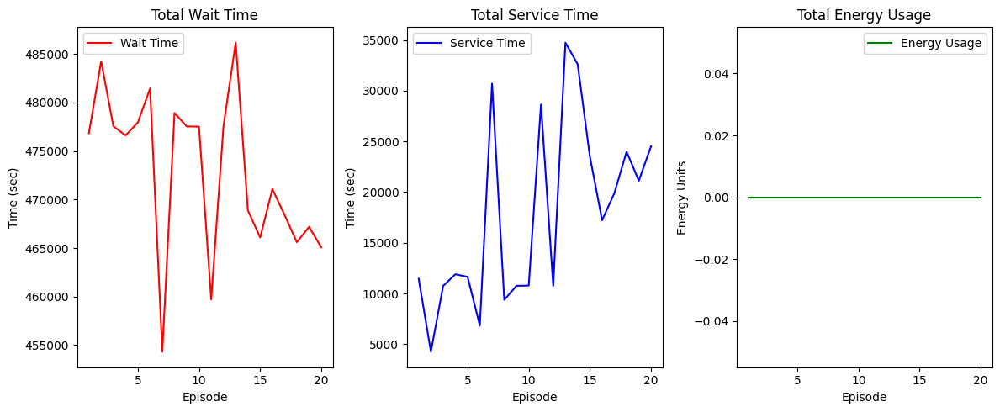

In [ ]:

import pickle

# ✅ Load Q-table
with open("q_table.pkl", "rb") as f:
    q_table = pickle.load(f)

# ✅ Print sample Q-values
print("📊 Sample Q-values from the trained model:")
for state, values in list(q_table.items())[:10]:  # Print first 10 states
    print(f"State: {state} → Q-values: {values}")






import pandas as pd
import matplotlib.pyplot as plt

# ✅ Load Training Data
df = pd.read_csv("training_metrics.csv")

# ✅ Plot Episode Performance
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.plot(df["Episode"], df["Wait Time"], label="Wait Time", color="red")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Wait Time")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df["Episode"], df["Service Time"], label="Service Time", color="blue")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Service Time")
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df["Episode"], df["Energy Usage"], label="Energy Usage", color="green")
plt.xlabel("Episode")
plt.ylabel("Energy Units")
plt.title("Total Energy Usage")
plt.legend()

plt.tight_layout()
plt.show()


## training code ( A one episode is going while all the passengers are serving)

In [ ]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 5000  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("11:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 2 hours

# ✅ Filter Passenger Data for the Time Range (9:00 AM - 11:00 AM)
env.passenger_data = env.passenger_data[
    (env.passenger_data["Time"] >= start_time) & 
    (env.passenger_data["Time"] <= end_time)
].reset_index(drop=True)  # ✅ Reset Index After Filtering

# ✅ Q-Learning Parameters
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table using defaultdict for safer access
q_table = defaultdict(lambda: np.zeros(3))  

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Manually Reset Time and Passenger Index for Each Episode
    env.current_time = start_time
    env.current_index = 0  # Start from beginning of filtered passenger data

    # ✅ Reset Environment (Only Within Filtered Time Range)
    obs = env.reset()
    
    done = False
    total_reward = 0
    env.energy_usage = []  # Reset energy tracking for each episode

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action
        
        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)
        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Normalize Rewards for Stability
        max_wait_time = 300  # Worst case: 5 minutes max wait
        max_service_time = 600  # Worst case: 10 minutes max service time
        max_energy_usage = 500  # Worst case: 500 energy units in one episode

        norm_wait_time = max(0, min(1, info['total_wait_time'] / max_wait_time))
        norm_service_time = max(0, min(1, info['total_service_time'] / max_service_time))
        norm_energy_usage = max(0, min(1, sum(env.energy_usage) / max_energy_usage))

        # ✅ Fine-Tuned Reward Function
        reward = (
            -norm_wait_time * 3  # Higher penalty for long wait times
            -norm_service_time * 2  # Lower penalty for service time
            -norm_energy_usage * 1.5  # Balance energy savings
            + (1 - norm_wait_time) * 3  # Reward for reducing wait times
            + (1 - norm_service_time) * 2  # Reward for faster service
            + (1 - norm_energy_usage) * 1.5  # Reward for efficient energy use
        )

        # ✅ Q-Value Update (Q-learning rule)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 11:00 AM AND all passengers are served
        if env.current_time >= end_time and env.total_waiting_passengers() == 0:
            done = True

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

    # ✅ Collect Metrics After Each Episode
    total_wait_time = info['total_wait_time']
    total_service_time = info['total_service_time']
    total_energy_usage = sum(env.energy_usage)  

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Reset Environment After Each Episode (Only for Filtered Data)
    env.reset()

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table, f)

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")




# 11 .  new versiom

## environment

In [ ]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.wait_times = []  

        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  
        
        self.q_table = {}  # Q-table stored as a dictionary
        self.alpha = 0.1  # Learning rate
        self.gamma = 0.9  # Discount factor
        self.epsilon = 0.2  # Initial exploration probability
        self.epsilon_decay = 0.995  
        self.min_epsilon = 0.01  

        # ✅ Pygame Setup (Commented out if not using visualization)
        # pygame.init()
        # self.screen_width = 800
        # self.screen_height = max(600, num_floors * 100)
        # self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        # pygame.display.set_caption("Elevator Simulation")
        # self.clock = pygame.time.Clock()
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    # def step(self, action):
    #     """Q-learning update and environment step logic."""
        
    #     energy_consumed = 0  # Track energy usage per step
        
    #     # ✅ Continuously update passenger wait times at each time step
    #     # self.update_wait_times()

    #     # ✅ Get Current State Before Action
    #     state = self.get_state()

    #     # ✅ Determine Mode Before Updating State
    #     self.determine_mode()

    #     # # ✅ Select an Action using ε-Greedy Policy
    #     # if np.random.rand() < epsilon:  # Use `epsilon` from the training script
    #     #     action = np.random.randint(0, 3)  # Explore
    #     # else:
    #     #     action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit
    #     # # Initialize state if missing
            
        
    #     # ✅ Update Elevator Actions
    #     self.state['elevator_actions'][0] = action  

    #     # ✅ Apply Movement Constraints (Avoid moving out of bounds)
    #     move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
    #     old_position = self.state['elevator_positions'][0]
    #     new_position = max(1, min(self.num_floors, old_position + move))

    #     if new_position != old_position:
    #         energy_consumed += abs(move)  

    #     self.state['elevator_positions'][0] = new_position  

    #     # ✅ Check if passengers reached their destination
    #     exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
    #     for passenger_id, _ in exited_passengers:
    #         self.track_service_time(passenger_id, self.current_time)  

    #     # ✅ Remove passengers who reached their destination
    #     self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
    #     self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

    #     # ✅ Pick up new passengers if space is available
    #     floor = self.state['elevator_positions'][0]
    #     if self.state['elevator_load'][0] < self.max_capacity:
    #         direction = 'up' if move > 0 else 'down'
    #         while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
    #             passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

    #             self.passenger_board_times[passenger_id] = self.current_time  
    #             self.track_wait_time(passenger_id, self.current_time)
    #             self.state['elevator_passengers'][0].append((passenger_id, destination))
    #             self.state['elevator_load'][0] += 1

    #     # ✅ Compute Reward for Current Step
    #     reward = self.compute_reward(0)

    #     # ✅ Get Next State After Action
    #     # next_state = self.get_state()

    #     # # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
    #     # if state not in self.q_table:
    #     #     self.q_table[state] = np.zeros(3)

    #     # old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
    #     # max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
    #     # new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

    #     # # ✅ Update Q-Table
    #     # self.q_table[state][action] = new_q_value

    #     # # ✅ Epsilon Decay (Reduce exploration over time)
    #     # self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)
        
    #     # # # ✅ Calculate Total Wait Time at This Step
    #     # # total_wait_time = sum(self.passenger_wait_times.values()) if self.passenger_wait_times else 0

    #     # # # ✅ Debug: Print Wait Time Information
    #     # # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
    #     # # print(f"🚶 Total Wait Time (Debug) = {total_wait_time:.2f} sec | Waiting Passengers: {self.total_waiting_passengers()}")


    #     # ✅ Move Time Forward in 5-Second Increments
    #     self.current_time += pd.Timedelta(seconds=self.time_per_step)

    #     # ✅ Update Passengers Based on Simulation Time
    #     self.update_passengers()
        
    #     # ✅ Update service times for passengers inside the elevator
    #     self.update_service_times()


    #     # ✅ Observation & Info
    #     obs = self._get_observation()
    #     done = False  
    #     info = {'energy': energy_consumed, 'reward': reward,
    #             'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
    #         'total_service_time': np.sum(self.service_times) if self.service_times else 0

    #             }
        
    #     return obs, reward, done, info  
    
    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step
        
        # ✅ Continuously update passenger wait times at each time step
        # self.update_wait_times()

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        # ✅ Select an Action using ε-Greedy Policy
        if np.random.rand() < self.epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(self.q_table.get(state, np.zeros(3)))  # Exploit: Best Q-value

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, _ in exited_passengers:
            self.track_service_time(passenger_id, self.current_time)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.track_wait_time(passenger_id, self.current_time)
                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1

        # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # # ✅ Q-Learning Update Rule (Fix: Ensure Q-Table Entry Exists)
        # if state not in self.q_table:
        #     self.q_table[state] = np.zeros(3)

        # old_q_value = self.q_table[state][action]  # Get the Q-value for the selected action
        # max_future_q = np.max(self.q_table.get(next_state, np.zeros(3)))  # Best future Q-value
        # new_q_value = old_q_value + self.alpha * (reward + self.gamma * max_future_q - old_q_value)

        # # ✅ Update Q-Table
        # self.q_table[state][action] = new_q_value

        # # ✅ Epsilon Decay (Reduce exploration over time)
        # self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)
        
        # # ✅ Calculate Total Wait Time at This Step
        # total_wait_time = sum(self.passenger_wait_times.values()) if self.passenger_wait_times else 0

        # # ✅ Debug: Print Wait Time Information
        # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        # print(f"🚶 Total Wait Time (Debug) = {total_wait_time:.2f} sec | Waiting Passengers: {self.total_waiting_passengers()}")


        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()
        
        # ✅ Update service times for passengers inside the elevator
        self.update_service_times()


        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info
    
    
    
    # def step(self, action):
    #     """Simulate the elevator's response to an action and return next state, reward, and info."""

    #     energy_consumed = 0  # Track energy usage per step

    #     # ✅ Get Current State Before Action
    #     state = self.get_state()

    #     # ✅ Determine Mode Before Updating State
    #     self.determine_mode()

    #     # ✅ Apply Movement Constraints (Avoid moving out of bounds)
    #     move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
    #     old_position = self.state['elevator_positions'][0]
    #     new_position = max(1, min(self.num_floors, old_position + move))

    #     if new_position != old_position:
    #         energy_consumed += abs(move)  

    #     self.state['elevator_positions'][0] = new_position  

    #     # ✅ Check if passengers reached their destination
    #     exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
    #     for passenger_id, _ in exited_passengers:
    #         self.track_service_time(passenger_id, self.current_time)  

    #     # ✅ Remove passengers who reached their destination
    #     self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
    #     self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])

    #     # ✅ Pick up new passengers if space is available
    #     floor = self.state['elevator_positions'][0]
    #     if self.state['elevator_load'][0] < self.max_capacity:
    #         direction = 'up' if move > 0 else 'down'
    #         while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
    #             passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

    #             self.passenger_board_times[passenger_id] = self.current_time  
    #             self.track_wait_time(passenger_id, self.current_time)
    #             self.state['elevator_passengers'][0].append((passenger_id, destination))
    #             self.state['elevator_load'][0] += 1

    #     # ✅ Compute Reward for Current Step
    #     reward = self.compute_reward(0)

    #     # ✅ Move Time Forward in 5-Second Increments
    #     self.current_time += pd.Timedelta(seconds=self.time_per_step)

    #     # ✅ Update Passengers Based on Simulation Time
    #     self.update_passengers()
    #     self.update_service_times()

    #     # ✅ Observation & Info
    #     obs = self._get_observation()
    #     done = False  
    #     info = {
    #         'energy': energy_consumed, 
    #         'reward': reward,
    #         'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
    #         'total_service_time': np.sum(self.service_times) if self.service_times else 0
    #     }

    #     return obs, reward, done, info  # ✅ No Q-table Updates Here!


    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store passenger's arrival time (for continuous wait time tracking)
            if passenger_id not in self.passenger_wait_times:
                self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} arrived at Floor {floor} at {self.current_time.strftime('%I:%M:%S %p')}")

            self.current_index += 1
            
            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis

        # ✅ **FIX: Compute Correct Total Wait Time**
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
            
            # ✅ **Fix: Compute Recent Wait Time Trends** (Convert timestamps to seconds)
            wait_times_list = [(self.current_time - arrival_time).total_seconds() for arrival_time in self.passenger_wait_times.values()]
            avg_waiting_trend = np.mean(wait_times_list[-recent_window:]) if len(wait_times_list) >= recent_window else np.mean(wait_times_list) if wait_times_list else 0
            avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

        else:
            total_wait_time = 0  # No waiting passengers
            avg_waiting_trend = 0
            avg_wait_time_trend = 0

        # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        # ✅ **Improved Mode Switching Logic**
        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
        else:
            self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

        # ✅ Debugging Output
        # print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")


        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")

        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check

        # ✅ Compute Continuous Wait Time for Waiting Passengers
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Compute Time Inside Elevator for Boarded Passengers
        # ✅ **Compute Average Service Time (For Passengers Inside the Elevator)**
        # ✅ **Compute Total Service Time (For Passengers Inside the Elevator)**
        if self.passenger_board_times:
            total_service_time = sum([
                (self.current_time - boarding_time).total_seconds()
                for boarding_time in self.passenger_board_times.values()
            ])
        else:
            total_service_time = 0  # No passengers inside


        # ✅ Track Boarding & Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        dropped_off = sum(1 for _, dest in self.state['elevator_passengers'][elevator_id] 
                        if dest == self.state['elevator_positions'][elevator_id])  # Passengers who left
        
        # ✅ Compute Drop-Off Accuracy (Correct Floor)
        correct_drop_off = sum(1 for _, dest in self.state['elevator_passengers'][elevator_id] 
                            if dest == self.state['elevator_positions'][elevator_id])  

        # ✅ Debugging Output
        print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | 🏢 Inside Elevator Time: {total_service_time:.2f} sec")
        print(f"🚪 Boarded: {newly_boarded} | 🎯 Dropped Off: {dropped_off} | ✅ Correct Drop Off: {correct_drop_off}")

        # ✅ 🚀 **Rush Hour Mode**: Focus on **fast passenger movement**
        if self.mode == "rush_hour":
            reward += newly_boarded * 100  # ✅ Reward for picking up passengers
            reward += dropped_off * 150  # ✅ Reward for dropping off passengers
            reward += correct_drop_off * 200  # ✅ Reward for dropping at the correct floor

            # ❌ Penalties
            reward -= total_wait_time * 0.5  # ❌ Penalty for longer wait times
            reward -= total_service_time * 0.3  # ❌ Penalty for long elevator rides
            if idle_time and total_waiting > 0:
                reward -= 20  # ❌ Heavy penalty for idling while passengers wait
            if num_active_elevators > 1 and total_waiting < 5:
                reward -= 5  # ❌ Penalty for too many active elevators when not needed

        # ✅ 🌱 **Non-Rush Hour Mode**: Focus on **Energy Efficiency**
        else:
            reward += newly_boarded * 80  # ✅ Reward for picking up passengers
            reward += dropped_off * 120  # ✅ Reward for dropping off passengers
            reward += correct_drop_off * 150  # ✅ Reward for correct drop-off

            # ❌ Penalties
            reward -= total_wait_time * 0.4  # ❌ Moderate penalty for wait times
            reward -= total_service_time * 0.2  # ❌ Moderate penalty for long rides
            reward -= total_energy * 0.15  # ❌ High penalty for energy usage
            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 10  # ❌ Heavy penalty for too many elevators active
            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting

        # ✅ Debugging: Print Final Reward for this Step
        print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")

        return reward


    def get_state(self):
        """Return the current state representation for Q-learning."""

        state = []

        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information (Per Floor)
            total_waiting = self.total_waiting_passengers()
            state.append(total_waiting)

            # ✅ **NEW: Track Average Wait Time**
            if self.passenger_wait_times:
                avg_wait_time = np.mean([
                    (self.current_time - arrival_time).total_seconds()
                    for arrival_time in self.passenger_wait_times.values()
                ])
            else:
                avg_wait_time = 0  # No waiting passengers
            state.append(avg_wait_time)

            # ✅ **NEW: Track Average Service Time**
            if self.passenger_board_times:
                avg_service_time = np.mean([
                    (self.current_time - boarding_time).total_seconds()
                    for boarding_time in self.passenger_board_times.values()
                ])
            else:
                avg_service_time = 0  # No passengers inside
            state.append(avg_service_time)  # ✅ Add service time to state

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            avg_destination = np.mean(passenger_destinations) if passenger_destinations else 0
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ **NEW: Improved Idle Time Tracking**
            if self.state['elevator_actions'][i] == 1:  # If the elevator is idle
                self.state.setdefault("idle_times", [0] * self.num_elevators)
                self.state["idle_times"][i] += self.time_per_step
            else:
                self.state["idle_times"][i] = 0
            state.append(self.state["idle_times"][i])

        return tuple(state)  # Convert to tuple for Q-table lookup


    
    def reset(self):
        """Reset environment to initial state for a new episode."""
        
        # ✅ Reset Elevator Positions (Start all at Floor 1)
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  
        
        self.dropped_off_count = 0 

        # ✅ Reset Simulation Time to Training Window (e.g., 9:00 AM)
        self.current_time = self.passenger_data['Time'].min()  # Reset to first timestamp (Modify if needed)
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Fully Clear Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear previous passenger request times

        # ✅ **New:** Reset Idle Time Tracking for Elevators
        self.state["idle_times"] = [0] * self.num_elevators  

        # ✅ **New:** Ensure Elevator Mode is Reset
        self.mode = "non_rush_hour"

        # ✅ Clear Waiting Passengers from Previous Episodes
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  
        self.state['elevator_load'] = [0] * self.num_elevators  

        # ✅ Debugging: Print Reset Confirmation
        print(f"🔄 Reset Environment: Time = {self.current_time.strftime('%I:%M:%S %p')}, Mode = {self.mode}")
        print(f"🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!")

        return self._get_observation()


    def _get_observation(self):
        """Return current state as observation."""
        
        # ✅ **NEW FIX:** Compute Correct Total Wait Time
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': total_wait_time,  # ✅ **FIXED: Now Tracks Continuous Wait Time**
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0,  # Include Mode
            'total_energy': sum(self.energy_usage) if self.energy_usage else 0,  # ✅ **Track Total Energy Used**
            'total_waiting_passengers': self.total_waiting_passengers(),  # ✅ **Track Waiting Passengers Count**
            'idle_times': self.state["idle_times"].copy()  # ✅ **Track Elevator Idle Times**
        }



    def update_wait_times(self):
        """Continuously update wait time for all waiting passengers at every step."""

        current_time = self.current_time  # Get the current simulation time

        for floor in range(1, self.num_floors + 1):
            for direction in ['up', 'down']:
                for i, (passenger_id, _) in enumerate(self.state['passengers_waiting'][floor][direction]):

                    # ✅ If the passenger does not have an arrival time recorded, set it
                    if passenger_id not in self.passenger_wait_times:
                        self.passenger_wait_times[passenger_id] = current_time  # Set initial arrival time

                    # ✅ Compute wait time for the passenger
                    arrival_time = self.passenger_wait_times[passenger_id]
                    wait_time = (current_time - arrival_time).total_seconds()  # Calculate elapsed wait time

                    # ✅ Update the wait time dictionary with cumulative wait time
                    self.passenger_wait_times[passenger_id] = arrival_time  # Keep the original arrival time
                    
                    # ✅ Store updated wait time for analysis
                    self.wait_times.append(wait_time)  

                    # 🔍 Debugging Output
                    print(f"⏳ Passenger {passenger_id} at Floor {floor} has been waiting for {wait_time:.2f} seconds.")

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
    
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")


    # def track_service_time(self, passenger_id, exit_time):
    #     """Calculate and store service time when a passenger reaches their destination."""
    #     if passenger_id in self.passenger_board_times:
    #         boarding_time = self.passenger_board_times.pop(passenger_id)
    #         service_time = (exit_time - boarding_time).total_seconds()
    #         self.service_times.append(service_time)  # ✅ Store service time

    #         # 🔍 Debugging Output
    #         # print(f"🔴 Passenger {passenger_id} exited elevator at {exit_time} (Boarded at {boarding_time})")
    #         # print(f"⌛ Service Time Recorded: {service_time} seconds")
    
    
    def track_service_time(self, passenger_id, exit_time):
        """Continuously update the service time until the passenger exits the elevator."""
        
        if passenger_id in self.passenger_board_times:  
            boarding_time = self.passenger_board_times[passenger_id]  # Get entry time
            service_time = (exit_time - boarding_time).total_seconds()  # Calculate time spent in elevator
            
            # ✅ Store the service time
            self.service_times.append(service_time)
            
            # ✅ Remove from tracking (Passenger exited)
            del self.passenger_board_times[passenger_id]
            
            # ✅ **Track Dropped Off Count**
            self.dropped_off_count += 1  # **New Counter to Track Exit Events**

            # 🔍 Debugging Output
            #print(f"🔴 Passenger {passenger_id} exited at {exit_time.strftime('%I:%M:%S %p')} "f"after {service_time:.2f} seconds in the elevator.")
            
    def update_service_times(self):
        """Continuously update the service time for all passengers inside the elevator."""
        
        current_time = self.current_time  # Current simulation time
        
        for elevator_id in range(self.num_elevators):
            for passenger_id, destination in self.state['elevator_passengers'][elevator_id]:
                
                # ✅ If the passenger already entered, update their service time
                if passenger_id in self.passenger_board_times:
                    boarding_time = self.passenger_board_times[passenger_id]
                    service_time = (current_time - boarding_time).total_seconds()
                    
                    # 🔍 Debugging Output
                    print(f"⌛ Passenger {passenger_id} is inside Elevator {elevator_id+1} for {service_time:.2f} seconds.")


            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


## training script

In [80]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 20  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters (for IQL)
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Create lists to track training progress
wait_times_log = []
service_times_log = []
energy_usage_log = []
rewards_log = []


# ✅ Initialize Q-table using defaultdict for safer access (IQL Compatible)
q_table = defaultdict(lambda: np.zeros(3))

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    obs = env.reset()

    done = False
    total_reward = 0

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action

        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)  # ✅ Correct

        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)
        
        # ✅ Q-Value Update (IQL compatible)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Compute **Correct** Total Wait Time
    total_wait_time = np.sum(env.wait_times) if env.wait_times else 0  # ✅ Stored wait times

    # ✅ **Add Waiting Passengers' Current Wait Time**
    if env.passenger_wait_times:
        unfinished_wait_time = sum((env.current_time - arrival_time).total_seconds()
                                   for arrival_time in env.passenger_wait_times.values())
        total_wait_time += unfinished_wait_time  # ✅ Add unfinished waits

    # ✅ Compute **Correct** Total Service Time (Passengers Inside the Elevator)
    total_service_time = 0
    if env.passenger_board_times:
        total_service_time = sum((env.current_time - boarding_time).total_seconds()
                                 for boarding_time in env.passenger_board_times.values())

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Includes passengers still inside)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Store episode metrics
    wait_times_log.append(total_wait_time)
    service_times_log.append(total_service_time)
    energy_usage_log.append(total_energy_usage)
    rewards_log.append(total_reward)

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)
    
# ✅ Save Metrics to a CSV for Analysis
df_metrics = pd.DataFrame({
    "Episode": range(1, num_episodes + 1),
    "Wait Time": wait_times_log,
    "Service Time": service_times_log,
    "Energy Usage": energy_usage_log,
    "Total Reward": rewards_log
})
df_metrics.to_csv("training_metrics.csv", index=False)

print("✅ Training metrics saved to 'training_metrics.csv'.")
    
# ✅ Convert defaultdict to a normal dict before pickling
q_table_dict = dict(q_table)

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table_dict, f)  # ✅ Now it's safe to pickle
   

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")



🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
🕒 Time: 09:00:00 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec


TypeError: unsupported operand type(s) for +=: 'int' and 'list'

In [46]:

import pickle

# ✅ Load Q-table
with open("q_table.pkl", "rb") as f:
    q_table = pickle.load(f)

# ✅ Print sample Q-values
print("📊 Sample Q-values from the trained model:")
for state, values in list(q_table.items())[:10]:  # Print first 10 states
    print(f"State: {state} → Q-values: {values}")



📊 Sample Q-values from the trained model:
State: (1, 0, 0, 0, 0, 0, 0, 0, 5) → Q-values: [5.217031 4.68559  5.217031]
State: (2, 0, 3, 0.0, 0, 0, 0, 0, 15) → Q-values: [0. 0. 0.]
State: (2, 0, 3, 0.0, 0, 0, 0, 1, 20) → Q-values: [-2.850000e-02 -2.850000e-02  6.770935e+01]
State: (3, 3, 0, 0, 5.0, 4.333333333333333, 0, 1, 30) → Q-values: [0. 0. 0.]
State: (3, 3, 0, 0, 5.0, 4.333333333333333, 0, 2, 35) → Q-values: [24.67  46.873  0.   ]
State: (3, 3, 0, 0, 10.0, 4.333333333333333, 0, 2, 45) → Q-values: [0. 0. 0.]
State: (3, 3, 0, 0, 10.0, 4.333333333333333, 0, 2, 50) → Q-values: [ 0.     0.    16.663]
State: (4, 1, 0, 0, 15.0, 5.0, 0, 2, 60) → Q-values: [0. 0. 0.]
State: (4, 1, 0, 0, 15.0, 5.0, 0, 3, 65) → Q-values: [8.655 0.    0.955]
State: (5, 0, 0, 0, 0, 0, 0, 3, 75) → Q-values: [0. 0. 0.]


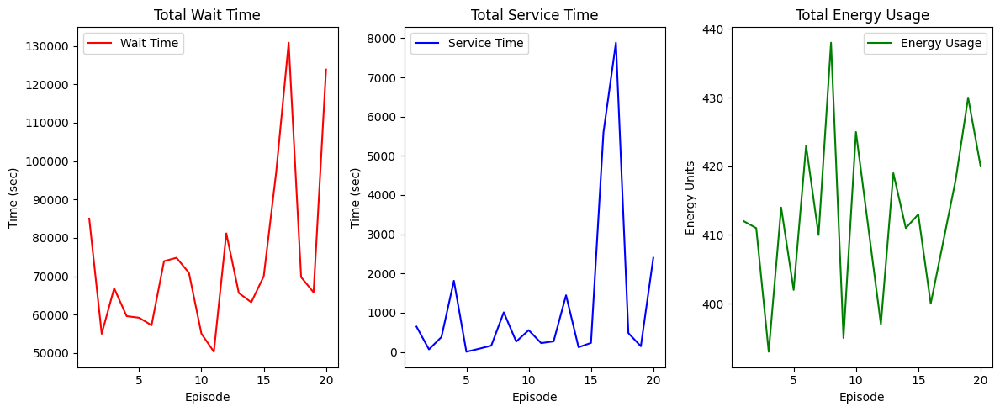

In [45]:



import pandas as pd
import matplotlib.pyplot as plt

# ✅ Load Training Data
df = pd.read_csv("training_metrics.csv")

# ✅ Plot Episode Performance
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.plot(df["Episode"], df["Wait Time"], label="Wait Time", color="red")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Wait Time")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df["Episode"], df["Service Time"], label="Service Time", color="blue")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Service Time")
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df["Episode"], df["Energy Usage"], label="Energy Usage", color="green")
plt.xlabel("Episode")
plt.ylabel("Energy Units")
plt.title("Total Energy Usage")
plt.legend()

plt.tight_layout()
plt.show()


# 12 ( track service time problem )

In [129]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.passenger_destinations = {}  # ✅ Track where each passenger wants to go

        self.wait_times = []  
        self.dropped_off_count = 0  # ✅ Track correct drop-offs


        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  
        

        # ✅ Pygame Setup (Commented out if not using visualization)
        # pygame.init()
        # self.screen_width = 800
        # self.screen_height = max(600, num_floors * 100)
        # self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        # pygame.display.set_caption("Elevator Simulation")
        # self.clock = pygame.time.Clock()
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    
    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step
        
        # ✅ Continuously update passenger wait times at each time step
        # self.update_wait_times()

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()
        
         # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, destination_floor in exited_passengers:
            self.track_service_time(passenger_id, self.current_time, new_position)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])



       
        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.passenger_destinations[passenger_id] = destination  # ✅ Track their destination floor
                self.track_wait_time(passenger_id, self.current_time)

                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1


       

        # ✅ Get Next State After Action
        next_state = self.get_state()


        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()
        
        # ✅ Update service times for passengers inside the elevator
        self.update_service_times()


        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info
    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store passenger's arrival time (for continuous wait time tracking)
            if passenger_id not in self.passenger_wait_times:
                self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            print(f"🟢 Passenger {passenger_id} arrived at Floor {floor} at {self.current_time.strftime('%I:%M:%S %p')}")

            self.current_index += 1
            
            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis

        # ✅ **FIX: Compute Correct Total Wait Time**
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
            
            # ✅ **Fix: Compute Recent Wait Time Trends** (Convert timestamps to seconds)
            wait_times_list = [(self.current_time - arrival_time).total_seconds() for arrival_time in self.passenger_wait_times.values()]
            avg_waiting_trend = np.mean(wait_times_list[-recent_window:]) if len(wait_times_list) >= recent_window else np.mean(wait_times_list) if wait_times_list else 0
            avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

        else:
            total_wait_time = 0  # No waiting passengers
            avg_waiting_trend = 0
            avg_wait_time_trend = 0

        # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        # ✅ **Improved Mode Switching Logic**
        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
        else:
            self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

        # ✅ Debugging Output
        # print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")


        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")

        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check
        
         # ✅ Count Drop-Offs
        correct_drop_off = self.dropped_off_count  # ✅ Correctly dropped-off passengers
        self.dropped_off_count = 0  # 

        # ✅ Debugging Output
        print(f"🚪 Correct Drop-Off Count: {correct_drop_off}")

        # ✅ Compute Continuous Wait Time for Waiting Passengers
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Compute Time Inside Elevator for Boarded Passengers
        # ✅ **Compute Average Service Time (For Passengers Inside the Elevator)**
        # ✅ **Compute Total Service Time (For Passengers Inside the Elevator)**
        if self.passenger_board_times:
            total_service_time = sum([
                (self.current_time - boarding_time).total_seconds()
                for boarding_time in self.passenger_board_times.values()
            ])
        else:
            total_service_time = 0  # No passengers inside


        # ✅ Track Boarding & Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        

        # ✅ Debugging Output
        print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | 🏢 Inside Elevator Time: {total_service_time:.2f} sec")
        print(f"🚪 Boarded: {newly_boarded}  | ✅ Correct Drop Off: {correct_drop_off} |")

        # ✅ 🚀 **Rush Hour Mode**: Focus on **fast passenger movement**
        if self.mode == "rush_hour":
            reward += newly_boarded * 500  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 350  # ✅ Reward for correct drop-off

            # ❌ Penalties
            reward -= total_wait_time * 0.5  # ❌ Penalty for longer wait times
            reward -= total_service_time * 0.3  # ❌ Penalty for long elevator rides
            if idle_time and total_waiting > 0:
                reward -= 20  # ❌ Heavy penalty for idling while passengers wait
            if num_active_elevators > 1 and total_waiting < 5:
                reward -= 5  # ❌ Penalty for too many active elevators when not needed

        # ✅ 🌱 **Non-Rush Hour Mode**: Focus on **Energy Efficiency**
        else:
            reward += newly_boarded * 100  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 150  # ✅ Reward for correct drop-off
            
            # ❌ Penalties
            reward -= total_wait_time * 0.4  # ❌ Moderate penalty for wait times
            reward -= total_service_time * 0.2  # ❌ Moderate penalty for long rides
            reward -= total_energy * 0.15  # ❌ High penalty for energy usage
            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 10  # ❌ Heavy penalty for too many elevators active
            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting

        # ✅ Debugging: Print Final Reward for this Step
        print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")

        return reward


    def track_service_time(self, passenger_id, exit_time, exit_floor):
        """Track service time **only if passenger exits at the correct destination floor**."""
        
        
        if passenger_id in self.passenger_board_times:  
            boarding_time = self.passenger_board_times[passenger_id]  # Get entry time
            
            # ✅ Ensure passenger exists in `self.passenger_destinations`
            expected_destination = self.passenger_destinations.get(passenger_id, None)  
            
            if expected_destination is not None and exit_floor == expected_destination:
                service_time = (exit_time - boarding_time).total_seconds()  # Calculate time spent in elevator
                self.service_times.append(service_time)  # ✅ Store service time

                # ✅ Remove from tracking (Passenger exited)
                del self.passenger_board_times[passenger_id]
                del self.passenger_destinations[passenger_id]  # ✅ Remove destination tracking

                # ✅ **Track Correct Drop-Off**
                self.dropped_off_count += 1  

                # ✅ Ensure Removal from Elevator State
                for i in range(self.num_elevators):
                    self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if p != passenger_id]

                # 🔍 Debugging Output
                print(f"✅ Passenger {passenger_id} exited CORRECTLY at Floor {exit_floor} after {service_time:.2f} seconds.")

            else:
                # ❌ Handle Incorrect Exit
                print(f"⚠️ Passenger {passenger_id} exited at WRONG floor {exit_floor}, expected {expected_destination}.")


    def get_state(self):
        """Return the current state representation for Q-learning."""

        state = []

        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information (Per Floor)
            total_waiting = self.total_waiting_passengers()
            state.append(total_waiting)

            # ✅ **NEW: Track Average Wait Time**
            if self.passenger_wait_times:
                avg_wait_time = np.mean([
                    (self.current_time - arrival_time).total_seconds()
                    for arrival_time in self.passenger_wait_times.values()
                ])
            else:
                avg_wait_time = 0  # No waiting passengers
            state.append(avg_wait_time)

            # ✅ **NEW: Track Average Service Time**
            if self.passenger_board_times:
                avg_service_time = np.mean([
                    (self.current_time - boarding_time).total_seconds()
                    for boarding_time in self.passenger_board_times.values()
                ])
            else:
                avg_service_time = 0  # No passengers inside
            state.append(avg_service_time)  # ✅ Add service time to state

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            avg_destination = np.mean(passenger_destinations) if passenger_destinations else 0
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ **NEW: Improved Idle Time Tracking**
            if self.state['elevator_actions'][i] == 1:  # If the elevator is idle
                self.state.setdefault("idle_times", [0] * self.num_elevators)
                self.state["idle_times"][i] += self.time_per_step
            else:
                self.state["idle_times"][i] = 0
            state.append(self.state["idle_times"][i])

        return tuple(state)  # Convert to tuple for Q-table lookup


    def reset(self):
        """Reset environment to initial state for a new episode."""
        
        # ✅ Reset Elevator Positions (Start all at Floor 1)
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  
        
        self.dropped_off_count = 0 

        # ✅ Reset Simulation Time to Training Window (e.g., 9:00 AM)
        self.current_time = self.passenger_data['Time'].min()  # Reset to first timestamp (Modify if needed)
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Fully Clear Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear previous passenger request times

        # ✅ **New:** Reset Idle Time Tracking for Elevators
        self.state["idle_times"] = [0] * self.num_elevators  

        # ✅ **New:** Ensure Elevator Mode is Reset
        self.mode = "non_rush_hour"

        # ✅ Clear Waiting Passengers from Previous Episodes
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  
        self.state['elevator_load'] = [0] * self.num_elevators  

        # ✅ Debugging: Print Reset Confirmation
        print(f"🔄 Reset Environment: Time = {self.current_time.strftime('%I:%M:%S %p')}, Mode = {self.mode}")
        print(f"🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!")

        return self._get_observation()


    def _get_observation(self):
        """Return current state as observation."""
        
        # ✅ **NEW FIX:** Compute Correct Total Wait Time
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': total_wait_time,  # ✅ **FIXED: Now Tracks Continuous Wait Time**
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0,  # Include Mode
            'total_energy': sum(self.energy_usage) if self.energy_usage else 0,  # ✅ **Track Total Energy Used**
            'total_waiting_passengers': self.total_waiting_passengers(),  # ✅ **Track Waiting Passengers Count**
            'idle_times': self.state["idle_times"].copy()  # ✅ **Track Elevator Idle Times**
        }



    def update_wait_times(self):
        """Continuously update wait time for all waiting passengers at every step."""

        current_time = self.current_time  # Get the current simulation time

        for floor in range(1, self.num_floors + 1):
            for direction in ['up', 'down']:
                for i, (passenger_id, _) in enumerate(self.state['passengers_waiting'][floor][direction]):

                    # ✅ If the passenger does not have an arrival time recorded, set it
                    if passenger_id not in self.passenger_wait_times:
                        self.passenger_wait_times[passenger_id] = current_time  # Set initial arrival time

                    # ✅ Compute wait time for the passenger
                    arrival_time = self.passenger_wait_times[passenger_id]
                    wait_time = (current_time - arrival_time).total_seconds()  # Calculate elapsed wait time

                    # ✅ Update the wait time dictionary with cumulative wait time
                    self.passenger_wait_times[passenger_id] = arrival_time  # Keep the original arrival time
                    
                    # ✅ Store updated wait time for analysis
                    self.wait_times.append(wait_time)  

                    # 🔍 Debugging Output
                    print(f"⏳ Passenger {passenger_id} at Floor {floor} has been waiting for {wait_time:.2f} seconds.")

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
    
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")

    
    

            
    def update_service_times(self):
        """Continuously update the service time for all passengers inside the elevator."""
        
        current_time = self.current_time  # Current simulation time
        
        for elevator_id in range(self.num_elevators):
            for passenger_id, destination in self.state['elevator_passengers'][elevator_id]:
                
                # ✅ If the passenger already entered, update their service time
                if passenger_id in self.passenger_board_times:
                    boarding_time = self.passenger_board_times[passenger_id]
                    service_time = (current_time - boarding_time).total_seconds()
                    
                    # 🔍 Debugging Output
                    print(f"⌛ Passenger {passenger_id} is inside Elevator {elevator_id+1} for {service_time:.2f} seconds. at {self.current_time.strftime('%I:%M:%S %p')}")


            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()


In [132]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 20  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters (for IQL)
alpha = 0.1  # Learning rate
gamma = 0.9  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Create lists to track training progress
wait_times_log = []
service_times_log = []
energy_usage_log = []
rewards_log = []


# ✅ Initialize Q-table using defaultdict for safer access (IQL Compatible)
q_table = defaultdict(lambda: np.zeros(3))

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    obs = env.reset()

    done = False
    total_reward = 0

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action

        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)  # ✅ Correct

        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)
        
        # ✅ Q-Value Update (IQL compatible)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Compute **Correct** Total Wait Time
    # total_wait_time = np.sum(env.wait_times) if env.wait_times else 0  # ✅ Stored wait times

    # ✅ **Add Waiting Passengers' Current Wait Time**
    if env.passenger_wait_times:
        unfinished_wait_time = sum((env.current_time - arrival_time).total_seconds()
                                   for arrival_time in env.passenger_wait_times.values())
        total_wait_time += unfinished_wait_time  # ✅ Add unfinished waits

    # ✅ Compute **Correct** Total Service Time (Passengers Inside the Elevator)
    total_service_time = 0
    if env.passenger_board_times:
        unfinished_service_time = sum((env.current_time - boarding_time).total_seconds()
                                 for boarding_time in env.passenger_board_times.values())
        total_service_time += unfinished_service_time

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Includes passengers still inside)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Store episode metrics
    wait_times_log.append(total_wait_time)
    service_times_log.append(total_service_time)
    energy_usage_log.append(total_energy_usage)
    rewards_log.append(total_reward)

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)
    
# ✅ Save Metrics to a CSV for Analysis
df_metrics = pd.DataFrame({
    "Episode": range(1, num_episodes + 1),
    "Wait Time": wait_times_log,
    "Service Time": service_times_log,
    "Energy Usage": energy_usage_log,
    "Total Reward": rewards_log
})
df_metrics.to_csv("training_metrics.csv", index=False)

print("✅ Training metrics saved to 'training_metrics.csv'.")
    
# ✅ Convert defaultdict to a normal dict before pickling
q_table_dict = dict(q_table)

# ✅ Save the Q-table for future use
with open("q_table.pkl", "wb") as f:
    pickle.dump(q_table_dict, f)  # ✅ Now it's safe to pickle
   

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")



🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
🚪 Correct Drop-Off Count: 0
🕒 Time: 09:00:00 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0  | ✅ Correct Drop Off: 0 |
🏆 Reward: 10.00 | 🚕 Passengers: 0 | 🚶 Waiting: 0 | ⚡ Energy: 0
🟢 Passenger 1198 arrived at Floor 3 at 09:00:05 AM
🟢 Passenger 1199 arrived at Floor 3 at 09:00:05 AM
🟢 Passenger 1200 arrived at Floor 3 at 09:00:05 AM
🚪 Correct Drop-Off Count: 0
🕒 Time: 09:00:05 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 0.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0  | ✅ Correct Drop Off: 0 |
🏆 Reward: 0.00 | 🚕 Passengers: 0 | 🚶 Waiting: 3 | ⚡ Energy: 0
🚪 Correct Drop-Off Count: 0
🕒 Time: 09:00:10 AM | 🚦 Mode: non_rush_hour
🚶 Total Wait Time: 15.00 sec | 🏢 Inside Elevator Time: 0.00 sec
🚪 Boarded: 0  | ✅ Correct Drop Off: 0 |
🏆 Rew

KeyboardInterrupt: 

# without debug code (printing)

In [ ]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.passenger_destinations = {}  # ✅ Track where each passenger wants to go

        self.wait_times = []  
        self.dropped_off_count = 0  # ✅ Track correct drop-offs
        self.correct_drop_off_count = 0  # ✅ Track total correct drop-offs per episode


        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  
        

        # ✅ Pygame Setup (Commented out if not using visualization)
        # pygame.init()
        # self.screen_width = 800
        # self.screen_height = max(600, num_floors * 100)
        # self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        # pygame.display.set_caption("Elevator Simulation")
        # self.clock = pygame.time.Clock()
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    
    def step(self, action):
        """Q-learning update and environment step logic."""
        
        energy_consumed = 0  # Track energy usage per step
        
        # ✅ Continuously update passenger wait times at each time step
        # self.update_wait_times()

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()
        
         # ✅ Compute Reward for Current Step
        reward = self.compute_reward(0)

        # ✅ Update Elevator Actions
        self.state['elevator_actions'][0] = action  

        # ✅ Apply Movement Constraints (Avoid moving out of bounds)
        move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
        old_position = self.state['elevator_positions'][0]
        new_position = max(1, min(self.num_floors, old_position + move))

        if new_position != old_position:
            energy_consumed += abs(move)  

        self.state['elevator_positions'][0] = new_position  

        # ✅ Check if passengers reached their destination
        exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][0] if dest == new_position]
        for passenger_id, destination_floor in exited_passengers:
            self.track_service_time(passenger_id, self.current_time, new_position)  

        # ✅ Remove passengers who reached their destination
        self.state['elevator_passengers'][0] = [(p, d) for p, d in self.state['elevator_passengers'][0] if d != new_position]
        self.state['elevator_load'][0] = len(self.state['elevator_passengers'][0])



       
        # ✅ Pick up new passengers if space is available
        floor = self.state['elevator_positions'][0]
        if self.state['elevator_load'][0] < self.max_capacity:
            direction = 'up' if move > 0 else 'down'
            while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][0] < self.max_capacity:
                passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                self.passenger_board_times[passenger_id] = self.current_time  
                self.passenger_destinations[passenger_id] = destination  # ✅ Track their destination floor
                self.track_wait_time(passenger_id, self.current_time)

                self.state['elevator_passengers'][0].append((passenger_id, destination))
                self.state['elevator_load'][0] += 1


       

        # ✅ Get Next State After Action
        next_state = self.get_state()


        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()
        
        # ✅ Update service times for passengers inside the elevator
        self.update_service_times()


        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': reward,
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
            'total_service_time': np.sum(self.service_times) if self.service_times else 0

                }
        
        return obs, reward, done, info
    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store passenger's arrival time (for continuous wait time tracking)
            if passenger_id not in self.passenger_wait_times:
                self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} arrived at Floor {floor} at {self.current_time.strftime('%I:%M:%S %p')}")

            self.current_index += 1
            
            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis

        # ✅ **FIX: Compute Correct Total Wait Time**
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
            
            # ✅ **Fix: Compute Recent Wait Time Trends** (Convert timestamps to seconds)
            wait_times_list = [(self.current_time - arrival_time).total_seconds() for arrival_time in self.passenger_wait_times.values()]
            avg_waiting_trend = np.mean(wait_times_list[-recent_window:]) if len(wait_times_list) >= recent_window else np.mean(wait_times_list) if wait_times_list else 0
            avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

        else:
            total_wait_time = 0  # No waiting passengers
            avg_waiting_trend = 0
            avg_wait_time_trend = 0

        # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        # ✅ **Improved Mode Switching Logic**
        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
        else:
            self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

        # ✅ Debugging Output
        # print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")


        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")

        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check
        
        
         # ✅ Count Drop-Offs
        correct_drop_off = self.dropped_off_count  # ✅ Correctly dropped-off passengers
        self.dropped_off_count = 0  # 

        # ✅ Debugging Output
        # print(f"🚪 Correct Drop-Off Count: {correct_drop_off}")

        # ✅ Compute Continuous Wait Time for Waiting Passengers
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Compute Time Inside Elevator for Boarded Passengers
        # ✅ **Compute Average Service Time (For Passengers Inside the Elevator)**
        # ✅ **Compute Total Service Time (For Passengers Inside the Elevator)**
        if self.passenger_board_times:
            total_service_time = sum([
                (self.current_time - boarding_time).total_seconds()
                for boarding_time in self.passenger_board_times.values()
            ])
        else:
            total_service_time = 0  # No passengers inside


        # ✅ Track Boarding & Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        

        # ✅ Debugging Output
        # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        # print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | 🏢 Inside Elevator Time: {total_service_time:.2f} sec")
        # print(f"🚪 Boarded: {newly_boarded}  | ✅ Correct Drop Off: {correct_drop_off} |")

        # ✅ 🚀 **Rush Hour Mode**: Focus on **fast passenger movement**
        if self.mode == "rush_hour":
            reward += newly_boarded * 500  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 350  # ✅ Reward for correct drop-off

            # ❌ Penalties
            # reward -= total_wait_time * 0.5  # ❌ Penalty for longer wait times
            # reward -= total_service_time * 0.3  # ❌ Penalty for long elevator rides
            if idle_time and total_waiting > 0:
                reward -= 20  # ❌ Heavy penalty for idling while passengers wait
            if num_active_elevators > 1 and total_waiting < 5:
                reward -= 5  # ❌ Penalty for too many active elevators when not needed

        # ✅ 🌱 **Non-Rush Hour Mode**: Focus on **Energy Efficiency**
        else:
            reward += newly_boarded * 100  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 150  # ✅ Reward for correct drop-off
            
            # ❌ Penalties
            # reward -= total_wait_time * 0.4  # ❌ Moderate penalty for wait times
            # reward -= total_service_time * 0.2  # ❌ Moderate penalty for long rides
            reward -= total_energy * 0.15  # ❌ High penalty for energy usage
            if num_active_elevators > 1:
                reward -= (num_active_elevators - 1) * 10  # ❌ Heavy penalty for too many elevators active
            if idle_time and total_waiting == 0:
                reward += 10  # ✅ Reward for staying idle when no one is waiting

        # ✅ Debugging: Print Final Reward for this Step
        # print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy}")

        return reward


    def track_service_time(self, passenger_id, exit_time, exit_floor):
        """Track service time **only if passenger exits at the correct destination floor**."""
        
        
        if passenger_id in self.passenger_board_times:  
            boarding_time = self.passenger_board_times[passenger_id]  # Get entry time
            
            # ✅ Ensure passenger exists in `self.passenger_destinations`
            expected_destination = self.passenger_destinations.get(passenger_id, None)  
            
            if expected_destination is not None and exit_floor == expected_destination:
                service_time = (exit_time - boarding_time).total_seconds()  # Calculate time spent in elevator
                self.service_times.append(service_time)  # ✅ Store service time

                # ✅ Remove from tracking (Passenger exited)
                del self.passenger_board_times[passenger_id]
                del self.passenger_destinations[passenger_id]  # ✅ Remove destination tracking

                # ✅ **Track Correct Drop-Off**
                self.dropped_off_count += 1  
                self.correct_drop_off_count += 1  

                # ✅ Ensure Removal from Elevator State
                for i in range(self.num_elevators):
                    self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if p != passenger_id]

                # 🔍 Debugging Output
                # print(f"✅ Passenger {passenger_id} exited CORRECTLY at Floor {exit_floor} after {service_time:.2f} seconds.")

            else:
                # ❌ Handle Incorrect Exit
                print(f"⚠️ Passenger {passenger_id} exited at WRONG floor {exit_floor}, expected {expected_destination}.")


    def get_state(self):
        """Return the current state representation for Q-learning."""

        state = []

        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information (Per Floor)
            total_waiting = self.total_waiting_passengers()
            state.append(total_waiting)

            # ✅ **NEW: Track Average Wait Time**
            if self.passenger_wait_times:
                avg_wait_time = np.mean([
                    (self.current_time - arrival_time).total_seconds()
                    for arrival_time in self.passenger_wait_times.values()
                ])
            else:
                avg_wait_time = 0  # No waiting passengers
            state.append(avg_wait_time)

            # ✅ **NEW: Track Average Service Time**
            if self.passenger_board_times:
                avg_service_time = np.mean([
                    (self.current_time - boarding_time).total_seconds()
                    for boarding_time in self.passenger_board_times.values()
                ])
            else:
                avg_service_time = 0  # No passengers inside
            state.append(avg_service_time)  # ✅ Add service time to state

            # ✅ Destination Floors Inside the Elevator
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]
            avg_destination = np.mean(passenger_destinations) if passenger_destinations else 0
            state.append(avg_destination)

            # ✅ Time of Day (Rush Hour or Not)
            is_rush_hour = 1 if self.mode == "rush_hour" else 0
            state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            total_energy = sum(self.energy_usage)
            state.append(total_energy)

            # ✅ **NEW: Improved Idle Time Tracking**
            if self.state['elevator_actions'][i] == 1:  # If the elevator is idle
                self.state.setdefault("idle_times", [0] * self.num_elevators)
                self.state["idle_times"][i] += self.time_per_step
            else:
                self.state["idle_times"][i] = 0
            state.append(self.state["idle_times"][i])

        return tuple(state)  # Convert to tuple for Q-table lookup


    def reset(self):
        """Reset environment to initial state for a new episode."""
        
        # ✅ Reset Elevator Positions (Start all at Floor 1)
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  
        
        self.dropped_off_count = 0 

        # ✅ Reset Simulation Time to Training Window (e.g., 9:00 AM)
        self.current_time = self.passenger_data['Time'].min()  # Reset to first timestamp (Modify if needed)
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Fully Clear Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear previous passenger request times

        # ✅ **New:** Reset Idle Time Tracking for Elevators
        self.state["idle_times"] = [0] * self.num_elevators  

        # ✅ **New:** Ensure Elevator Mode is Reset
        self.mode = "non_rush_hour"

        # ✅ Clear Waiting Passengers from Previous Episodes
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  
        self.state['elevator_load'] = [0] * self.num_elevators  

        # ✅ Debugging: Print Reset Confirmation
        print(f"🔄 Reset Environment: Time = {self.current_time.strftime('%I:%M:%S %p')}, Mode = {self.mode}")
        print(f"🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!")

        return self._get_observation()


    def _get_observation(self):
        """Return current state as observation."""
        
        # ✅ **NEW FIX:** Compute Correct Total Wait Time
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': total_wait_time,  # ✅ **FIXED: Now Tracks Continuous Wait Time**
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0,  # Include Mode
            'total_energy': sum(self.energy_usage) if self.energy_usage else 0,  # ✅ **Track Total Energy Used**
            'total_waiting_passengers': self.total_waiting_passengers(),  # ✅ **Track Waiting Passengers Count**
            'idle_times': self.state["idle_times"].copy()  # ✅ **Track Elevator Idle Times**
        }



    def update_wait_times(self):
        """Continuously update wait time for all waiting passengers at every step."""

        current_time = self.current_time  # Get the current simulation time

        for floor in range(1, self.num_floors + 1):
            for direction in ['up', 'down']:
                for i, (passenger_id, _) in enumerate(self.state['passengers_waiting'][floor][direction]):

                    # ✅ If the passenger does not have an arrival time recorded, set it
                    if passenger_id not in self.passenger_wait_times:
                        self.passenger_wait_times[passenger_id] = current_time  # Set initial arrival time

                    # ✅ Compute wait time for the passenger
                    arrival_time = self.passenger_wait_times[passenger_id]
                    wait_time = (current_time - arrival_time).total_seconds()  # Calculate elapsed wait time

                    # ✅ Update the wait time dictionary with cumulative wait time
                    self.passenger_wait_times[passenger_id] = arrival_time  # Keep the original arrival time
                    
                    # ✅ Store updated wait time for analysis
                    self.wait_times.append(wait_time)  

                    # 🔍 Debugging Output
                    print(f"⏳ Passenger {passenger_id} at Floor {floor} has been waiting for {wait_time:.2f} seconds.")

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
    
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")

    
    

            
    def update_service_times(self):
        """Continuously update the service time for all passengers inside the elevator."""
        
        current_time = self.current_time  # Current simulation time
        
        for elevator_id in range(self.num_elevators):
            for passenger_id, destination in self.state['elevator_passengers'][elevator_id]:
                
                # ✅ If the passenger already entered, update their service time
                if passenger_id in self.passenger_board_times:
                    boarding_time = self.passenger_board_times[passenger_id]
                    service_time = (current_time - boarding_time).total_seconds()
                    
                    # 🔍 Debugging Output
                    # print(f"⌛ Passenger {passenger_id} is inside Elevator {elevator_id+1} for {service_time:.2f} seconds. at {self.current_time.strftime('%I:%M:%S %p')}")


            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()




In [183]:

import numpy as np
import pandas as pd
import pickle
from collections import defaultdict

# ✅ Initialize Environment
env = ElevatorEnv(num_floors=6, num_elevators=1, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 100  # Train for 5000 episodes
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters (for IQL)
alpha = 0.05  # Learning rate
gamma = 0.95  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Create lists to track training progress
wait_times_log = []
service_times_log = []
energy_usage_log = []
rewards_log = []
correct_drop_offs_log = []


# ✅ Initialize Q-table using defaultdict for safer access (IQL Compatible)
q_table = defaultdict(lambda: np.zeros(3))

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    obs = env.reset()

    done = False
    total_reward = 0

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())

        # ✅ ε-Greedy Action Selection
        if np.random.rand() < epsilon:
            action = np.random.randint(0, 3)  # Explore: Random action
        else:
            action = np.argmax(q_table[state])  # Exploit: Best known action

        # ✅ Take Step in Environment
        obs, reward, done, info = env.step(action)  # ✅ Correct

        total_reward += reward

        # ✅ Get Next State
        next_state = tuple(env.get_state())

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)
        
        # ✅ Q-Value Update (IQL compatible)
        old_q_value = q_table[state][action]
        max_future_q = np.max(q_table[next_state])
        new_q_value = old_q_value + alpha * (reward + gamma * max_future_q - old_q_value)
        q_table[state][action] = new_q_value  

        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Compute **Correct** Total Wait Time
    # total_wait_time = np.sum(env.wait_times) if env.wait_times else 0  # ✅ Stored wait times

    # ✅ **Add Waiting Passengers' Current Wait Time**
    total_wait_time = 0
    if env.passenger_wait_times:
        unfinished_wait_time = sum((env.current_time - arrival_time).total_seconds()
                                   for arrival_time in env.passenger_wait_times.values())
        total_wait_time += unfinished_wait_time  # ✅ Add unfinished waits

    # ✅ Compute **Correct** Total Service Time (Passengers Inside the Elevator)
    total_service_time = 0
    if env.passenger_board_times:
        unfinished_service_time = sum((env.current_time - boarding_time).total_seconds()
                                 for boarding_time in env.passenger_board_times.values())
        total_service_time += unfinished_service_time

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Retrieve total correct drop-offs from the environment
    total_correct_drop_offs = env.correct_drop_off_count  # ✅ Fetch from environment

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Includes passengers still inside)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🎯 Correct Drop-Offs = {total_correct_drop_offs}")  # ✅ Print correct drop-offs
    print(f"   🏆 Total Reward = {total_reward:.2f} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")
    
    # ✅ Store episode metrics
    wait_times_log.append(total_wait_time)
    service_times_log.append(total_service_time)
    energy_usage_log.append(total_energy_usage)
    rewards_log.append(total_reward)
    correct_drop_offs_log.append(total_correct_drop_offs)

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)
    
# ✅ Save Metrics to a CSV for Analysis
df_metrics = pd.DataFrame({
    "Episode": range(1, num_episodes + 1),
    "Wait Time": wait_times_log,
    "Service Time": service_times_log,
    "Energy Usage": energy_usage_log,
    "Total Reward": rewards_log,
    "Correct Drop-Offs": correct_drop_offs_log  # ✅ New column
})
df_metrics.to_csv("training_metrics_02.csv", index=False)

print("✅ Training metrics saved to 'training_metrics_02.csv'.")
    
# ✅ Convert defaultdict to a normal dict before pickling
q_table_dict = dict(q_table)

# ✅ Save the Q-table for future use
with open("q_table_02.pkl", "wb") as f:
    pickle.dump(q_table_dict, f)  # ✅ Now it's safe to pickle
   

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")



🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
📊 Episode 1:
   🚶 Total Wait Time = 27090.00 sec (Includes waiting passengers)
   ⏳ Total Service Time = 1680.00 sec (Includes passengers still inside)
   ⚡ Total Energy Usage = 410 units
   🎯 Correct Drop-Offs = 252
   🏆 Total Reward = 429100.00 | ε = 1.000
----------------------------------------------------

🚀 Episode 2 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
📊 Episode 2:
   🚶 Total Wait Time = 25950.00 sec (Includes waiting passengers)
   ⏳ Total Service Time = 500.00 sec (Includes passengers still inside)
   ⚡ Total Energy Usage = 392 units
   🎯 Correct Drop-Offs = 513
   🏆 Total Reward = 576250.00 | ε = 0.995
------------------------------------------------

KeyboardInterrupt: 

In [152]:

import pickle

# ✅ Load Q-table
with open("q_table_02.pkl", "rb") as f:
    q_table = pickle.load(f)

# ✅ Print sample Q-values
print("📊 Sample Q-values from the trained model:")
for state, values in list(q_table.items())[:100]:  # Print first 10 states
    print(f"State: {state} → Q-values: {values}")





📊 Sample Q-values from the trained model:
State: (1, 0, 0, 0, 0, 0, 0, 0, 5) → Q-values: [4.59639912 9.23055025 4.01263061]
State: (1, 0, 3, 0.0, 0, 0, 0, 0, 20) → Q-values: [0. 0. 0.]
State: (1, 0, 3, 0.0, 0, 0, 0, 0, 25) → Q-values: [-0.96952463  0.          0.        ]
State: (1, 0, 3, 5.0, 0, 0, 0, 0, 40) → Q-values: [0. 0. 0.]
State: (1, 0, 3, 5.0, 0, 0, 0, 0, 45) → Q-values: [-3.09860637 -2.58719945 -2.58719945]
State: (1, 0, 3, 10.0, 0, 0, 0, 0, 60) → Q-values: [0. 0. 0.]
State: (1, 0, 3, 10.0, 0, 0, 0, 0, 65) → Q-values: [-2.37787888 -2.225925   -2.225925  ]
State: (1, 0, 3, 15.0, 0, 0, 0, 0, 0) → Q-values: [-10.44697129 -10.07771996 -10.07771996]
State: (1, 0, 3, 20.0, 0, 0, 0, 0, 10) → Q-values: [0. 0. 0.]
State: (1, 0, 3, 20.0, 0, 0, 0, 0, 15) → Q-values: [-5.06665907 -7.23990489 -5.4292575 ]
State: (1, 0, 5, 15.0, 0, 0, 0, 0, 30) → Q-values: [0. 0. 0.]
State: (1, 0, 5, 15.0, 0, 0, 0, 0, 35) → Q-values: [-3.30259531 -4.27875    -2.925     ]
State: (1, 0, 5, 20.0, 0, 0, 0, 0,

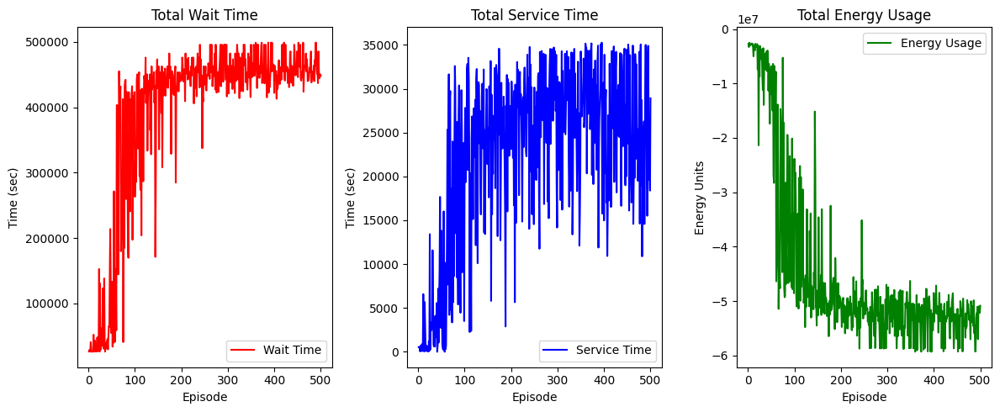

In [ ]:


import pickle

# ✅ Load Q-table
with open("q_table_02.pkl", "rb") as f:
    q_table = pickle.load(f)

# ✅ Print sample Q-values
print("📊 Sample Q-values from the trained model:")
for state, values in list(q_table.items())[:100]:  # Print first 10 states
    print(f"State: {state} → Q-values: {values}")





import pandas as pd
import matplotlib.pyplot as plt

# ✅ Load Training Data
df = pd.read_csv("training_metrics_02.csv")

# ✅ Plot Episode Performance
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.plot(df["Episode"], df["Wait Time"], label="Wait Time", color="red")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Wait Time")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df["Episode"], df["Service Time"], label="Service Time", color="blue")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Service Time")
plt.legend()

# plt.subplot(1, 3, 3)
# plt.plot(df["Episode"], df["Energy Usage"], label="Energy Usage", color="green")
# plt.xlabel("Episode")
# plt.ylabel("Energy Units")
# plt.title("Total Energy Usage")
# plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df["Episode"], df["Total Reward"], label="Energy Usage", color="green")
plt.xlabel("Episode")
plt.ylabel("Energy Units")
plt.title("Total Energy Usage")
plt.legend()


plt.tight_layout()
plt.show()




# Multi elevator ( 03 elevators)

In [ ]:

import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.passenger_destinations = {}  # ✅ Track where each passenger wants to go

        self.wait_times = []  
        self.dropped_off_count = 0  # ✅ Track correct drop-offs
        self.correct_drop_off_count = 0  # ✅ Track total correct drop-offs per episode


        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  
        

        #✅ Pygame Setup (Commented out if not using visualization)
        # pygame.init()
        # self.screen_width = 800
        # self.screen_height = max(600, num_floors * 100)
        # self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        # pygame.display.set_caption("Elevator Simulation")
        # self.clock = pygame.time.Clock()
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    
    def step(self, actions):
        """Q-learning update and environment step logic for multiple elevators."""
        
        energy_consumed = 0  # Track energy usage per step
        
        # energy_consumed = np.zeros(self.num_elevators)  # ✅ Track energy usage per step
        rewards = np.zeros(self.num_elevators)  # Store rewards for each elevator
        
        # ✅ Continuously update passenger wait times at each time step
        self.update_wait_times()

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        for i in range(self.num_elevators):
            action = actions[i]  # Get the action for this elevator

            # ✅ Update Elevator Actions
            self.state['elevator_actions'][i] = action  

            # ✅ Apply Movement Constraints (Avoid moving out of bounds)
            move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
            old_position = self.state['elevator_positions'][i]
            new_position = max(1, min(self.num_floors, old_position + move))

            if new_position != old_position:
                energy_consumed += abs(move)  

            self.state['elevator_positions'][i] = new_position  

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]
            for passenger_id, destination_floor in exited_passengers:
                self.track_service_time(passenger_id, self.current_time, new_position)  

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'
                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                    self.passenger_board_times[passenger_id] = self.current_time  
                    self.passenger_destinations[passenger_id] = destination  # ✅ Track their destination floor
                    self.track_wait_time(passenger_id, self.current_time)

                    self.state['elevator_passengers'][i].append((passenger_id, destination))
                    self.state['elevator_load'][i] += 1

            # ✅ Compute Reward for Current Step
            rewards[i] = self.compute_reward(i)  # ✅ Separate reward per elevator

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()
        


        # ✅ Debugging: Print Energy Tracking
        # print(f"⚡ DEBUG: Energy Used This Step = {energy_consumed}")
            
        # ✅ Update service times for passengers inside the elevator
        self.update_service_times()

        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': np.sum(rewards),  # ✅ Sum of all rewards
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
                'total_service_time': np.sum(self.service_times) if self.service_times else 0,
                'correct_drop_offs': np.sum(self.correct_drop_off_count)
                }
        
        return obs, rewards, done, info

    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store passenger's arrival time (for continuous wait time tracking)
            if passenger_id not in self.passenger_wait_times:
                self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} arrived at Floor {floor} at {self.current_time.strftime('%I:%M:%S %p')}")

            self.current_index += 1
            
            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis

        # ✅ **FIX: Compute Correct Total Wait Time**
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
            
            # ✅ **Fix: Compute Recent Wait Time Trends** (Convert timestamps to seconds)
            wait_times_list = [(self.current_time - arrival_time).total_seconds() for arrival_time in self.passenger_wait_times.values()]
            avg_waiting_trend = np.mean(wait_times_list[-recent_window:]) if len(wait_times_list) >= recent_window else np.mean(wait_times_list) if wait_times_list else 0
            avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

        else:
            total_wait_time = 0  # No waiting passengers
            avg_waiting_trend = 0
            avg_wait_time_trend = 0

        # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        # ✅ **Improved Mode Switching Logic**
        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
        else:
            self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

        # ✅ Debugging Output
        # print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")


        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")

        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check
        
        # ✅ Step-wise energy consumption
        current_step_energy = self.energy_usage  # ✅ Energy used in the current step ONLY
        
        energy_at_step = self.energy_usage[-1] if self.energy_usage else 0  # ✅ Get last step energy

        
         # ✅ Count Drop-Offs
        correct_drop_off = self.dropped_off_count  # ✅ Correctly dropped-off passengers
        self.dropped_off_count = 0  # 

        # ✅ Debugging Output
        # print(f"🚪 Correct Drop-Off Count: {correct_drop_off}")

        # ✅ Compute Continuous Wait Time for Waiting Passengers
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Compute Time Inside Elevator for Boarded Passengers
        # ✅ **Compute Average Service Time (For Passengers Inside the Elevator)**
        # ✅ **Compute Total Service Time (For Passengers Inside the Elevator)**
        if self.passenger_board_times:
            total_service_time = sum([
                (self.current_time - boarding_time).total_seconds()
                for boarding_time in self.passenger_board_times.values()
            ])
        else:
            total_service_time = 0  # No passengers inside


        # ✅ Track Boarding & Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        

        # ✅ Debugging Output
        # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        # print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | 🏢 Inside Elevator Time: {total_service_time:.2f} sec")
        # print(f"🚪 Boarded: {newly_boarded}  | ✅ Correct Drop Off: {correct_drop_off} |")

        # ✅ 🚀 **Rush Hour Mode**: Focus on **fast passenger movement**
        if self.mode == "rush_hour":
            reward += newly_boarded * 1500  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 1800  # ✅ Reward for correct drop-off

            # ❌ Penalties
            # reward -= total_wait_time * 0.2  # ❌ Penalty for longer wait times
            # reward -= total_service_time * 0.2  # ❌ Penalty for long elevator rides
            if idle_time and total_waiting > 0:
                reward -= 100  # ❌ Heavy penalty for idling while passengers wait
            if num_active_elevators > 1 and total_waiting < 5:
                reward -= 50  # ❌ Penalty for too many active elevators when not needed

        # ✅ 🌱 **Non-Rush Hour Mode**: Focus on **Energy Efficiency**
        else:
            reward += newly_boarded * 1500  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 1800  # ✅ Reward for correct drop-off
            
            # ❌ Penalties
            # reward -= total_wait_time * 0.2 # ❌ Moderate penalty for wait times
            # reward -= total_service_time * 0.2  # ❌ Moderate penalty for long rides
            reward -= energy_at_step * 0.2  # ❌ High penalty for energy usage
            if num_active_elevators > 2:
                reward -= (num_active_elevators - 1) * 10  # ❌ Heavy penalty for too many elevators active
            if idle_time and total_waiting == 0:
                reward += 20  # ✅ Reward for staying idle when no one is waiting
                
        # print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy:.2f} | step {energy_at_step}")


        return reward


    def track_service_time(self, passenger_id, exit_time, exit_floor):
        """Track service time **only if passenger exits at the correct destination floor**."""
        
        
        if passenger_id in self.passenger_board_times:  
            boarding_time = self.passenger_board_times[passenger_id]  # Get entry time
            
            # ✅ Ensure passenger exists in `self.passenger_destinations`
            expected_destination = self.passenger_destinations.get(passenger_id, None)  
            
            if expected_destination is not None and exit_floor == expected_destination:
                service_time = (exit_time - boarding_time).total_seconds()  # Calculate time spent in elevator
                self.service_times.append(service_time)  # ✅ Store service time

                # ✅ Remove from tracking (Passenger exited)
                del self.passenger_board_times[passenger_id]
                del self.passenger_destinations[passenger_id]  # ✅ Remove destination tracking

                # ✅ **Track Correct Drop-Off**
                self.dropped_off_count += 1  
                self.correct_drop_off_count += 1  

                # ✅ Ensure Removal from Elevator State
                for i in range(self.num_elevators):
                    self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if p != passenger_id]

                # 🔍 Debugging Output
                # print(f"✅ Passenger {passenger_id} exited CORRECTLY at Floor {exit_floor} after {service_time:.2f} seconds.")

            else:
                # ❌ Handle Incorrect Exit
                print(f"⚠️ Passenger {passenger_id} exited at WRONG floor {exit_floor}, expected {expected_destination}.")


    def get_state(self):
        """Return the current state representation for multiple elevators in Q-learning."""

        state = []

        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)
            state.append(len(self.state['passengers_waiting']))

            # ✅ Waiting Passengers Information (Per Floor)
            # total_waiting = self.total_waiting_passengers()
            # state.append(total_waiting)

            ✅ **NEW: Track Average Wait Time**
            if self.passenger_wait_times:
                avg_wait_time = sum([
                    (self.current_time - arrival_time).total_seconds()
                    for arrival_time in self.passenger_wait_times.values()
                ])
            else:
                avg_wait_time = 0  # No waiting passengers
            state.append(avg_wait_time)

            # ✅ **NEW: Track Average Service Time**
            # if self.passenger_board_times:
            #     avg_service_time = sum([
            #         (self.current_time - boarding_time).total_seconds()
            #         for boarding_time in self.passenger_board_times.values()
            #     ])
            # else:
            #     avg_service_time = 0  # No passengers inside
            # state.append(avg_service_time)  # ✅ Add service time to state

            # ✅ Store All Passenger Destination Floors Instead of Average
            # passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]

            # # ✅ If elevator is empty, append -1 (to maintain state consistency)
            # if not passenger_destinations:
            #     state.append(-1)  # No passengers → Append a placeholder (-1)
            # else:
            #     state.extend(passenger_destinations)  # Add all destination floors


            # # ✅ Time of Day (Rush Hour or Not)
            # is_rush_hour = 1 if self.mode == "rush_hour" else 0
            # state.append(is_rush_hour)

            # ✅ Energy Consumption So Far
            # total_energy = sum(self.energy_usage)
            # state.append(total_energy)

            # ✅ **NEW: Improved Idle Time Tracking**
            # if self.state['elevator_actions'][i] == 1:  # If the elevator is idle
            #     self.state.setdefault("idle_times", [0] * self.num_elevators)
            #     self.state["idle_times"][i] += self.time_per_step
            # else:
            #     self.state["idle_times"][i] = 0
            # state.append(self.state["idle_times"][i])
            
            # ✅ **Include Correct Drop-Off Count in State**
            # state.append(self.dropped_off_count)  # ✅ Include correctly dropped passengers
            # self.dropped_off_count = 0 

        return tuple(state)  # Convert to tuple for Q-table lookup
    
    # def get_state(self):
    #     """Return a simplified state representation for Q-learning."""
    #     state = []
    #     for i in range(self.num_elevators):
    #         state.append(self.state['elevator_positions'][i])  # Elevator floor
    #         state.append(len(self.state['elevator_passengers'][i]))  # Passenger count inside
    #         state.append(len(self.state['passengers_waiting']))  # Total waiting passengers
    #     return tuple(state)  # ✅ More compact state




    def reset(self):
        """Reset environment to initial state for a new episode."""
        
        # ✅ Reset Elevator Positions (Start all at Floor 1)
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  
        
        self.dropped_off_count = 0 
        self.correct_drop_off_count = 0

        # ✅ Reset Simulation Time to Training Window (e.g., 9:00 AM)
        self.current_time = self.passenger_data['Time'].min()  # Reset to first timestamp (Modify if needed)
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Fully Clear Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear previous passenger request times

        # ✅ **New:** Reset Idle Time Tracking for Elevators
        self.state["idle_times"] = [0] * self.num_elevators  

        # ✅ **New:** Ensure Elevator Mode is Reset
        self.mode = "non_rush_hour"

        # ✅ Clear Waiting Passengers from Previous Episodes
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  
        self.state['elevator_load'] = [0] * self.num_elevators  

        # ✅ Debugging: Print Reset Confirmation
        print(f"🔄 Reset Environment: Time = {self.current_time.strftime('%I:%M:%S %p')}, Mode = {self.mode}")
        print(f"🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!")

        return self._get_observation()


    def _get_observation(self):
        """Return current state as observation."""
        
        # ✅ **NEW FIX:** Compute Correct Total Wait Time
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': total_wait_time,  # ✅ **FIXED: Now Tracks Continuous Wait Time**
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0,  # Include Mode
            'total_energy': sum(self.energy_usage) if self.energy_usage else 0,  # ✅ **Track Total Energy Used**
            'total_waiting_passengers': self.total_waiting_passengers(),  # ✅ **Track Waiting Passengers Count**
            'idle_times': self.state["idle_times"].copy() , # ✅ **Track Elevator Idle Times**
            'correct_drop_offs': self.correct_drop_off_count,  # ✅ Track correctly dropped-off passengers
        }



    def update_wait_times(self):
        """Continuously update wait time for all waiting passengers at every step."""

        current_time = self.current_time  # Get the current simulation time

        for floor in range(1, self.num_floors + 1):
            for direction in ['up', 'down']:
                for i, (passenger_id, _) in enumerate(self.state['passengers_waiting'][floor][direction]):

                    # ✅ If the passenger does not have an arrival time recorded, set it
                    if passenger_id not in self.passenger_wait_times:
                        self.passenger_wait_times[passenger_id] = current_time  # Set initial arrival time

                    # ✅ Compute wait time for the passenger
                    arrival_time = self.passenger_wait_times[passenger_id]
                    wait_time = (current_time - arrival_time).total_seconds()  # Calculate elapsed wait time

                    # ✅ Update the wait time dictionary with cumulative wait time
                    self.passenger_wait_times[passenger_id] = arrival_time  # Keep the original arrival time
                    
                    # ✅ Store updated wait time for analysis
                    self.wait_times.append(wait_time)  

                    # 🔍 Debugging Output
                    # print(f"⏳ Passenger {passenger_id} at Floor {floor} has been waiting for {wait_time:.2f} seconds.")

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
    
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")

    
    

            
    def update_service_times(self):
        """Continuously update the service time for all passengers inside the elevator."""
        
        current_time = self.current_time  # Current simulation time
        
        for elevator_id in range(self.num_elevators):
            for passenger_id, destination in self.state['elevator_passengers'][elevator_id]:
                
                # ✅ If the passenger already entered, update their service time
                if passenger_id in self.passenger_board_times:
                    boarding_time = self.passenger_board_times[passenger_id]
                    service_time = (current_time - boarding_time).total_seconds()
                    
                    # 🔍 Debugging Output
                    # print(f"⌛ Passenger {passenger_id} is inside Elevator {elevator_id+1} for {service_time:.2f} seconds. at {self.current_time.strftime('%I:%M:%S %p')}")


            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()




## Normal Training

In [51]:
import numpy as np
import pandas as pd
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
from collections import defaultdict

# ✅ Set up CUDA device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
# ✅ Initialize Environment with 3 Elevators
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 200
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters (for IQL)
alpha = 0.01  # Learning rate
gamma = 0.95  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.995  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Create lists to track training progress
wait_times_log = []
service_times_log = []
energy_usage_log = []
rewards_log = []
correct_drop_offs_log = []

# ✅ Initialize Q-table using defaultdict for 3 elevators
q_table = defaultdict(lambda: np.zeros(3))  # 3 possible actions per state


for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Force Reset Before Each Episode
    obs = env.reset()

    done = False
    total_rewards = np.zeros(3)  # ✅ Track rewards separately for each elevator

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = tuple(env.get_state())  # ✅ Get state for all elevators

        # ✅ ε-Greedy Action Selection for Each Elevator
        actions = []
        for i in range(3):  # ✅ Select an action for each elevator
            if np.random.rand() < epsilon:
                actions.append(np.random.randint(0, 3))  # Explore
            else:
                actions.append(np.argmax(q_table[(state, i)]))  # ✅ Exploit


        # ✅ Take Step in Environment
        obs, rewards, done, info = env.step(actions)

        total_rewards += rewards  # ✅ Sum rewards for this episode

        # ✅ Get Next State
        next_state = tuple(env.get_state())
        
        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Q-Value Update for Each Elevator
        for i in range(3):
            old_q = q_table[(state, i)][actions[i]]
            max_future_q = np.max(q_table[(next_state, i)])
            q_table[(state, i)][actions[i]] = old_q + alpha * (rewards[i] + gamma * max_future_q - old_q)


        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Monitor Q-Table Every 50 Episodes
    if episode % 50 == 0:  
        sample_state = tuple(env.get_state())  # Get sample state
        print(f"📊 Sample Q-values at Episode {episode}: {q_table[sample_state]}")
    
    # ✅ Compute Total Wait Time
    total_wait_time = sum(
        (env.current_time - arrival_time).total_seconds()
        for arrival_time in env.passenger_wait_times.values()
    ) if env.passenger_wait_times else 0

    # ✅ Compute Total Service Time
    total_service_time = sum(
        (env.current_time - boarding_time).total_seconds()
        for boarding_time in env.passenger_board_times.values()
    ) if env.passenger_board_times else 0

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Retrieve total correct drop-offs from the environment
    total_correct_drop_offs = env.correct_drop_off_count  # ✅ Fetch from environment

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Includes passengers still inside)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🎯 Correct Drop-Offs = {total_correct_drop_offs}")  # ✅ Print correct drop-offs
    print(f"   🏆 Total Rewards per Elevator: {total_rewards} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")

    # ✅ Store episode metrics
    wait_times_log.append(total_wait_time)
    service_times_log.append(total_service_time)
    energy_usage_log.append(total_energy_usage)
    rewards_log.append(np.sum(total_rewards))  # ✅ Sum of all rewards
    correct_drop_offs_log.append(total_correct_drop_offs)

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

# ✅ Save Metrics to a CSV for Analysis
df_metrics = pd.DataFrame({
    "Episode": range(1, num_episodes + 1),
    "Wait Time": wait_times_log,
    "Service Time": service_times_log,
    "Energy Usage": energy_usage_log,
    "Total Reward": rewards_log,
    "Correct Drop-Offs": correct_drop_offs_log  # ✅ New column
})
df_metrics.to_csv("training_metrics_5.csv", index=False)

print("✅ Training metrics saved to 'training_metrics_3_elevators.csv'.")

# ✅ Convert defaultdict to a normal dict before pickling
q_table_dict = dict(q_table)

# ✅ Save the Q-table for future use
with open("q_table_5.pkl", "wb") as f:
    pickle.dump(q_table_dict, f)  # ✅ Now it's safe to pickle

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


Using device: cuda

🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
📊 Sample Q-values at Episode 0: [          0           0           0]
📊 Episode 1:
   🚶 Total Wait Time = 25980.00 sec (Includes waiting passengers)
   ⏳ Total Service Time = 1035.00 sec (Includes passengers still inside)
   ⚡ Total Energy Usage = 1169 units
   🎯 Correct Drop-Offs = 263
   🏆 Total Rewards per Elevator: [ 2.0762e+06  1.8084e+06  1.5543e+06] | ε = 1.000
----------------------------------------------------

🚀 Episode 2 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0
📊 Episode 2:
   🚶 Total Wait Time = 25860.00 sec (Includes waiting passengers)
   ⏳ Total Service Time = 30.00 sec (Includes passengers still inside)
   ⚡ Total Energy Usage =

## CUDA training

In [ ]:
import numpy as np
import pandas as pd
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
from collections import defaultdict

# ✅ Set up CUDA device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ✅ Initialize Environment with 3 Elevators
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set Training Parameters
num_episodes = 300
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("10:00:00 AM", format="%I:%M:%S %p")  # ⏳ Training limited to 1 hour

# ✅ Q-Learning Parameters (for IQL)
alpha = 0.05  # Learning rate
gamma = 0.95  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_decay = 0.999  # Gradual reduction of exploration
min_epsilon = 0.01  # Minimum exploration rate

# ✅ Initialize Q-table as a PyTorch tensor on GPU
q_table = torch.zeros((10000, 3, 3), device=device)  # Adjust size based on state space

# ✅ Create lists to track training progress
wait_times_log = []
service_times_log = []
energy_usage_log = []
rewards_log = []
correct_drop_offs_log = []

for episode in range(num_episodes):
    print(f"\n🚀 Episode {episode+1} STARTING...")

    # ✅ Reset Environment
    obs = env.reset()
    done = False
    total_rewards = torch.zeros(3, device=device)  # ✅ Track rewards separately for each elevator

    # ✅ Manually Reset Time for Each Episode
    env.current_time = start_time
    env.current_index = env.passenger_data[env.passenger_data["Time"] < start_time].shape[0]

    # ✅ Debugging: Verify Reset
    print(f"🔄 DEBUG: Passengers at Episode Start = {env.total_waiting_passengers()}")

    while not done:
        state = torch.tensor(env.get_state(), device=device, dtype=torch.long)  # ✅ Convert state to tensor
        
        # ✅ DEBUG: Print state values & check if they are within valid index range
        if torch.any(state < 0) or torch.any(state >= 10000):  # Assuming Q-table size 10000
            print(f"❌ ERROR: Invalid State Index: {state.cpu().numpy()}")
            exit()  # 🚨 Stop training immediately to debug

        # ✅ ε-Greedy Action Selection for Each Elevator
        actions = torch.randint(0, 3, (3,), device=device) if torch.rand(1) < epsilon else torch.argmax(q_table[state], dim=1)

        # ✅ Take Step in Environment
        obs, rewards, done, info = env.step(actions.tolist())
        rewards = torch.tensor(rewards, device=device, dtype=torch.float)

        total_rewards += rewards  # ✅ Sum rewards for this episode

        # ✅ Get Next State
        next_state = torch.tensor(env.get_state(), device=device, dtype=torch.long)

        # ✅ Track Energy Usage
        step_energy = info.get('energy', 0)
        env.energy_usage.append(step_energy)

        # ✅ Q-Value Update for Each Elevator
        for i in range(3):
            old_q = q_table[state, i, actions[i]]
            max_future_q = torch.max(q_table[next_state, i])
            q_table[state, i, actions[i]] = old_q + alpha * (rewards[i] + gamma * max_future_q - old_q)

        # ✅ Stop the episode if the current time reaches 10:00 AM
        if env.current_time >= end_time:
            done = True

    # ✅ Monitor Q-Table Every 50 Episodes
    if episode % 50 == 0:  
        sample_state = torch.tensor(env.get_state(), device=device, dtype=torch.long)  # Get sample state
        print(f"📊 Sample Q-values at Episode {episode}: {q_table[sample_state]}")

    # ✅ Compute Total Wait Time
    total_wait_time = sum(
        (env.current_time - arrival_time).total_seconds()
        for arrival_time in env.passenger_wait_times.values()
    ) if env.passenger_wait_times else 0

    # ✅ Compute Total Service Time
    total_service_time = sum(
        (env.current_time - boarding_time).total_seconds()
        for boarding_time in env.passenger_board_times.values()
    ) if env.passenger_board_times else 0

    # ✅ Compute Total Energy Usage
    total_energy_usage = sum(env.energy_usage)

    # ✅ Retrieve total correct drop-offs from the environment
    total_correct_drop_offs = env.correct_drop_off_count  # ✅ Fetch from environment

    # ✅ Print Training Metrics for Each Episode
    print(f"📊 Episode {episode+1}:")
    print(f"   🚶 Total Wait Time = {total_wait_time:.2f} sec (Includes waiting passengers)")
    print(f"   ⏳ Total Service Time = {total_service_time:.2f} sec (Includes passengers still inside)")
    print(f"   ⚡ Total Energy Usage = {total_energy_usage} units")
    print(f"   🎯 Correct Drop-Offs = {total_correct_drop_offs}")  # ✅ Print correct drop-offs
    print(f"   🏆 Total Rewards per Elevator: {total_rewards.cpu().numpy()} | ε = {epsilon:.3f}")
    print("----------------------------------------------------")

    # ✅ Store episode metrics
    wait_times_log.append(total_wait_time)
    service_times_log.append(total_service_time)
    energy_usage_log.append(total_energy_usage)
    rewards_log.append(torch.sum(total_rewards).cpu().numpy())  # ✅ Convert to NumPy for storage
    correct_drop_offs_log.append(total_correct_drop_offs)

    # ✅ Decay ε for less exploration over time
    epsilon = max(min_epsilon, epsilon * epsilon_decay)

# ✅ Save Metrics to a CSV for Analysis
df_metrics = pd.DataFrame({
    "Episode": range(1, num_episodes + 1),
    "Wait Time": wait_times_log,
    "Service Time": service_times_log,
    "Energy Usage": energy_usage_log,
    "Total Reward": rewards_log,
    "Correct Drop-Offs": correct_drop_offs_log  # ✅ New column
})
df_metrics.to_csv("training_metrics_3_elevators.csv", index=False)

print("✅ Training metrics saved to 'training_metrics_3_elevators.csv'.")

# ✅ Convert Q-table to CPU before saving
q_table_cpu = q_table.cpu().numpy()

# ✅ Save the Q-table for future use
with open("q_table_3_elevators.pkl", "wb") as f:
    pickle.dump(q_table_cpu, f)  # ✅ Now it's safe to pickle

print("✅ Q-Table Saved!")
env.close()
print("✅ Training Complete.")


Using device: cuda

🚀 Episode 1 STARTING...
🔄 Reset Environment: Time = 08:00:00 AM, Mode = non_rush_hour
🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!
🔄 DEBUG: Passengers at Episode Start = 0


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


## pickel checking


In [29]:

import pickle

# ✅ Load Q-table
with open("q_table_5.pkl", "rb") as f:
    q_table = pickle.load(f)

# ✅ Print sample Q-values
print("📊 Sample Q-values from the trained model:")
for state, values in list(q_table.items())[:10]:  # Print first 10 states
    print(f"State: {state} → Q-values: {values}")


📊 Sample Q-values from the trained model:
State: ((1, 0, 0, 1, 0, 0, 1, 0, 0), 0) → Q-values: [     280.53      239.76      870.64]
State: ((1, 0, 3, 1, 0, 3, 1, 0, 3), 0) → Q-values: [     131.32      149.02      763.58]
State: ((1, 0, 0, 1, 0, 0, 1, 0, 0), 1) → Q-values: [     316.12      224.85      714.73]
State: ((1, 0, 3, 1, 0, 3, 1, 0, 3), 1) → Q-values: [     78.031      150.12      695.03]
State: ((1, 0, 0, 1, 0, 0, 1, 0, 0), 2) → Q-values: [     366.94      388.63      861.54]
State: ((1, 0, 3, 1, 0, 3, 1, 0, 3), 2) → Q-values: [     222.47      168.28      846.83]
State: ((1, 0, 3, 1, 0, 3, 2, 0, 3), 0) → Q-values: [      51.47       26.47      422.25]
State: ((1, 0, 3, 1, 0, 3, 2, 0, 3), 1) → Q-values: [     52.928      58.177      9.8229]
State: ((1, 0, 3, 1, 0, 3, 2, 0, 3), 2) → Q-values: [      147.1      298.32      1648.9]
State: ((2, 0, 3, 1, 0, 3, 1, 0, 3), 0) → Q-values: [     49.847         389      1883.3]


## visualize parameters

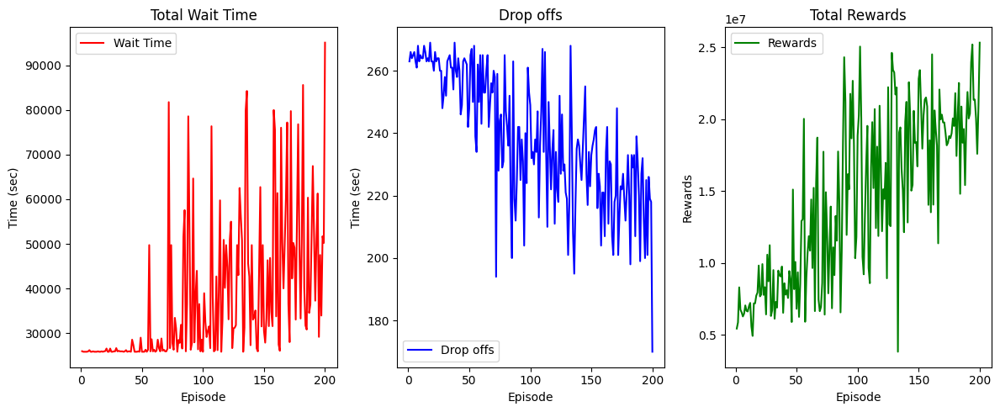

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# ✅ Load Training Data
df = pd.read_csv("training_metrics_5.csv")

# ✅ Plot Episode Performance
plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.plot(df["Episode"], df["Wait Time"], label="Wait Time", color="red")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Wait Time")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df["Episode"], df["Correct Drop-Offs"], label="Drop offs", color="blue")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Drop offs")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df["Episode"], df["Service Time"], label="Service Time", color="blue")
plt.xlabel("Episode")
plt.ylabel("Time (sec)")
plt.title("Total Service Time")
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df["Episode"], df["Energy Usage"], label="Energy Usage", color="green")
plt.xlabel("Episode")
plt.ylabel("Energy Units")
plt.title("Total Energy Usage")
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df["Episode"], df["Total Reward"], label="Rewards", color="green")
plt.xlabel("Episode")
plt.ylabel("Rewards")
plt.title("Total Rewards")
plt.legend()


# Correct Drop-Offs

plt.tight_layout()
plt.show()


# CUDA availabiltiy

In [2]:
import torch
print("CUDA Available:", torch.cuda.is_available())  # ✅ Should print True if CUDA is enabled


CUDA Available: True


# Test the trained model 

In [ ]:


import gym
import numpy as np
import pygame
import pandas as pd
from gym import spaces

class ElevatorEnv(gym.Env):
    def __init__(self, num_floors=6, num_elevators=1, csv_file="passengers_01.csv"):
        super(ElevatorEnv, self).__init__()
        self.num_floors = num_floors
        self.num_elevators = num_elevators
        self.time_per_floor = 5  # 5 seconds per floor movement
        self.time_per_step = 5  # 5 seconds per step in simulation
        self.max_capacity = 10  # Maximum passengers per elevator

        # ✅ Initialize Metrics
        self.service_times = []  
        self.passenger_board_times = {}  
        self.passenger_wait_times = {}  
        self.passenger_destinations = {}  # ✅ Track where each passenger wants to go

        self.wait_times = []  
        self.dropped_off_count = 0  # ✅ Track correct drop-offs
        self.correct_drop_off_count = 0  # ✅ Track total correct drop-offs per episode


        # Load passenger data from CSV
        self.passenger_data = pd.read_csv(csv_file)
        self.passenger_data['Time'] = pd.to_datetime(self.passenger_data['Time'], format='%I:%M:%S %p')
        self.passenger_data.sort_values(by='Time', inplace=True)
        self.current_index = 0
        
        # ✅ Initialize Environment State
        self.state = {
            'elevator_positions': np.ones(num_elevators, dtype=int),  # Elevators start at floor 1
            'passengers_waiting': {floor: {'up': [], 'down': []} for floor in range(1, num_floors+1)},
            'elevator_passengers': [[] for _ in range(num_elevators)],
            'elevator_actions': [1] * num_elevators,  
            'elevator_load': [0] * num_elevators  
        }

        self.current_time = self.passenger_data['Time'].min()
        self.energy_usage = []
        self.service_efficiency = []
        self.mode = "non_rush_hour"  
        

        #✅ Pygame Setup (Commented out if not using visualization)
        pygame.init()
        self.screen_width = 800
        self.screen_height = max(600, num_floors * 100)
        self.screen = pygame.display.set_mode((self.screen_width, self.screen_height))
        pygame.display.set_caption("Elevator Simulation")
        self.clock = pygame.time.Clock()
    
    def get_q_table(self):
        """Return the Q-table as a Pandas DataFrame for visualization."""
        q_df = pd.DataFrame(self.q_table, columns=["Down (-1)", "Stay (0)", "Up (+1)"])
        q_df.index.name = "Floor"
        return q_df
    

    
    def step(self, actions):
        """Q-learning update and environment step logic for multiple elevators."""
        
        energy_consumed = 0  # Track energy usage per step
        
        # energy_consumed = np.zeros(self.num_elevators)  # ✅ Track energy usage per step
        rewards = np.zeros(self.num_elevators)  # Store rewards for each elevator
        
        # ✅ Continuously update passenger wait times at each time step
        self.update_wait_times()

        # ✅ Get Current State Before Action
        state = self.get_state()

        # ✅ Determine Mode Before Updating State
        self.determine_mode()

        for i in range(self.num_elevators):
            action = actions[i]  # Get the action for this elevator

            # ✅ Update Elevator Actions
            self.state['elevator_actions'][i] = action  

            # ✅ Apply Movement Constraints (Avoid moving out of bounds)
            move = action - 1  # Convert (0,1,2) -> (-1,0,+1)
            old_position = self.state['elevator_positions'][i]
            new_position = max(1, min(self.num_floors, old_position + move))

            if new_position != old_position:
                energy_consumed += abs(move)  

            self.state['elevator_positions'][i] = new_position  

            # ✅ Check if passengers reached their destination
            exited_passengers = [(p_id, dest) for p_id, dest in self.state['elevator_passengers'][i] if dest == new_position]
            for passenger_id, destination_floor in exited_passengers:
                self.track_service_time(passenger_id, self.current_time, new_position)  

            # ✅ Remove passengers who reached their destination
            self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if d != new_position]
            self.state['elevator_load'][i] = len(self.state['elevator_passengers'][i])

            # ✅ Pick up new passengers if space is available
            floor = self.state['elevator_positions'][i]
            if self.state['elevator_load'][i] < self.max_capacity:
                direction = 'up' if move > 0 else 'down'
                while self.state['passengers_waiting'][floor][direction] and self.state['elevator_load'][i] < self.max_capacity:
                    passenger_id, destination = self.state['passengers_waiting'][floor][direction].pop(0)

                    self.passenger_board_times[passenger_id] = self.current_time  
                    self.passenger_destinations[passenger_id] = destination  # ✅ Track their destination floor
                    self.track_wait_time(passenger_id, self.current_time)

                    self.state['elevator_passengers'][i].append((passenger_id, destination))
                    self.state['elevator_load'][i] += 1

            # ✅ Compute Reward for Current Step
            rewards[i] = self.compute_reward(i)  # ✅ Separate reward per elevator

        # ✅ Get Next State After Action
        next_state = self.get_state()

        # ✅ Move Time Forward in 5-Second Increments
        self.current_time += pd.Timedelta(seconds=self.time_per_step)

        # ✅ Update Passengers Based on Simulation Time
        self.update_passengers()
        


        # ✅ Debugging: Print Energy Tracking
        # print(f"⚡ DEBUG: Energy Used This Step = {energy_consumed}")
            
        # ✅ Update service times for passengers inside the elevator
        self.update_service_times()

        # ✅ Observation & Info
        obs = self._get_observation()
        done = False  
        info = {'energy': energy_consumed, 'reward': np.sum(rewards),  # ✅ Sum of all rewards
                'total_wait_time': np.sum(self.wait_times) if self.wait_times else 0,
                'total_service_time': np.sum(self.service_times) if self.service_times else 0,
                'correct_drop_offs': np.sum(self.correct_drop_off_count)
                }
        
        return obs, rewards, done, info

    
    
    def modify_action_based_on_mode(self, elevator_id, action):
        """Modify action based on the mode (rush hour vs. non-rush hour)."""
        original_action = action

        if self.mode == "rush_hour":
            return action  # Execute normal Q-learning action (no changes)
        
        elif self.mode == "non_rush_hour":
            if self.state['elevator_load'][elevator_id] == 0:
                action = 1  # Stay in place
            
        # print(f"🚦 Elevator {elevator_id+1} Action Modified: {original_action} → {action} (Mode: {self.mode})")
        return action


    def update_passengers(self):
        """Add passengers to the waiting queue based on CSV data and simulation time."""
        
        while self.current_index < len(self.passenger_data) and self.passenger_data.iloc[self.current_index]['Time'] <= self.current_time:
            row = self.passenger_data.iloc[self.current_index]
            passenger_id = row['Passenger ID']
            floor = int(row['Floor'])
            direction = 'up' if row['Direction (Up/Down)'].strip().lower() == 'up' else 'down'
            destination = int(row['Destination Floor'])

            # ✅ Store passenger's arrival time (for continuous wait time tracking)
            if passenger_id not in self.passenger_wait_times:
                self.passenger_wait_times[passenger_id] = self.current_time  

            # ✅ Add passenger to waiting queue
            self.state['passengers_waiting'][floor][direction].append((passenger_id, destination))

            # 🔍 Debugging Output
            # print(f"🟢 Passenger {passenger_id} arrived at Floor {floor} at {self.current_time.strftime('%I:%M:%S %p')}")

            self.current_index += 1
            
            
    def determine_mode(self):
        """Dynamically determine Rush Hour vs. Non-Rush Hour mode based on recent data trends."""
        
        recent_window = 10  # Use last 10 time steps for trend analysis

        # ✅ **FIX: Compute Correct Total Wait Time**
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
            
            # ✅ **Fix: Compute Recent Wait Time Trends** (Convert timestamps to seconds)
            wait_times_list = [(self.current_time - arrival_time).total_seconds() for arrival_time in self.passenger_wait_times.values()]
            avg_waiting_trend = np.mean(wait_times_list[-recent_window:]) if len(wait_times_list) >= recent_window else np.mean(wait_times_list) if wait_times_list else 0
            avg_wait_time_trend = total_wait_time / max(len(self.passenger_wait_times), 1)  # Avoid division by zero

        else:
            total_wait_time = 0  # No waiting passengers
            avg_waiting_trend = 0
            avg_wait_time_trend = 0

        # ✅ **NEW**: Dynamic Thresholds Based on Real Wait Times
        dynamic_waiting_threshold = max(10, avg_waiting_trend * 1.5)  # Scale dynamically
        dynamic_wait_time_threshold = max(20, avg_wait_time_trend * 1.5)  # Scale dynamically

        total_waiting = self.total_waiting_passengers()

        # ✅ **Improved Mode Switching Logic**
        if total_waiting > dynamic_waiting_threshold or avg_wait_time_trend > dynamic_wait_time_threshold:
            self.mode = "rush_hour"  # 🚀 **Switch to Time-Efficient Mode**
        else:
            self.mode = "non_rush_hour"  # 🌱 **Switch to Energy-Efficient Mode**

        # ✅ Debugging Output
        # print(f"🚦 Mode Updated: {self.mode} | 🚶 Total Waiting: {total_waiting} | ⏳ Avg Wait Trend: {avg_wait_time_trend:.2f}s | 📊 Thresholds: {dynamic_waiting_threshold:.2f}, {dynamic_wait_time_threshold:.2f}")


        # print(f"🚦 Mode Updated: {self.mode} | Total Waiting: {total_waiting} | Avg Wait Trend: {avg_wait_time_trend:.2f}s | Thresholds: {dynamic_waiting_threshold}, {dynamic_wait_time_threshold}")

        
    def normalize_reward(value, min_val, max_val):
        """Normalize reward value between -1 and 1."""
        return 2 * ((value - min_val) / (max_val - min_val)) - 1
    
    
    def compute_reward(self, elevator_id):
        """Compute reward based on passengers entering, exiting, wait times, and energy usage."""

        reward = 0

        # ✅ Current Elevator Stats
        num_passengers = self.state['elevator_load'][elevator_id]  # Passengers inside
        total_waiting = self.total_waiting_passengers()  # Waiting passengers in the system
        total_energy = sum(self.energy_usage)  # Total energy usage
        num_active_elevators = sum(1 for load in self.state['elevator_load'] if load > 0)  # Elevators in use
        idle_time = self.state['elevator_actions'][elevator_id] == 1  # Elevator idle check
        
        # ✅ Step-wise energy consumption
        current_step_energy = self.energy_usage  # ✅ Energy used in the current step ONLY
        
        energy_at_step = self.energy_usage[-1] if self.energy_usage else 0  # ✅ Get last step energy

        
         # ✅ Count Drop-Offs
        correct_drop_off = self.dropped_off_count  # ✅ Correctly dropped-off passengers
        self.dropped_off_count = 0  # 

        # ✅ Debugging Output
        # print(f"🚪 Correct Drop-Off Count: {correct_drop_off}")

        # ✅ Compute Continuous Wait Time for Waiting Passengers1
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        # ✅ Compute Time Inside Elevator for Boarded Passengers
        # ✅ **Compute Average Service Time (For Passengers Inside the Elevator)**
        # ✅ **Compute Total Service Time (For Passengers Inside the Elevator)**
        if self.passenger_board_times:
            total_service_time = sum([
                (self.current_time - boarding_time).total_seconds()
                for boarding_time in self.passenger_board_times.values()
            ])
        else:
            total_service_time = 0  # No passengers inside


        # ✅ Track Boarding & Drop-Offs
        newly_boarded = len(self.state['elevator_passengers'][elevator_id])  # Passengers who entered
        

        # ✅ Debugging Output
        # print(f"🕒 Time: {self.current_time.strftime('%I:%M:%S %p')} | 🚦 Mode: {self.mode}")
        # print(f"🚶 Total Wait Time: {total_wait_time:.2f} sec | 🏢 Inside Elevator Time: {total_service_time:.2f} sec")
        # print(f"🚪 Boarded: {newly_boarded}  | ✅ Correct Drop Off: {correct_drop_off} |")

        # ✅ 🚀 **Rush Hour Mode**: Focus on **fast passenger movement**
        if self.mode == "rush_hour":
            reward += newly_boarded * 700  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 700  # ✅ Reward for correct drop-off

            # ❌ Penalties
            reward -= total_wait_time * 0.3  # ❌ Penalty for longer wait times
            reward -= total_service_time * 0.2  # ❌ Penalty for long elevator rides
            if idle_time and total_waiting > 0:
                reward -= 100  # ❌ Heavy penalty for idling while passengers wait
            if num_active_elevators > 1 and total_waiting < 5:
                reward -= 50  # ❌ Penalty for too many active elevators when not needed

        # ✅ 🌱 **Non-Rush Hour Mode**: Focus on **Energy Efficiency**
        else:
            reward += newly_boarded * 700  # ✅ Reward for picking up passengers
            reward += correct_drop_off * 700  # ✅ Reward for correct drop-off
            
            # ❌ Penalties
            reward -= total_wait_time * 0.3 # ❌ Moderate penalty for wait times
            reward -= total_service_time * 0.2  # ❌ Moderate penalty for long rides
            reward -= energy_at_step * 0.2  # ❌ High penalty for energy usage
            if num_active_elevators > 2:
                reward -= (num_active_elevators - 1) * 10  # ❌ Heavy penalty for too many elevators active
            if idle_time and total_waiting == 0:
                reward += 20  # ✅ Reward for staying idle when no one is waiting
                
        # print(f"🏆 Reward: {reward:.2f} | 🚕 Passengers: {num_passengers} | 🚶 Waiting: {total_waiting} | ⚡ Energy: {total_energy:.2f} | step {energy_at_step}")


        return reward


    def track_service_time(self, passenger_id, exit_time, exit_floor):
        """Track service time **only if passenger exits at the correct destination floor**."""
        
        
        if passenger_id in self.passenger_board_times:  
            boarding_time = self.passenger_board_times[passenger_id]  # Get entry time
            
            # ✅ Ensure passenger exists in `self.passenger_destinations`
            expected_destination = self.passenger_destinations.get(passenger_id, None)  
            
            if expected_destination is not None and exit_floor == expected_destination:
                service_time = (exit_time - boarding_time).total_seconds()  # Calculate time spent in elevator
                self.service_times.append(service_time)  # ✅ Store service time

                # ✅ Remove from tracking (Passenger exited)
                del self.passenger_board_times[passenger_id]
                del self.passenger_destinations[passenger_id]  # ✅ Remove destination tracking

                # ✅ **Track Correct Drop-Off**
                self.dropped_off_count += 1  
                self.correct_drop_off_count += 1  

                # ✅ Ensure Removal from Elevator State
                for i in range(self.num_elevators):
                    self.state['elevator_passengers'][i] = [(p, d) for p, d in self.state['elevator_passengers'][i] if p != passenger_id]

                # 🔍 Debugging Output
                # print(f"✅ Passenger {passenger_id} exited CORRECTLY at Floor {exit_floor} after {service_time:.2f} seconds.")

            else:
                # ❌ Handle Incorrect Exit
                print(f"⚠️ Passenger {passenger_id} exited at WRONG floor {exit_floor}, expected {expected_destination}.")


    def get_state(self):
        """Return the current state representation for multiple elevators in Q-learning."""

        state = []

        for i in range(self.num_elevators):
            # ✅ Current Elevator State
            state.append(self.state['elevator_positions'][i])  # Current floor
            state.append(self.state['elevator_load'][i])  # Load (number of passengers)

            # ✅ Waiting Passengers Information (Per Floor)
            total_waiting = self.total_waiting_passengers()
            state.append(total_waiting)

            # ✅ **NEW: Track Average Wait Time**
            # if self.passenger_wait_times:
            #     avg_wait_time = sum([
            #         (self.current_time - arrival_time).total_seconds()
            #         for arrival_time in self.passenger_wait_times.values()
            #     ])
            # else:
            #     avg_wait_time = 0  # No waiting passengers
            # state.append(avg_wait_time)

            # ✅ **NEW: Track Average Service Time**
            # if self.passenger_board_times:
            #     avg_service_time = sum([
            #         (self.current_time - boarding_time).total_seconds()
            #         for boarding_time in self.passenger_board_times.values()
            #     ])
            # else:
            #     avg_service_time = 0  # No passengers inside
            # state.append(avg_service_time)  # ✅ Add service time to state

            # ✅ Store All Passenger Destination Floors Instead of Average
            passenger_destinations = [p[1] for p in self.state['elevator_passengers'][i]]

            # ✅ If elevator is empty, append -1 (to maintain state consistency)
            if not passenger_destinations:
                state.append(-1)  # No passengers → Append a placeholder (-1)
            else:
                state.extend(passenger_destinations)  # Add all destination floors


            # # ✅ Time of Day (Rush Hour or Not)
            # is_rush_hour = 1 if self.mode == "rush_hour" else 0
            # state.append(is_rush_hour)

            # # ✅ Energy Consumption So Far
            # total_energy = sum(self.energy_usage)
            # state.append(total_energy)

            # ✅ **NEW: Improved Idle Time Tracking**
            # if self.state['elevator_actions'][i] == 1:  # If the elevator is idle
            #     self.state.setdefault("idle_times", [0] * self.num_elevators)
            #     self.state["idle_times"][i] += self.time_per_step
            # else:
            #     self.state["idle_times"][i] = 0
            # state.append(self.state["idle_times"][i])
            
            # ✅ **Include Correct Drop-Off Count in State**
            # state.append(self.dropped_off_count)  # ✅ Include correctly dropped passengers
            # self.dropped_off_count = 0 

        return tuple(state)  # Convert to tuple for Q-table lookup
    
    # def get_state(self):
    #     """Return a simplified state representation for Q-learning."""
    #     state = []
    #     for i in range(self.num_elevators):
    #         state.append(self.state['elevator_positions'][i])  # Elevator floor
    #         state.append(len(self.state['elevator_passengers'][i]))  # Passenger count inside
    #         state.append(len(self.state['passengers_waiting']))  # Total waiting passengers
    #     return tuple(state)  # ✅ More compact state




    def reset(self):
        """Reset environment to initial state for a new episode."""
        
        # ✅ Reset Elevator Positions (Start all at Floor 1)
        self.state['elevator_positions'] = np.ones(self.num_elevators, dtype=int)  
        
        self.dropped_off_count = 0 
        self.correct_drop_off_count = 0

        # ✅ Reset Simulation Time to Training Window (e.g., 9:00 AM)
        self.current_time = self.passenger_data['Time'].min()  # Reset to first timestamp (Modify if needed)
        self.current_index = 0  # Start from the beginning of passenger data

        # ✅ Fully Clear Tracking Variables
        self.energy_usage = []
        self.service_times = []
        self.wait_times = []
        self.passenger_board_times = {}
        self.passenger_wait_times = {}  # Clear previous passenger request times

        # ✅ **New:** Reset Idle Time Tracking for Elevators
        self.state["idle_times"] = [0] * self.num_elevators  

        # ✅ **New:** Ensure Elevator Mode is Reset
        self.mode = "non_rush_hour"

        # ✅ Clear Waiting Passengers from Previous Episodes
        self.state['passengers_waiting'] = {floor: {'up': [], 'down': []} for floor in range(1, self.num_floors + 1)}

        # ✅ Reset Passengers Inside Elevators
        self.state['elevator_passengers'] = [[] for _ in range(self.num_elevators)]  
        self.state['elevator_load'] = [0] * self.num_elevators  

        # ✅ Debugging: Print Reset Confirmation
        print(f"🔄 Reset Environment: Time = {self.current_time.strftime('%I:%M:%S %p')}, Mode = {self.mode}")
        print(f"🚪 Elevators Cleared, Waiting Queues Reset, Passengers Cleared!")

        return self._get_observation()


    def _get_observation(self):
        """Return current state as observation."""
        
        # ✅ **NEW FIX:** Compute Correct Total Wait Time
        if self.passenger_wait_times:
            total_wait_time = sum((self.current_time - arrival_time).total_seconds()
                                for arrival_time in self.passenger_wait_times.values())
        else:
            total_wait_time = 0  # No waiting passengers

        return {
            'elevator_positions': self.state['elevator_positions'].copy(),
            'elevator_actions': self.state['elevator_actions'].copy(),
            'elevator_load': self.state['elevator_load'].copy(),
            'average_wait_time': total_wait_time,  # ✅ **FIXED: Now Tracks Continuous Wait Time**
            'average_service_time': np.mean(self.service_times) if self.service_times else 0,
            'current_mode': 1 if self.mode == "rush_hour" else 0,  # Include Mode
            'total_energy': sum(self.energy_usage) if self.energy_usage else 0,  # ✅ **Track Total Energy Used**
            'total_waiting_passengers': self.total_waiting_passengers(),  # ✅ **Track Waiting Passengers Count**
            # 'idle_times': self.state["idle_times"].copy() , # ✅ **Track Elevator Idle Times**
            'correct_drop_offs': self.correct_drop_off_count,  # ✅ Track correctly dropped-off passengers
        }



    def update_wait_times(self):
        """Continuously update wait time for all waiting passengers at every step."""

        current_time = self.current_time  # Get the current simulation time

        for floor in range(1, self.num_floors + 1):
            for direction in ['up', 'down']:
                for i, (passenger_id, _) in enumerate(self.state['passengers_waiting'][floor][direction]):

                    # ✅ If the passenger does not have an arrival time recorded, set it
                    if passenger_id not in self.passenger_wait_times:
                        self.passenger_wait_times[passenger_id] = current_time  # Set initial arrival time

                    # ✅ Compute wait time for the passenger
                    arrival_time = self.passenger_wait_times[passenger_id]
                    wait_time = (current_time - arrival_time).total_seconds()  # Calculate elapsed wait time

                    # ✅ Update the wait time dictionary with cumulative wait time
                    self.passenger_wait_times[passenger_id] = arrival_time  # Keep the original arrival time
                    
                    # ✅ Store updated wait time for analysis
                    self.wait_times.append(wait_time)  

                    # 🔍 Debugging Output
                    # print(f"⏳ Passenger {passenger_id} at Floor {floor} has been waiting for {wait_time:.2f} seconds.")

    
    def total_waiting_passengers(self):
        
        """Helper function to count total waiting passengers in the system."""
        return sum(len(self.state['passengers_waiting'][floor]['up']) + 
                len(self.state['passengers_waiting'][floor]['down']) 
                for floor in range(1, self.num_floors + 1))
        
    
    def track_wait_time(self, passenger_id, boarding_time):
        """Calculate and store wait time when a passenger enters the elevator."""
        if passenger_id in self.passenger_wait_times:
            request_time = self.passenger_wait_times.pop(passenger_id)  # Retrieve request time
            wait_time = (boarding_time - request_time).total_seconds()
            self.wait_times.append(wait_time)  # ✅ Store wait time

            # 🔍 Debugging Output
            # print(f"🟡 Passenger {passenger_id} entered elevator at {boarding_time} (Requested at {request_time})")
            # print(f"⏳ Wait Time Recorded: {wait_time} seconds")

    
    

            
    def update_service_times(self):
        """Continuously update the service time for all passengers inside the elevator."""
        
        current_time = self.current_time  # Current simulation time
        
        for elevator_id in range(self.num_elevators):
            for passenger_id, destination in self.state['elevator_passengers'][elevator_id]:
                
                # ✅ If the passenger already entered, update their service time
                if passenger_id in self.passenger_board_times:
                    boarding_time = self.passenger_board_times[passenger_id]
                    service_time = (current_time - boarding_time).total_seconds()
                    
                    # 🔍 Debugging Output
                    # print(f"⌛ Passenger {passenger_id} is inside Elevator {elevator_id+1} for {service_time:.2f} seconds. at {self.current_time.strftime('%I:%M:%S %p')}")


            
    def render_2d(self):
        """Render the environment using Pygame."""
        self.screen.fill((255, 255, 255))  
        floor_height = self.screen_height // self.num_floors

        # ✅ Display simulation time
        font = pygame.font.Font(None, 30)
        time_text = font.render(f"Time: {self.current_time.strftime('%I:%M:%S %p')}", True, (0, 0, 0))
        self.screen.blit(time_text, (self.screen_width // 2 - 50, 10))

        # ✅ Display Total Wait Time, Service Time, and Energy Consumption
        total_wait = sum(self.wait_times) if self.wait_times else 0
        total_service = sum(self.service_times) if self.service_times else 0
        total_energy = sum(self.energy_usage) if self.energy_usage else 0

        stats_text = font.render(
            f"🚶 Wait Time: {total_wait:.2f}s  |  ⏳ Service Time: {total_service:.2f}s  |  ⚡ Energy: {total_energy} units",
            True, (0, 0, 0)
        )
        self.screen.blit(stats_text, (self.screen_width // 2 - 250, 40))

        # ✅ Draw floors and waiting passengers
        for floor in range(1, self.num_floors+1):
            y = self.screen_height - floor * floor_height
            
            # Draw floor line
            pygame.draw.line(self.screen, (0, 0, 0), (0, y), (self.screen_width, y), 2)
            
            # Display floor number
            font = pygame.font.Font(None, 24)
            text = font.render(f"Floor {floor}", True, (0, 0, 0))
            self.screen.blit(text, (10, y + 5))

            # Display waiting passengers for up and down directions
            up_count = len(self.state['passengers_waiting'][floor]['up'])
            down_count = len(self.state['passengers_waiting'][floor]['down'])
            
            up_text = font.render(f"⬆ {up_count}", True, (255, 0, 0))  # Red for up
            down_text = font.render(f"⬇ {down_count}", True, (0, 0, 255))  # Blue for down
            self.screen.blit(up_text, (self.screen_width - 80, y + 5))
            self.screen.blit(down_text, (self.screen_width - 40, y + 5))

        # ✅ Draw elevators with load count
        elevator_width = 40
        elevator_spacing = self.screen_width // (self.num_elevators + 1)
        for i, pos in enumerate(self.state['elevator_positions']):
            x = (i + 1) * elevator_spacing - (elevator_width // 2)
            y = self.screen_height - pos * floor_height + 5  
            pygame.draw.rect(self.screen, (0, 0, 255), (x, y, elevator_width, floor_height - 10))

            # ✅ Display passengers inside elevator
            font = pygame.font.Font(None, 24)
            text = font.render(f"{self.state['elevator_load'][i]}/10", True, (255, 255, 255))
            self.screen.blit(text, (x + 10, y + 20))

        pygame.display.flip()
        self.clock.tick(10)

    def close(self):
        pygame.quit()




In [18]:
import numpy as np
import time
import pygame
import pandas as pd
import pickle

# ✅ Load the Trained Q-Table
with open("q_table_5.pkl", "rb") as f:
    q_table = pickle.load(f)

print("✅ Q-Table Loaded Successfully!")

# ✅ Initialize the Environment with CSV Data
env = ElevatorEnv(num_floors=6, num_elevators=3, csv_file="passengers_01.csv")

# ✅ Set the simulation to start at a specific time (e.g., 08:00 AM - 08:05 AM)
start_time = pd.to_datetime("09:00:00 AM", format="%I:%M:%S %p")
end_time = pd.to_datetime("09:05:00 AM", format="%I:%M:%S %p")

# ✅ Filter Passengers Only Between 08:00 AM - 08:05 AM
env.passenger_data = env.passenger_data[
    (env.passenger_data["Time"] >= start_time) & (env.passenger_data["Time"] <= end_time)
].copy()

# ✅ Reset environment to start at 08:00 AM
env.current_time = start_time
env.current_index = 0

print(f"✅ Running trained model simulation from {start_time.time()} until all passengers reach their destinations")

# ✅ Start the Simulation
running = True
while running:
    
    # ✅ Handle Pygame Events (Prevents Freezing)
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
    
    # ✅ Get Current State
    state = tuple(env.get_state()) 

    # ✅ Use Trained Q-Table to Choose Actions (Greedy Policy)
    actions = [np.argmax(q_table.get((state, i), np.zeros(3))) for i in range(3)]

    # ✅ Step the Environment
    obs, reward, done, info = env.step(actions)

    # ✅ Print Simulation Statistics
    print(f"🕒 Time: {env.current_time.time()} | Action: {actions} | Mode: {env.mode}")
    print("🏢 Elevator Positions:", obs["elevator_positions"])

    # ✅ Debug Waiting Passengers at Each Floor
    total_waiting = sum(
        len(passengers['up']) + len(passengers['down']) 
        for passengers in env.state['passengers_waiting'].values()
    )
    
    for floor, passengers in env.state['passengers_waiting'].items():
        if passengers['up'] or passengers['down']:
            print(f"  🚶 Floor {floor} - Waiting (Up: {len(passengers['up'])}, Down: {len(passengers['down'])})")
    
    # ✅ Debug Elevator Load
    total_in_elevators = sum(obs["elevator_load"])
    
    for i, load in enumerate(obs["elevator_load"]):
        print(f"  🏢 Elevator {i+1}: {load}/10 passengers")

    # ✅ Print Mode & Performance Metrics
    total_energy = sum(env.energy_usage)
    print(f"🚦 Mode: {env.mode} | 🚶 Wait Time: {info['total_wait_time']:.2f}s | ⏳ Service Time: {info['total_service_time']:.2f}s | ⚡ Energy Used: {total_energy} units")

    # ✅ Render Environment in Pygame
    env.render_2d()
    
    # ✅ Check Stopping Condition
    if total_waiting == 0 and total_in_elevators == 0:
        print("✅ All passengers have reached their destinations. Ending simulation.")
        break  # Stop the simulation when no passengers are left
    
    # ✅ Control Simulation Speed (Wait 0.5s for smoother visualization)
    time.sleep(0.5)

# ✅ Close Environment After Simulation
env.close()
print("✅ Simulation Complete. Environment Closed.")


✅ Q-Table Loaded Successfully!
✅ Running trained model simulation from 09:00:00 until all passengers reach their destinations
🕒 Time: 09:00:05 | Action: [2, 2, 2] | Mode: non_rush_hour
🏢 Elevator Positions: [2 2 2]
  🚶 Floor 3 - Waiting (Up: 3, Down: 0)
  🏢 Elevator 1: 0/10 passengers
  🏢 Elevator 2: 0/10 passengers
  🏢 Elevator 3: 0/10 passengers
🚦 Mode: non_rush_hour | 🚶 Wait Time: 0.00s | ⏳ Service Time: 0.00s | ⚡ Energy Used: 0 units
🕒 Time: 09:00:10 | Action: [2, 2, 2] | Mode: non_rush_hour
🏢 Elevator Positions: [3 3 3]
  🏢 Elevator 1: 3/10 passengers
  🏢 Elevator 2: 0/10 passengers
  🏢 Elevator 3: 0/10 passengers
🚦 Mode: non_rush_hour | 🚶 Wait Time: 0.00s | ⏳ Service Time: 0.00s | ⚡ Energy Used: 0 units
🕒 Time: 09:00:15 | Action: [1, 1, 1] | Mode: non_rush_hour
🏢 Elevator Positions: [3 3 3]
  🏢 Elevator 1: 3/10 passengers
  🏢 Elevator 2: 0/10 passengers
  🏢 Elevator 3: 0/10 passengers
🚦 Mode: non_rush_hour | 🚶 Wait Time: 0.00s | ⏳ Service Time: 0.00s | ⚡ Energy Used: 0 units
🕒 Ti